<a href="https://colab.research.google.com/github/Aakriti28/Generative-Adversarial-Networks/blob/master/DCGAN_for_CelebA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import sys
import torch
import torchvision
from torch import nn, optim
import torch.nn.functional as F
import torch.utils.data
import torchvision.datasets as dset
import torchvision.utils as vutils
from torch.utils.data import DataLoader
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [0]:
#Using GPU
print(sys.version)
device = 'cuda'
#Checking for GPU
print(torch.version.cuda)
print(torch.cuda.device_count())
print(torch.cuda.is_available())

3.6.9 (default, Apr 18 2020, 01:56:04) 
[GCC 8.4.0]
10.1
1
True


In [0]:
dataroot = 'drive/My Drive/Colab Notebooks/GANs/celeba'
image_size = 64
dataset = dset.ImageFolder(root = dataroot, 
                           transform = transforms.Compose([transforms.Resize(image_size), 
                                                                            transforms.CenterCrop(image_size), 
                                                                            transforms.ToTensor(), 
                                                                            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]))

batch = 64
data_loader = DataLoader(dataset, batch_size=batch, shuffle =True, num_workers = 2)
num_batches = len(data_loader)
print(num_batches)

46


torch.Size([64, 3, 64, 64])


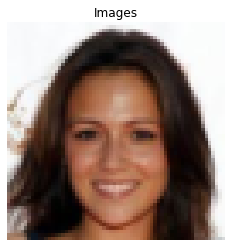

In [0]:
#display some images 
import matplotlib.pyplot as plt
import numpy as np

def imshow(img):
  #plt.imshow(np.transpose(img, (1, 2, 0)))
  #print(img.shape)
  npimg = img.cpu().numpy()
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.axis('off')
  plt.title('Images')
  plt.show()

dataiter = iter(data_loader)
images = dataiter.next()

print(images[0].shape)
imshow(torchvision.utils.make_grid(images[0][:1], padding = 2, normalize=True))
#print(' '.join('%10s' % [labels[i]] for i in range(4)))

In [0]:
def weights_init(m):
  classmate = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm' != -1):
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)

In [0]:
class DiscriminatorNet(torch.nn.Module):
  def __init__(self):
    super(DiscriminatorNet, self).__init__()
    self.main = nn.Sequential(
      nn.Conv2d(3, 128, kernel_size = 5, stride = 2, padding = 2, bias = False),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(128, 256, kernel_size = 5, stride = 2, padding = 2, bias = False),
      nn.BatchNorm2d(256),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(256, 512, kernel_size = 5, stride = 2, padding =2, bias = False),
      nn.BatchNorm2d(512),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(512, 1024, kernel_size = 5, stride = 2, padding = 2, bias = False),
      nn.BatchNorm2d(1024),
      nn.LeakyReLU(0.2, inplace=True),

      nn.Conv2d(1024, 1, kernel_size = 4, stride = 1, padding = 0, bias = False),
      nn.Sigmoid()
    )
    
  def forward(self, x):
    x = self.main(x)
    return x

discriminator = DiscriminatorNet().to(device)
d_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0001, betas = (0.5, 0.999))
print(discriminator)

DiscriminatorNet(
  (main): Sequential(
    (0): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(1024, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [0]:
def images_to_vectors(images):
  return images.view(images.size(0), 4096)

def vectors_to_images(vectors):
  return vectors.view(vectors.size(0), 3, 64, 64)

In [0]:
class GeneratorNet(torch.nn.Module):
  def __init__(self):
    super(GeneratorNet, self).__init__()
    self.main = nn.Sequential(
        nn.ConvTranspose2d(100, 1024, kernel_size = 4, stride = 1, padding = 0, bias = False),
        #nn.BatchNorm2d(1024),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(1024, 512, kernel_size = 4, stride = 2, padding = 1, bias =False),
        #nn.BatchNorm2d(512),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(512, 256, kernel_size = 4, stride = 2, padding = 1, bias=False),
        #nn.BatchNorm2d(256),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(256, 128, kernel_size = 4, stride = 2, padding = 1, bias=False),
        #nn.BatchNorm2d(128),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(128, 3, kernel_size = 4, stride = 2, padding = 1, bias=False),
        nn.Tanh()
    )
    

  def forward(self, x):
    #print(x)
    x = self.main(x)
    #print(x.shape)
    return x

generator = GeneratorNet().to(device)
g_optimizer = optim.Adam(generator.parameters(), lr = 0.0001, betas = (0.5, 0.999))

loss = nn.BCELoss()

print(generator)
print(loss)

GeneratorNet(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): ReLU(inplace=True)
    (8): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): Tanh()
  )
)
BCELoss()


In [0]:
def noise(size):
  n = Variable(torch.randn(size, 100, 1, 1))
  return n.to(device)

In [0]:
def ones_target(size):
  data = Variable(torch.ones(size, 1))
  return data.to(device)

def zeros_target(size):
  data = Variable(torch.zeros(size, 1))
  return data.to(device)

In [0]:
def train_discriminator(optimizer, real_data, fake_data):
  N = real_data.size(0)
  optimizer.zero_grad()

  prediction_real = discriminator(vectors_to_images(real_data)).to(device)
  loss_real = loss(prediction_real.reshape(-1, 1), ones_target(N))
  loss_real.backward()

  prediction_fake = discriminator(vectors_to_images(fake_data)).to(device)
  loss_fake = loss(prediction_fake.reshape(-1, 1), zeros_target(N))
  loss_fake.backward()

  optimizer.step()

  return loss_real+loss_fake, prediction_real, prediction_fake

In [0]:
def train_generator(optimizer, fake_data):
  N = fake_data.size(0)
  optimizer.zero_grad()

  prediction_fake = discriminator(vectors_to_images(fake_data)).to(device)
  loss_gen = loss(prediction_fake.reshape(-1, 1), ones_target(N))
  loss_gen.backward()

  optimizer.step()

  return loss_gen

In [0]:
num_test_samples = 4
test_noise = noise(num_test_samples)

In [0]:
def fit(num_epochs = 350):
  G_losses = []
  D_losses = []
  for epoch in range(num_epochs):
    d_loss = 0
    g_loss = 0
    for num_iter, (real_batch, _) in enumerate(data_loader):
      #print(len(data_loader))
      N = real_batch.size(0)
      #print(noise(N))

      real_data = Variable(real_batch).to(device)
      fake_data = generator(noise(N)).to(device)
      d_loss_now, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data.detach())
      d_loss += d_loss_now

      fake_data = generator(noise(N)).to(device)
      g_loss_now = train_generator(g_optimizer, fake_data)
      g_loss += g_loss_now

    D_losses.append(d_loss)
    G_losses.append(g_loss)
    print("Epoch no - " + str(epoch+1))
    print("Discriminator Loss : %f \t Generator_loss : %f" % (d_loss.item(), g_loss.item()))
    print("Accuracy on Real Data : %f \t Accuracy on fake Data : %f" % (d_pred_real.mean().item(), d_pred_fake.mean().item()))

    if((epoch+1)%10 ==0):
      with torch.no_grad():
        generated_data = generator(test_noise.detach())
        imshow(torchvision.utils.make_grid(vectors_to_images(generated_data)))

  plt.figure(figsize=(10,5))
  plt.title("Generator and Discriminator Loss During Training")
  plt.plot(G_losses,label="G")
  plt.plot(D_losses,label="D")
  plt.xlabel("iterations")
  plt.ylabel("Loss")
  plt.legend()
  plt.show()
    


Epoch no - 1
Discriminator Loss : 30.345346 	 Generator_loss : 664.139343
Accuracy on Real Data : 0.834066 	 Accuracy on fake Data : 0.000000
Epoch no - 2
Discriminator Loss : 10.124874 	 Generator_loss : 479.856110
Accuracy on Real Data : 0.976143 	 Accuracy on fake Data : 0.001089
Epoch no - 3
Discriminator Loss : 1.262480 	 Generator_loss : 302.685089
Accuracy on Real Data : 0.982190 	 Accuracy on fake Data : 0.015458
Epoch no - 4
Discriminator Loss : 0.470023 	 Generator_loss : 309.128540
Accuracy on Real Data : 0.999422 	 Accuracy on fake Data : 0.003196
Epoch no - 5
Discriminator Loss : 0.185436 	 Generator_loss : 318.448792
Accuracy on Real Data : 0.999804 	 Accuracy on fake Data : 0.002713
Epoch no - 6
Discriminator Loss : 0.156421 	 Generator_loss : 329.861420
Accuracy on Real Data : 0.999488 	 Accuracy on fake Data : 0.000807
Epoch no - 7
Discriminator Loss : 0.347548 	 Generator_loss : 350.113159
Accuracy on Real Data : 0.996593 	 Accuracy on fake Data : 0.000966
Epoch no - 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 10
Discriminator Loss : 10.959240 	 Generator_loss : 261.233215
Accuracy on Real Data : 0.865796 	 Accuracy on fake Data : 0.032940


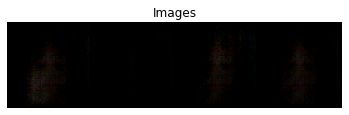

Epoch no - 11
Discriminator Loss : 9.414987 	 Generator_loss : 229.558182
Accuracy on Real Data : 0.986513 	 Accuracy on fake Data : 0.254354
Epoch no - 12
Discriminator Loss : 4.525229 	 Generator_loss : 246.880463
Accuracy on Real Data : 0.973093 	 Accuracy on fake Data : 0.067404
Epoch no - 13
Discriminator Loss : 14.098442 	 Generator_loss : 304.707703
Accuracy on Real Data : 0.972790 	 Accuracy on fake Data : 0.061424
Epoch no - 14
Discriminator Loss : 18.032368 	 Generator_loss : 219.949875
Accuracy on Real Data : 0.892825 	 Accuracy on fake Data : 0.083930
Epoch no - 15
Discriminator Loss : 15.390079 	 Generator_loss : 199.012772
Accuracy on Real Data : 0.947689 	 Accuracy on fake Data : 0.488081
Epoch no - 16
Discriminator Loss : 24.143690 	 Generator_loss : 202.448257
Accuracy on Real Data : 0.365133 	 Accuracy on fake Data : 0.108012
Epoch no - 17
Discriminator Loss : 19.209820 	 Generator_loss : 214.099518
Accuracy on Real Data : 0.991276 	 Accuracy on fake Data : 0.156253
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 20
Discriminator Loss : 24.390429 	 Generator_loss : 204.320755
Accuracy on Real Data : 0.959915 	 Accuracy on fake Data : 0.269223


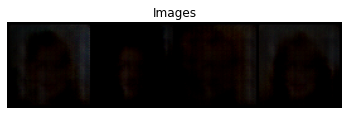

Epoch no - 21
Discriminator Loss : 12.601442 	 Generator_loss : 212.061142
Accuracy on Real Data : 0.963863 	 Accuracy on fake Data : 0.109339
Epoch no - 22
Discriminator Loss : 25.909765 	 Generator_loss : 215.824173
Accuracy on Real Data : 0.940525 	 Accuracy on fake Data : 0.091198
Epoch no - 23
Discriminator Loss : 25.746075 	 Generator_loss : 197.053955
Accuracy on Real Data : 0.871471 	 Accuracy on fake Data : 0.060099
Epoch no - 24
Discriminator Loss : 19.105047 	 Generator_loss : 242.587601
Accuracy on Real Data : 0.924462 	 Accuracy on fake Data : 0.033671
Epoch no - 25
Discriminator Loss : 22.779346 	 Generator_loss : 224.536804
Accuracy on Real Data : 0.768132 	 Accuracy on fake Data : 0.007229
Epoch no - 26
Discriminator Loss : 9.881772 	 Generator_loss : 235.538147
Accuracy on Real Data : 0.942615 	 Accuracy on fake Data : 0.041547
Epoch no - 27
Discriminator Loss : 14.169616 	 Generator_loss : 262.680908
Accuracy on Real Data : 0.995078 	 Accuracy on fake Data : 0.015241


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 30
Discriminator Loss : 15.384174 	 Generator_loss : 241.465332
Accuracy on Real Data : 0.782017 	 Accuracy on fake Data : 0.193711


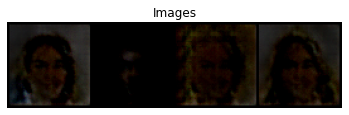

Epoch no - 31
Discriminator Loss : 19.133741 	 Generator_loss : 240.334366
Accuracy on Real Data : 0.979901 	 Accuracy on fake Data : 0.013384
Epoch no - 32
Discriminator Loss : 15.983325 	 Generator_loss : 254.571167
Accuracy on Real Data : 0.978075 	 Accuracy on fake Data : 0.010282
Epoch no - 33
Discriminator Loss : 22.028713 	 Generator_loss : 246.261169
Accuracy on Real Data : 0.822082 	 Accuracy on fake Data : 0.070448
Epoch no - 34
Discriminator Loss : 13.051484 	 Generator_loss : 229.730469
Accuracy on Real Data : 0.332775 	 Accuracy on fake Data : 0.000036
Epoch no - 35
Discriminator Loss : 23.824474 	 Generator_loss : 256.687042
Accuracy on Real Data : 0.895918 	 Accuracy on fake Data : 0.168678
Epoch no - 36
Discriminator Loss : 21.836668 	 Generator_loss : 240.964523
Accuracy on Real Data : 0.972255 	 Accuracy on fake Data : 0.148433
Epoch no - 37
Discriminator Loss : 20.757938 	 Generator_loss : 241.844589
Accuracy on Real Data : 0.903124 	 Accuracy on fake Data : 0.169636

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 40
Discriminator Loss : 18.068066 	 Generator_loss : 280.733673
Accuracy on Real Data : 0.632136 	 Accuracy on fake Data : 0.192662


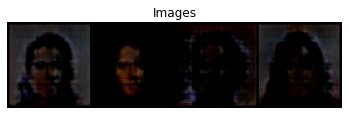

Epoch no - 41
Discriminator Loss : 10.835292 	 Generator_loss : 250.199539
Accuracy on Real Data : 0.575280 	 Accuracy on fake Data : 0.048971
Epoch no - 42
Discriminator Loss : 19.537041 	 Generator_loss : 251.070877
Accuracy on Real Data : 0.983346 	 Accuracy on fake Data : 0.099334
Epoch no - 43
Discriminator Loss : 24.280434 	 Generator_loss : 250.753494
Accuracy on Real Data : 0.992020 	 Accuracy on fake Data : 0.646268
Epoch no - 44
Discriminator Loss : 23.641893 	 Generator_loss : 210.224167
Accuracy on Real Data : 0.141485 	 Accuracy on fake Data : 0.000952
Epoch no - 45
Discriminator Loss : 25.480711 	 Generator_loss : 223.499786
Accuracy on Real Data : 0.730378 	 Accuracy on fake Data : 0.013525
Epoch no - 46
Discriminator Loss : 19.076195 	 Generator_loss : 240.894318
Accuracy on Real Data : 0.762244 	 Accuracy on fake Data : 0.007403
Epoch no - 47
Discriminator Loss : 18.782372 	 Generator_loss : 227.618256
Accuracy on Real Data : 0.496933 	 Accuracy on fake Data : 0.002534

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 50
Discriminator Loss : 26.892570 	 Generator_loss : 224.802124
Accuracy on Real Data : 0.598235 	 Accuracy on fake Data : 0.008613


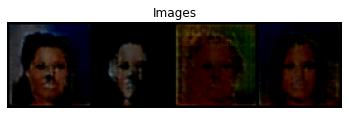

Epoch no - 51
Discriminator Loss : 16.082527 	 Generator_loss : 237.111832
Accuracy on Real Data : 0.657478 	 Accuracy on fake Data : 0.001517
Epoch no - 52
Discriminator Loss : 28.153728 	 Generator_loss : 224.210724
Accuracy on Real Data : 0.928024 	 Accuracy on fake Data : 0.023301
Epoch no - 53
Discriminator Loss : 16.136307 	 Generator_loss : 220.785828
Accuracy on Real Data : 0.964193 	 Accuracy on fake Data : 0.097708
Epoch no - 54
Discriminator Loss : 15.551418 	 Generator_loss : 219.581146
Accuracy on Real Data : 0.980469 	 Accuracy on fake Data : 0.269174
Epoch no - 55
Discriminator Loss : 22.718262 	 Generator_loss : 218.248413
Accuracy on Real Data : 0.614075 	 Accuracy on fake Data : 0.059204
Epoch no - 56
Discriminator Loss : 18.530125 	 Generator_loss : 236.570099
Accuracy on Real Data : 0.959305 	 Accuracy on fake Data : 0.456047
Epoch no - 57
Discriminator Loss : 17.353939 	 Generator_loss : 235.544952
Accuracy on Real Data : 0.977208 	 Accuracy on fake Data : 0.054796

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 60
Discriminator Loss : 20.062719 	 Generator_loss : 228.825729
Accuracy on Real Data : 0.957634 	 Accuracy on fake Data : 0.136119


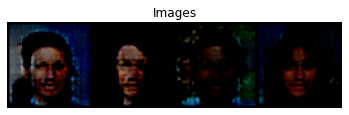

Epoch no - 61
Discriminator Loss : 16.223650 	 Generator_loss : 216.441040
Accuracy on Real Data : 0.940259 	 Accuracy on fake Data : 0.046764
Epoch no - 62
Discriminator Loss : 22.006926 	 Generator_loss : 228.758026
Accuracy on Real Data : 0.198653 	 Accuracy on fake Data : 0.046606
Epoch no - 63
Discriminator Loss : 32.085529 	 Generator_loss : 183.462952
Accuracy on Real Data : 0.974704 	 Accuracy on fake Data : 0.327561
Epoch no - 64
Discriminator Loss : 16.346415 	 Generator_loss : 218.743378
Accuracy on Real Data : 0.964292 	 Accuracy on fake Data : 0.104612
Epoch no - 65
Discriminator Loss : 11.507254 	 Generator_loss : 220.911057
Accuracy on Real Data : 0.805806 	 Accuracy on fake Data : 0.030328
Epoch no - 66
Discriminator Loss : 10.915784 	 Generator_loss : 244.304291
Accuracy on Real Data : 0.724172 	 Accuracy on fake Data : 0.002481
Epoch no - 67
Discriminator Loss : 32.543823 	 Generator_loss : 196.294189
Accuracy on Real Data : 0.691562 	 Accuracy on fake Data : 0.100004

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 70
Discriminator Loss : 11.366925 	 Generator_loss : 227.318146
Accuracy on Real Data : 0.755944 	 Accuracy on fake Data : 0.036743


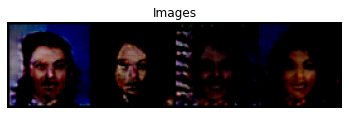

Epoch no - 71
Discriminator Loss : 21.260269 	 Generator_loss : 255.058853
Accuracy on Real Data : 0.704692 	 Accuracy on fake Data : 0.082313
Epoch no - 72
Discriminator Loss : 24.409212 	 Generator_loss : 249.335022
Accuracy on Real Data : 0.916215 	 Accuracy on fake Data : 0.077171
Epoch no - 73
Discriminator Loss : 12.846083 	 Generator_loss : 222.572037
Accuracy on Real Data : 0.607788 	 Accuracy on fake Data : 0.009498
Epoch no - 74
Discriminator Loss : 14.711396 	 Generator_loss : 214.100677
Accuracy on Real Data : 0.976474 	 Accuracy on fake Data : 0.042148
Epoch no - 75
Discriminator Loss : 7.412890 	 Generator_loss : 223.287476
Accuracy on Real Data : 0.933419 	 Accuracy on fake Data : 0.029609
Epoch no - 76
Discriminator Loss : 16.725256 	 Generator_loss : 254.605087
Accuracy on Real Data : 0.841192 	 Accuracy on fake Data : 0.026496
Epoch no - 77
Discriminator Loss : 19.367924 	 Generator_loss : 244.258942
Accuracy on Real Data : 0.990346 	 Accuracy on fake Data : 0.255102


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 80
Discriminator Loss : 12.402560 	 Generator_loss : 232.477402
Accuracy on Real Data : 0.203985 	 Accuracy on fake Data : 0.000425


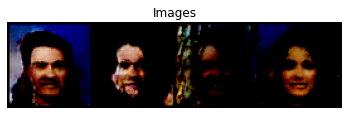

Epoch no - 81
Discriminator Loss : 25.270432 	 Generator_loss : 249.632843
Accuracy on Real Data : 0.910164 	 Accuracy on fake Data : 0.038927
Epoch no - 82
Discriminator Loss : 12.013795 	 Generator_loss : 217.007507
Accuracy on Real Data : 0.960993 	 Accuracy on fake Data : 0.071919
Epoch no - 83
Discriminator Loss : 15.554031 	 Generator_loss : 243.113190
Accuracy on Real Data : 0.871181 	 Accuracy on fake Data : 0.285803
Epoch no - 84
Discriminator Loss : 14.469990 	 Generator_loss : 222.060867
Accuracy on Real Data : 0.402530 	 Accuracy on fake Data : 0.001721
Epoch no - 85
Discriminator Loss : 13.360936 	 Generator_loss : 239.528290
Accuracy on Real Data : 0.725316 	 Accuracy on fake Data : 0.018729
Epoch no - 86
Discriminator Loss : 22.653149 	 Generator_loss : 233.844330
Accuracy on Real Data : 0.840961 	 Accuracy on fake Data : 0.125079
Epoch no - 87
Discriminator Loss : 11.588617 	 Generator_loss : 224.528412
Accuracy on Real Data : 0.868723 	 Accuracy on fake Data : 0.085321

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 90
Discriminator Loss : 19.153135 	 Generator_loss : 213.955276
Accuracy on Real Data : 0.882170 	 Accuracy on fake Data : 0.022205


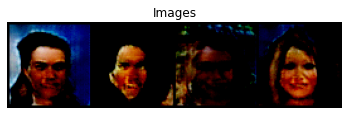

Epoch no - 91
Discriminator Loss : 10.110880 	 Generator_loss : 192.855743
Accuracy on Real Data : 0.362959 	 Accuracy on fake Data : 0.017427
Epoch no - 92
Discriminator Loss : 19.945724 	 Generator_loss : 219.609467
Accuracy on Real Data : 0.884572 	 Accuracy on fake Data : 0.360697
Epoch no - 93
Discriminator Loss : 10.564318 	 Generator_loss : 202.195526
Accuracy on Real Data : 0.905985 	 Accuracy on fake Data : 0.009544
Epoch no - 94
Discriminator Loss : 9.344897 	 Generator_loss : 226.844147
Accuracy on Real Data : 0.977953 	 Accuracy on fake Data : 0.099306
Epoch no - 95
Discriminator Loss : 14.045082 	 Generator_loss : 218.046051
Accuracy on Real Data : 0.701996 	 Accuracy on fake Data : 0.001097
Epoch no - 96
Discriminator Loss : 23.280573 	 Generator_loss : 232.422592
Accuracy on Real Data : 0.883769 	 Accuracy on fake Data : 0.034884
Epoch no - 97
Discriminator Loss : 13.570187 	 Generator_loss : 217.248123
Accuracy on Real Data : 0.997822 	 Accuracy on fake Data : 0.378100


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 100
Discriminator Loss : 22.384693 	 Generator_loss : 239.913544
Accuracy on Real Data : 0.640835 	 Accuracy on fake Data : 0.024990


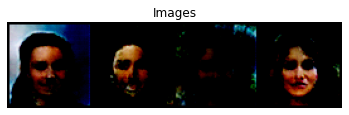

Epoch no - 101
Discriminator Loss : 21.147570 	 Generator_loss : 210.978317
Accuracy on Real Data : 0.976734 	 Accuracy on fake Data : 0.027832
Epoch no - 102
Discriminator Loss : 8.009946 	 Generator_loss : 198.937225
Accuracy on Real Data : 0.882980 	 Accuracy on fake Data : 0.007748
Epoch no - 103
Discriminator Loss : 28.037928 	 Generator_loss : 222.646713
Accuracy on Real Data : 0.931535 	 Accuracy on fake Data : 0.221349
Epoch no - 104
Discriminator Loss : 14.417480 	 Generator_loss : 215.979996
Accuracy on Real Data : 0.407751 	 Accuracy on fake Data : 0.007060
Epoch no - 105
Discriminator Loss : 22.914961 	 Generator_loss : 229.767075
Accuracy on Real Data : 0.988432 	 Accuracy on fake Data : 0.387329
Epoch no - 106
Discriminator Loss : 13.384449 	 Generator_loss : 205.205978
Accuracy on Real Data : 0.772676 	 Accuracy on fake Data : 0.009475
Epoch no - 107
Discriminator Loss : 9.056728 	 Generator_loss : 214.644287
Accuracy on Real Data : 0.866434 	 Accuracy on fake Data : 0.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 110
Discriminator Loss : 15.092607 	 Generator_loss : 214.444885
Accuracy on Real Data : 0.889342 	 Accuracy on fake Data : 0.001770


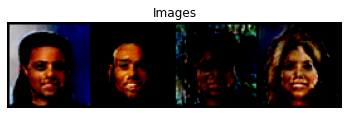

Epoch no - 111
Discriminator Loss : 9.179198 	 Generator_loss : 194.054276
Accuracy on Real Data : 0.972114 	 Accuracy on fake Data : 0.066013
Epoch no - 112
Discriminator Loss : 7.714313 	 Generator_loss : 212.597946
Accuracy on Real Data : 0.996104 	 Accuracy on fake Data : 0.431379
Epoch no - 113
Discriminator Loss : 21.052542 	 Generator_loss : 230.946747
Accuracy on Real Data : 0.908949 	 Accuracy on fake Data : 0.213737
Epoch no - 114
Discriminator Loss : 12.595600 	 Generator_loss : 218.696930
Accuracy on Real Data : 0.639171 	 Accuracy on fake Data : 0.032344
Epoch no - 115
Discriminator Loss : 25.050907 	 Generator_loss : 233.739304
Accuracy on Real Data : 0.701441 	 Accuracy on fake Data : 0.028786
Epoch no - 116
Discriminator Loss : 13.460959 	 Generator_loss : 209.475693
Accuracy on Real Data : 0.758446 	 Accuracy on fake Data : 0.039607
Epoch no - 117
Discriminator Loss : 16.274872 	 Generator_loss : 217.931671
Accuracy on Real Data : 0.978867 	 Accuracy on fake Data : 0.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 120
Discriminator Loss : 41.893013 	 Generator_loss : 237.932144
Accuracy on Real Data : 0.833591 	 Accuracy on fake Data : 0.120745


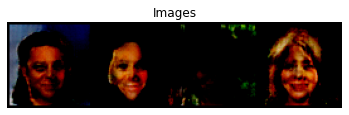

Epoch no - 121
Discriminator Loss : 15.405086 	 Generator_loss : 206.372406
Accuracy on Real Data : 0.711886 	 Accuracy on fake Data : 0.038733
Epoch no - 122
Discriminator Loss : 14.769590 	 Generator_loss : 217.045639
Accuracy on Real Data : 0.869600 	 Accuracy on fake Data : 0.005054
Epoch no - 123
Discriminator Loss : 8.602490 	 Generator_loss : 200.965744
Accuracy on Real Data : 0.881170 	 Accuracy on fake Data : 0.037464
Epoch no - 124
Discriminator Loss : 9.130103 	 Generator_loss : 208.327850
Accuracy on Real Data : 0.975556 	 Accuracy on fake Data : 0.305555
Epoch no - 125
Discriminator Loss : 9.455872 	 Generator_loss : 210.078613
Accuracy on Real Data : 0.764839 	 Accuracy on fake Data : 0.026932
Epoch no - 126
Discriminator Loss : 39.135845 	 Generator_loss : 236.473785
Accuracy on Real Data : 0.441518 	 Accuracy on fake Data : 0.001182
Epoch no - 127
Discriminator Loss : 17.153639 	 Generator_loss : 209.507111
Accuracy on Real Data : 0.754768 	 Accuracy on fake Data : 0.01

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 130
Discriminator Loss : 9.498336 	 Generator_loss : 207.546921
Accuracy on Real Data : 0.733407 	 Accuracy on fake Data : 0.126544


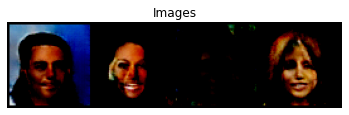

Epoch no - 131
Discriminator Loss : 21.656878 	 Generator_loss : 240.144684
Accuracy on Real Data : 0.997604 	 Accuracy on fake Data : 0.532053
Epoch no - 132
Discriminator Loss : 19.403826 	 Generator_loss : 215.558136
Accuracy on Real Data : 0.831989 	 Accuracy on fake Data : 0.001945
Epoch no - 133
Discriminator Loss : 9.914571 	 Generator_loss : 208.198227
Accuracy on Real Data : 0.910989 	 Accuracy on fake Data : 0.025171
Epoch no - 134
Discriminator Loss : 6.377525 	 Generator_loss : 202.055237
Accuracy on Real Data : 0.946052 	 Accuracy on fake Data : 0.044219
Epoch no - 135
Discriminator Loss : 29.519779 	 Generator_loss : 242.688095
Accuracy on Real Data : 0.714470 	 Accuracy on fake Data : 0.217720
Epoch no - 136
Discriminator Loss : 9.885547 	 Generator_loss : 216.062958
Accuracy on Real Data : 0.959880 	 Accuracy on fake Data : 0.039735
Epoch no - 137
Discriminator Loss : 9.743524 	 Generator_loss : 212.167908
Accuracy on Real Data : 0.879196 	 Accuracy on fake Data : 0.025

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 140
Discriminator Loss : 60.377811 	 Generator_loss : 222.762497
Accuracy on Real Data : 0.980627 	 Accuracy on fake Data : 0.159000


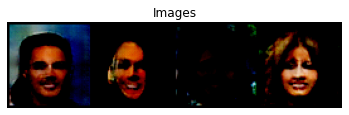

Epoch no - 141
Discriminator Loss : 18.206797 	 Generator_loss : 203.268250
Accuracy on Real Data : 0.889317 	 Accuracy on fake Data : 0.048739
Epoch no - 142
Discriminator Loss : 8.680589 	 Generator_loss : 193.175613
Accuracy on Real Data : 0.831654 	 Accuracy on fake Data : 0.014978
Epoch no - 143
Discriminator Loss : 10.262194 	 Generator_loss : 208.857483
Accuracy on Real Data : 0.712076 	 Accuracy on fake Data : 0.036623
Epoch no - 144
Discriminator Loss : 12.098285 	 Generator_loss : 217.107239
Accuracy on Real Data : 0.740707 	 Accuracy on fake Data : 0.021630
Epoch no - 145
Discriminator Loss : 15.840689 	 Generator_loss : 214.780991
Accuracy on Real Data : 0.888426 	 Accuracy on fake Data : 0.010345
Epoch no - 146
Discriminator Loss : 6.095999 	 Generator_loss : 210.638519
Accuracy on Real Data : 0.946600 	 Accuracy on fake Data : 0.020553
Epoch no - 147
Discriminator Loss : 5.513114 	 Generator_loss : 214.297333
Accuracy on Real Data : 0.970573 	 Accuracy on fake Data : 0.04

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 150
Discriminator Loss : 7.343427 	 Generator_loss : 204.752731
Accuracy on Real Data : 0.841950 	 Accuracy on fake Data : 0.081216


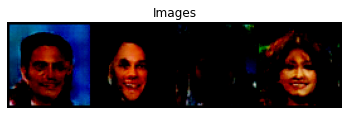

Epoch no - 151
Discriminator Loss : 14.069762 	 Generator_loss : 230.974854
Accuracy on Real Data : 0.674955 	 Accuracy on fake Data : 0.006326
Epoch no - 152
Discriminator Loss : 25.140095 	 Generator_loss : 238.972153
Accuracy on Real Data : 0.855835 	 Accuracy on fake Data : 0.054357
Epoch no - 153
Discriminator Loss : 7.442967 	 Generator_loss : 210.705215
Accuracy on Real Data : 0.976198 	 Accuracy on fake Data : 0.039493
Epoch no - 154
Discriminator Loss : 4.743320 	 Generator_loss : 206.400650
Accuracy on Real Data : 0.976598 	 Accuracy on fake Data : 0.043119
Epoch no - 155
Discriminator Loss : 4.337566 	 Generator_loss : 217.882675
Accuracy on Real Data : 0.986497 	 Accuracy on fake Data : 0.044578
Epoch no - 156
Discriminator Loss : 4.285008 	 Generator_loss : 212.900696
Accuracy on Real Data : 0.959241 	 Accuracy on fake Data : 0.022590
Epoch no - 157
Discriminator Loss : 4.668350 	 Generator_loss : 224.301071
Accuracy on Real Data : 0.994925 	 Accuracy on fake Data : 0.0337

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 160
Discriminator Loss : 14.176095 	 Generator_loss : 213.421906
Accuracy on Real Data : 0.995732 	 Accuracy on fake Data : 0.205802


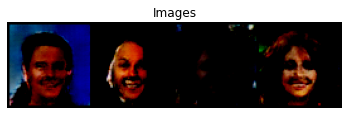

Epoch no - 161
Discriminator Loss : 7.597775 	 Generator_loss : 199.661484
Accuracy on Real Data : 0.790788 	 Accuracy on fake Data : 0.043169
Epoch no - 162
Discriminator Loss : 6.297871 	 Generator_loss : 214.984406
Accuracy on Real Data : 0.954755 	 Accuracy on fake Data : 0.029750
Epoch no - 163
Discriminator Loss : 6.093777 	 Generator_loss : 210.724899
Accuracy on Real Data : 0.888325 	 Accuracy on fake Data : 0.025940
Epoch no - 164
Discriminator Loss : 5.289294 	 Generator_loss : 222.733917
Accuracy on Real Data : 0.844963 	 Accuracy on fake Data : 0.008122
Epoch no - 165
Discriminator Loss : 48.722198 	 Generator_loss : 236.789413
Accuracy on Real Data : 0.849569 	 Accuracy on fake Data : 0.060862
Epoch no - 166
Discriminator Loss : 12.778668 	 Generator_loss : 215.224228
Accuracy on Real Data : 0.983613 	 Accuracy on fake Data : 0.122085
Epoch no - 167
Discriminator Loss : 7.355500 	 Generator_loss : 209.929489
Accuracy on Real Data : 0.689690 	 Accuracy on fake Data : 0.0655

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 170
Discriminator Loss : 5.279908 	 Generator_loss : 214.435791
Accuracy on Real Data : 0.682119 	 Accuracy on fake Data : 0.027550


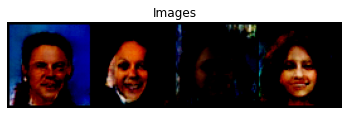

Epoch no - 171
Discriminator Loss : 28.052521 	 Generator_loss : 243.259033
Accuracy on Real Data : 0.861921 	 Accuracy on fake Data : 0.019890
Epoch no - 172
Discriminator Loss : 7.805106 	 Generator_loss : 232.597748
Accuracy on Real Data : 0.894143 	 Accuracy on fake Data : 0.024604
Epoch no - 173
Discriminator Loss : 4.292268 	 Generator_loss : 216.881302
Accuracy on Real Data : 0.940623 	 Accuracy on fake Data : 0.025514
Epoch no - 174
Discriminator Loss : 4.040244 	 Generator_loss : 216.337646
Accuracy on Real Data : 0.989258 	 Accuracy on fake Data : 0.020825
Epoch no - 175
Discriminator Loss : 3.316512 	 Generator_loss : 221.901413
Accuracy on Real Data : 0.956570 	 Accuracy on fake Data : 0.021360
Epoch no - 176
Discriminator Loss : 3.338239 	 Generator_loss : 233.240875
Accuracy on Real Data : 0.970728 	 Accuracy on fake Data : 0.020067
Epoch no - 177
Discriminator Loss : 7.109822 	 Generator_loss : 233.750595
Accuracy on Real Data : 0.994115 	 Accuracy on fake Data : 0.28868

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 180
Discriminator Loss : 6.899322 	 Generator_loss : 212.001938
Accuracy on Real Data : 0.962138 	 Accuracy on fake Data : 0.041256


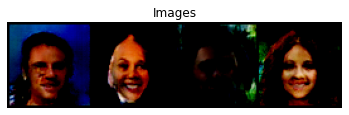

Epoch no - 181
Discriminator Loss : 5.290202 	 Generator_loss : 205.596619
Accuracy on Real Data : 0.774483 	 Accuracy on fake Data : 0.016589
Epoch no - 182
Discriminator Loss : 11.805350 	 Generator_loss : 241.866226
Accuracy on Real Data : 0.800592 	 Accuracy on fake Data : 0.087351
Epoch no - 183
Discriminator Loss : 6.565009 	 Generator_loss : 225.931870
Accuracy on Real Data : 0.961767 	 Accuracy on fake Data : 0.032634
Epoch no - 184
Discriminator Loss : 3.313451 	 Generator_loss : 223.963745
Accuracy on Real Data : 0.997478 	 Accuracy on fake Data : 0.063734
Epoch no - 185
Discriminator Loss : 3.076590 	 Generator_loss : 229.114792
Accuracy on Real Data : 0.930192 	 Accuracy on fake Data : 0.008337
Epoch no - 186
Discriminator Loss : 3.726972 	 Generator_loss : 232.900574
Accuracy on Real Data : 0.869304 	 Accuracy on fake Data : 0.066650
Epoch no - 187
Discriminator Loss : 5.324801 	 Generator_loss : 243.825409
Accuracy on Real Data : 0.761392 	 Accuracy on fake Data : 0.00722

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 190
Discriminator Loss : 11.476388 	 Generator_loss : 227.675537
Accuracy on Real Data : 0.926930 	 Accuracy on fake Data : 0.032010


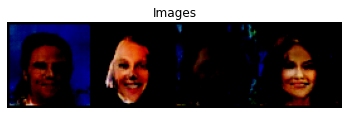

Epoch no - 191
Discriminator Loss : 4.658131 	 Generator_loss : 207.084503
Accuracy on Real Data : 0.988302 	 Accuracy on fake Data : 0.025084
Epoch no - 192
Discriminator Loss : 3.566977 	 Generator_loss : 214.790436
Accuracy on Real Data : 0.948537 	 Accuracy on fake Data : 0.024472
Epoch no - 193
Discriminator Loss : 3.475746 	 Generator_loss : 218.421539
Accuracy on Real Data : 0.875870 	 Accuracy on fake Data : 0.010105
Epoch no - 194
Discriminator Loss : 3.415667 	 Generator_loss : 225.711655
Accuracy on Real Data : 0.954114 	 Accuracy on fake Data : 0.005660
Epoch no - 195
Discriminator Loss : 2.634401 	 Generator_loss : 223.116837
Accuracy on Real Data : 0.993661 	 Accuracy on fake Data : 0.031689
Epoch no - 196
Discriminator Loss : 2.673439 	 Generator_loss : 229.612335
Accuracy on Real Data : 0.988324 	 Accuracy on fake Data : 0.012111
Epoch no - 197
Discriminator Loss : 46.330246 	 Generator_loss : 278.360931
Accuracy on Real Data : 0.479435 	 Accuracy on fake Data : 0.00360

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 200
Discriminator Loss : 4.567229 	 Generator_loss : 207.717590
Accuracy on Real Data : 0.903735 	 Accuracy on fake Data : 0.024492


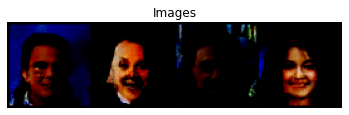

Epoch no - 201
Discriminator Loss : 4.210453 	 Generator_loss : 216.753723
Accuracy on Real Data : 0.971757 	 Accuracy on fake Data : 0.008011
Epoch no - 202
Discriminator Loss : 3.116607 	 Generator_loss : 222.146118
Accuracy on Real Data : 0.989011 	 Accuracy on fake Data : 0.006106
Epoch no - 203
Discriminator Loss : 3.844152 	 Generator_loss : 230.013748
Accuracy on Real Data : 0.972036 	 Accuracy on fake Data : 0.033605
Epoch no - 204
Discriminator Loss : 2.571808 	 Generator_loss : 238.583496
Accuracy on Real Data : 0.998349 	 Accuracy on fake Data : 0.044947
Epoch no - 205
Discriminator Loss : 3.234400 	 Generator_loss : 233.526566
Accuracy on Real Data : 0.638456 	 Accuracy on fake Data : 0.030767
Epoch no - 206
Discriminator Loss : 68.823448 	 Generator_loss : 231.212570
Accuracy on Real Data : 0.990508 	 Accuracy on fake Data : 0.129795
Epoch no - 207
Discriminator Loss : 11.434845 	 Generator_loss : 224.513657
Accuracy on Real Data : 0.911149 	 Accuracy on fake Data : 0.1436

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 210
Discriminator Loss : 4.512961 	 Generator_loss : 221.875580
Accuracy on Real Data : 0.950437 	 Accuracy on fake Data : 0.011350


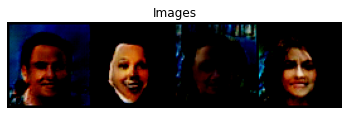

Epoch no - 211
Discriminator Loss : 4.231705 	 Generator_loss : 222.656906
Accuracy on Real Data : 0.647435 	 Accuracy on fake Data : 0.002086
Epoch no - 212
Discriminator Loss : 22.070694 	 Generator_loss : 246.436951
Accuracy on Real Data : 0.893259 	 Accuracy on fake Data : 0.019421
Epoch no - 213
Discriminator Loss : 4.749914 	 Generator_loss : 229.906754
Accuracy on Real Data : 0.892033 	 Accuracy on fake Data : 0.031598
Epoch no - 214
Discriminator Loss : 3.082861 	 Generator_loss : 234.518051
Accuracy on Real Data : 0.919855 	 Accuracy on fake Data : 0.030008
Epoch no - 215
Discriminator Loss : 2.509176 	 Generator_loss : 231.963181
Accuracy on Real Data : 0.992835 	 Accuracy on fake Data : 0.032927
Epoch no - 216
Discriminator Loss : 2.161586 	 Generator_loss : 238.053513
Accuracy on Real Data : 0.973811 	 Accuracy on fake Data : 0.050650
Epoch no - 217
Discriminator Loss : 2.329703 	 Generator_loss : 237.677124
Accuracy on Real Data : 0.754203 	 Accuracy on fake Data : 0.00437

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 220
Discriminator Loss : 3.925539 	 Generator_loss : 226.590683
Accuracy on Real Data : 0.824297 	 Accuracy on fake Data : 0.035823


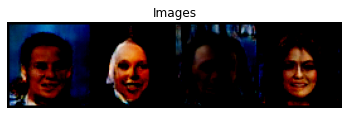

Epoch no - 221
Discriminator Loss : 3.891868 	 Generator_loss : 234.885071
Accuracy on Real Data : 0.970515 	 Accuracy on fake Data : 0.058770
Epoch no - 222
Discriminator Loss : 2.547337 	 Generator_loss : 231.059448
Accuracy on Real Data : 0.950290 	 Accuracy on fake Data : 0.021926
Epoch no - 223
Discriminator Loss : 1.969447 	 Generator_loss : 233.376877
Accuracy on Real Data : 0.977146 	 Accuracy on fake Data : 0.017158
Epoch no - 224
Discriminator Loss : 1.712968 	 Generator_loss : 240.786209
Accuracy on Real Data : 0.952674 	 Accuracy on fake Data : 0.013342
Epoch no - 225
Discriminator Loss : 1.766363 	 Generator_loss : 241.039917
Accuracy on Real Data : 0.982061 	 Accuracy on fake Data : 0.003802
Epoch no - 226
Discriminator Loss : 1.609082 	 Generator_loss : 247.372177
Accuracy on Real Data : 0.983746 	 Accuracy on fake Data : 0.012388
Epoch no - 227
Discriminator Loss : 1.499678 	 Generator_loss : 246.927124
Accuracy on Real Data : 0.971084 	 Accuracy on fake Data : 0.041594

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 230
Discriminator Loss : 3.299114 	 Generator_loss : 270.526642
Accuracy on Real Data : 0.968647 	 Accuracy on fake Data : 0.015135


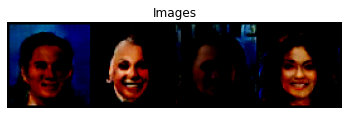

Epoch no - 231
Discriminator Loss : 1.318968 	 Generator_loss : 260.593597
Accuracy on Real Data : 0.989335 	 Accuracy on fake Data : 0.000710
Epoch no - 232
Discriminator Loss : 1.235826 	 Generator_loss : 266.618378
Accuracy on Real Data : 0.986135 	 Accuracy on fake Data : 0.010575
Epoch no - 233
Discriminator Loss : 1.732994 	 Generator_loss : 269.481506
Accuracy on Real Data : 0.928372 	 Accuracy on fake Data : 0.007003
Epoch no - 234
Discriminator Loss : 84.278969 	 Generator_loss : 254.122482
Accuracy on Real Data : 0.932520 	 Accuracy on fake Data : 0.304912
Epoch no - 235
Discriminator Loss : 19.075115 	 Generator_loss : 246.062881
Accuracy on Real Data : 0.792874 	 Accuracy on fake Data : 0.004558
Epoch no - 236
Discriminator Loss : 9.064532 	 Generator_loss : 228.030426
Accuracy on Real Data : 0.853654 	 Accuracy on fake Data : 0.029176
Epoch no - 237
Discriminator Loss : 5.754010 	 Generator_loss : 225.154694
Accuracy on Real Data : 0.930379 	 Accuracy on fake Data : 0.0286

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 240
Discriminator Loss : 30.206242 	 Generator_loss : 256.780823
Accuracy on Real Data : 0.918540 	 Accuracy on fake Data : 0.077624


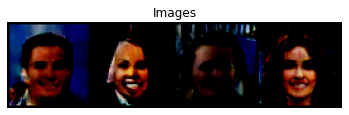

Epoch no - 241
Discriminator Loss : 6.208075 	 Generator_loss : 235.638504
Accuracy on Real Data : 0.937628 	 Accuracy on fake Data : 0.021026
Epoch no - 242
Discriminator Loss : 3.169231 	 Generator_loss : 227.928299
Accuracy on Real Data : 0.986405 	 Accuracy on fake Data : 0.018939
Epoch no - 243
Discriminator Loss : 2.416714 	 Generator_loss : 235.547302
Accuracy on Real Data : 0.987675 	 Accuracy on fake Data : 0.020546
Epoch no - 244
Discriminator Loss : 1.981562 	 Generator_loss : 240.910614
Accuracy on Real Data : 0.973292 	 Accuracy on fake Data : 0.083057
Epoch no - 245
Discriminator Loss : 2.688020 	 Generator_loss : 241.401917
Accuracy on Real Data : 0.955167 	 Accuracy on fake Data : 0.009480
Epoch no - 246
Discriminator Loss : 1.808865 	 Generator_loss : 248.014572
Accuracy on Real Data : 0.895847 	 Accuracy on fake Data : 0.018108
Epoch no - 247
Discriminator Loss : 2.360675 	 Generator_loss : 257.731445
Accuracy on Real Data : 0.931810 	 Accuracy on fake Data : 0.007584

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 250
Discriminator Loss : 1.155920 	 Generator_loss : 253.254211
Accuracy on Real Data : 0.976332 	 Accuracy on fake Data : 0.010845


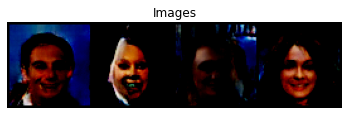

Epoch no - 251
Discriminator Loss : 1.202302 	 Generator_loss : 255.640762
Accuracy on Real Data : 0.972882 	 Accuracy on fake Data : 0.022851
Epoch no - 252
Discriminator Loss : 1.257638 	 Generator_loss : 255.005890
Accuracy on Real Data : 0.963940 	 Accuracy on fake Data : 0.007016
Epoch no - 253
Discriminator Loss : 1.765445 	 Generator_loss : 267.748047
Accuracy on Real Data : 0.995654 	 Accuracy on fake Data : 0.014213
Epoch no - 254
Discriminator Loss : 1.057345 	 Generator_loss : 266.848755
Accuracy on Real Data : 0.991368 	 Accuracy on fake Data : 0.003668
Epoch no - 255
Discriminator Loss : 1.125208 	 Generator_loss : 267.789398
Accuracy on Real Data : 0.874840 	 Accuracy on fake Data : 0.003393
Epoch no - 256
Discriminator Loss : 80.875259 	 Generator_loss : 254.932434
Accuracy on Real Data : 0.904473 	 Accuracy on fake Data : 0.143572
Epoch no - 257
Discriminator Loss : 17.533314 	 Generator_loss : 254.817963
Accuracy on Real Data : 0.943496 	 Accuracy on fake Data : 0.0197

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 260
Discriminator Loss : 4.153986 	 Generator_loss : 233.029037
Accuracy on Real Data : 0.858063 	 Accuracy on fake Data : 0.022953


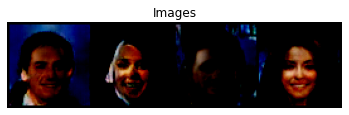

Epoch no - 261
Discriminator Loss : 4.111564 	 Generator_loss : 248.634979
Accuracy on Real Data : 0.986003 	 Accuracy on fake Data : 0.020068
Epoch no - 262
Discriminator Loss : 2.064087 	 Generator_loss : 237.875381
Accuracy on Real Data : 0.884157 	 Accuracy on fake Data : 0.034605
Epoch no - 263
Discriminator Loss : 2.658000 	 Generator_loss : 250.916382
Accuracy on Real Data : 0.973035 	 Accuracy on fake Data : 0.002659
Epoch no - 264
Discriminator Loss : 1.522819 	 Generator_loss : 247.567215
Accuracy on Real Data : 0.990703 	 Accuracy on fake Data : 0.003733
Epoch no - 265
Discriminator Loss : 1.733544 	 Generator_loss : 251.812943
Accuracy on Real Data : 0.982760 	 Accuracy on fake Data : 0.009221
Epoch no - 266
Discriminator Loss : 1.422657 	 Generator_loss : 248.101364
Accuracy on Real Data : 0.972981 	 Accuracy on fake Data : 0.006327
Epoch no - 267
Discriminator Loss : 1.327248 	 Generator_loss : 256.074005
Accuracy on Real Data : 0.985447 	 Accuracy on fake Data : 0.006979

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 270
Discriminator Loss : 1.590500 	 Generator_loss : 262.845581
Accuracy on Real Data : 0.996078 	 Accuracy on fake Data : 0.007521


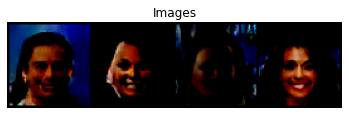

Epoch no - 271
Discriminator Loss : 1.035748 	 Generator_loss : 264.376343
Accuracy on Real Data : 0.904346 	 Accuracy on fake Data : 0.008766
Epoch no - 272
Discriminator Loss : 80.269470 	 Generator_loss : 208.389359
Accuracy on Real Data : 0.864959 	 Accuracy on fake Data : 0.019646
Epoch no - 273
Discriminator Loss : 19.819357 	 Generator_loss : 253.141739
Accuracy on Real Data : 0.769074 	 Accuracy on fake Data : 0.033324
Epoch no - 274
Discriminator Loss : 9.120909 	 Generator_loss : 260.672943
Accuracy on Real Data : 0.841239 	 Accuracy on fake Data : 0.016515
Epoch no - 275
Discriminator Loss : 4.380049 	 Generator_loss : 238.502106
Accuracy on Real Data : 0.829884 	 Accuracy on fake Data : 0.006859
Epoch no - 276
Discriminator Loss : 3.810045 	 Generator_loss : 247.856476
Accuracy on Real Data : 0.968570 	 Accuracy on fake Data : 0.026362
Epoch no - 277
Discriminator Loss : 2.217206 	 Generator_loss : 231.405792
Accuracy on Real Data : 0.964801 	 Accuracy on fake Data : 0.0130

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 280
Discriminator Loss : 1.742863 	 Generator_loss : 245.026459
Accuracy on Real Data : 0.957484 	 Accuracy on fake Data : 0.015281


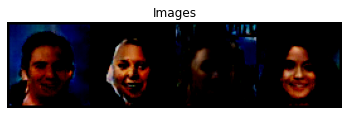

Epoch no - 281
Discriminator Loss : 1.561199 	 Generator_loss : 247.476379
Accuracy on Real Data : 0.956903 	 Accuracy on fake Data : 0.047757
Epoch no - 282
Discriminator Loss : 1.393277 	 Generator_loss : 255.242752
Accuracy on Real Data : 0.994220 	 Accuracy on fake Data : 0.007937
Epoch no - 283
Discriminator Loss : 1.222238 	 Generator_loss : 254.242416
Accuracy on Real Data : 0.976099 	 Accuracy on fake Data : 0.014824
Epoch no - 284
Discriminator Loss : 1.121398 	 Generator_loss : 258.850891
Accuracy on Real Data : 0.994684 	 Accuracy on fake Data : 0.004830
Epoch no - 285
Discriminator Loss : 1.017913 	 Generator_loss : 260.521667
Accuracy on Real Data : 0.991067 	 Accuracy on fake Data : 0.011153
Epoch no - 286
Discriminator Loss : 0.944470 	 Generator_loss : 260.009369
Accuracy on Real Data : 0.984527 	 Accuracy on fake Data : 0.009933
Epoch no - 287
Discriminator Loss : 0.975871 	 Generator_loss : 265.812500
Accuracy on Real Data : 0.987630 	 Accuracy on fake Data : 0.004480

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 290
Discriminator Loss : 0.929644 	 Generator_loss : 280.604675
Accuracy on Real Data : 0.968799 	 Accuracy on fake Data : 0.003058


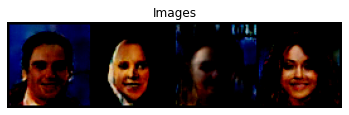

Epoch no - 291
Discriminator Loss : 0.816397 	 Generator_loss : 272.190857
Accuracy on Real Data : 0.917227 	 Accuracy on fake Data : 0.001772
Epoch no - 293
Discriminator Loss : 15.852082 	 Generator_loss : 264.341034
Accuracy on Real Data : 0.770967 	 Accuracy on fake Data : 0.167800
Epoch no - 294
Discriminator Loss : 11.140990 	 Generator_loss : 273.098053
Accuracy on Real Data : 0.981472 	 Accuracy on fake Data : 0.036173
Epoch no - 295
Discriminator Loss : 3.673805 	 Generator_loss : 242.608978
Accuracy on Real Data : 0.977910 	 Accuracy on fake Data : 0.038296
Epoch no - 296
Discriminator Loss : 2.805440 	 Generator_loss : 241.516541
Accuracy on Real Data : 0.994139 	 Accuracy on fake Data : 0.020866
Epoch no - 297
Discriminator Loss : 2.268650 	 Generator_loss : 239.345535
Accuracy on Real Data : 0.916487 	 Accuracy on fake Data : 0.008865
Epoch no - 298
Discriminator Loss : 2.068307 	 Generator_loss : 249.851303
Accuracy on Real Data : 0.985194 	 Accuracy on fake Data : 0.0021

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 300
Discriminator Loss : 2.430283 	 Generator_loss : 254.620453
Accuracy on Real Data : 0.961865 	 Accuracy on fake Data : 0.007271


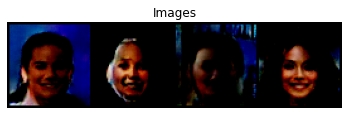

Epoch no - 301
Discriminator Loss : 1.503012 	 Generator_loss : 258.382050
Accuracy on Real Data : 0.982858 	 Accuracy on fake Data : 0.011297
Epoch no - 302
Discriminator Loss : 1.399691 	 Generator_loss : 254.565399
Accuracy on Real Data : 0.807138 	 Accuracy on fake Data : 0.002257
Epoch no - 303
Discriminator Loss : 43.132648 	 Generator_loss : 247.343216
Accuracy on Real Data : 0.877537 	 Accuracy on fake Data : 0.021174
Epoch no - 304
Discriminator Loss : 5.491671 	 Generator_loss : 256.673584
Accuracy on Real Data : 0.881218 	 Accuracy on fake Data : 0.018146
Epoch no - 305
Discriminator Loss : 3.064004 	 Generator_loss : 262.919861
Accuracy on Real Data : 0.981568 	 Accuracy on fake Data : 0.005756
Epoch no - 306
Discriminator Loss : 1.649552 	 Generator_loss : 251.167358
Accuracy on Real Data : 0.996439 	 Accuracy on fake Data : 0.010802
Epoch no - 307
Discriminator Loss : 1.338636 	 Generator_loss : 255.620926
Accuracy on Real Data : 0.970804 	 Accuracy on fake Data : 0.01052

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 310
Discriminator Loss : 1.153136 	 Generator_loss : 263.164368
Accuracy on Real Data : 0.954882 	 Accuracy on fake Data : 0.004916


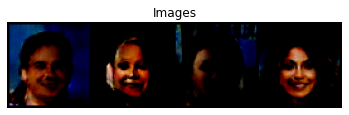

Epoch no - 311
Discriminator Loss : 0.944837 	 Generator_loss : 263.540070
Accuracy on Real Data : 0.972390 	 Accuracy on fake Data : 0.005003
Epoch no - 312
Discriminator Loss : 0.806264 	 Generator_loss : 272.763458
Accuracy on Real Data : 0.998232 	 Accuracy on fake Data : 0.008569
Epoch no - 313
Discriminator Loss : 0.733832 	 Generator_loss : 279.646698
Accuracy on Real Data : 0.973602 	 Accuracy on fake Data : 0.007583
Epoch no - 314
Discriminator Loss : 0.720005 	 Generator_loss : 277.540009
Accuracy on Real Data : 0.997836 	 Accuracy on fake Data : 0.020028
Epoch no - 315
Discriminator Loss : 0.668179 	 Generator_loss : 284.998688
Accuracy on Real Data : 0.998736 	 Accuracy on fake Data : 0.003265
Epoch no - 316
Discriminator Loss : 0.648262 	 Generator_loss : 281.036743
Accuracy on Real Data : 0.996787 	 Accuracy on fake Data : 0.004235
Epoch no - 317
Discriminator Loss : 0.620548 	 Generator_loss : 282.491028
Accuracy on Real Data : 0.987839 	 Accuracy on fake Data : 0.008887

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 320
Discriminator Loss : 0.548937 	 Generator_loss : 290.507721
Accuracy on Real Data : 0.973175 	 Accuracy on fake Data : 0.014163


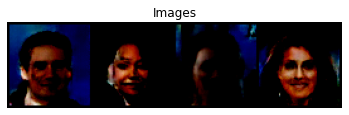

Epoch no - 321
Discriminator Loss : 0.686390 	 Generator_loss : 299.455902
Accuracy on Real Data : 0.990988 	 Accuracy on fake Data : 0.002105
Epoch no - 322
Discriminator Loss : 0.471347 	 Generator_loss : 300.452118
Accuracy on Real Data : 0.991628 	 Accuracy on fake Data : 0.004354
Epoch no - 323
Discriminator Loss : 0.702360 	 Generator_loss : 299.113831
Accuracy on Real Data : 0.976137 	 Accuracy on fake Data : 0.008694
Epoch no - 324
Discriminator Loss : 0.813800 	 Generator_loss : 311.786652
Accuracy on Real Data : 0.996053 	 Accuracy on fake Data : 0.004702
Epoch no - 325
Discriminator Loss : 0.418729 	 Generator_loss : 307.949280
Accuracy on Real Data : 0.999271 	 Accuracy on fake Data : 0.001637
Epoch no - 326
Discriminator Loss : 0.419742 	 Generator_loss : 306.141449
Accuracy on Real Data : 0.994024 	 Accuracy on fake Data : 0.001833
Epoch no - 327
Discriminator Loss : 0.465141 	 Generator_loss : 312.263611
Accuracy on Real Data : 0.972552 	 Accuracy on fake Data : 0.006309

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 330
Discriminator Loss : 0.523360 	 Generator_loss : 309.502197
Accuracy on Real Data : 0.989032 	 Accuracy on fake Data : 0.006146


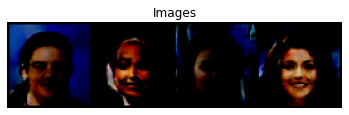

Epoch no - 331
Discriminator Loss : 0.359910 	 Generator_loss : 316.203430
Accuracy on Real Data : 0.996057 	 Accuracy on fake Data : 0.001334
Epoch no - 332
Discriminator Loss : 0.425593 	 Generator_loss : 311.764893
Accuracy on Real Data : 0.952275 	 Accuracy on fake Data : 0.000861
Epoch no - 333
Discriminator Loss : 159.691360 	 Generator_loss : 136.742722
Accuracy on Real Data : 0.209599 	 Accuracy on fake Data : 0.038785
Epoch no - 334
Discriminator Loss : 49.990097 	 Generator_loss : 198.181778
Accuracy on Real Data : 0.989432 	 Accuracy on fake Data : 0.333106
Epoch no - 335
Discriminator Loss : 30.453339 	 Generator_loss : 258.696960
Accuracy on Real Data : 0.545537 	 Accuracy on fake Data : 0.148784
Epoch no - 336
Discriminator Loss : 25.726852 	 Generator_loss : 275.952209
Accuracy on Real Data : 0.776052 	 Accuracy on fake Data : 0.030707
Epoch no - 337
Discriminator Loss : 11.602771 	 Generator_loss : 250.443390
Accuracy on Real Data : 0.894992 	 Accuracy on fake Data : 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 340
Discriminator Loss : 3.549187 	 Generator_loss : 239.339432
Accuracy on Real Data : 0.957395 	 Accuracy on fake Data : 0.100755


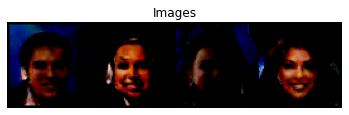

Epoch no - 341
Discriminator Loss : 2.962789 	 Generator_loss : 242.408081
Accuracy on Real Data : 0.968109 	 Accuracy on fake Data : 0.011636
Epoch no - 342
Discriminator Loss : 2.359374 	 Generator_loss : 236.617432
Accuracy on Real Data : 0.931310 	 Accuracy on fake Data : 0.022512
Epoch no - 343
Discriminator Loss : 2.291252 	 Generator_loss : 244.448257
Accuracy on Real Data : 0.899351 	 Accuracy on fake Data : 0.002526
Epoch no - 344
Discriminator Loss : 2.865070 	 Generator_loss : 259.254822
Accuracy on Real Data : 0.987260 	 Accuracy on fake Data : 0.001901
Epoch no - 345
Discriminator Loss : 1.436721 	 Generator_loss : 251.336548
Accuracy on Real Data : 0.979825 	 Accuracy on fake Data : 0.012842
Epoch no - 346
Discriminator Loss : 1.350723 	 Generator_loss : 257.094818
Accuracy on Real Data : 0.959697 	 Accuracy on fake Data : 0.013102
Epoch no - 347
Discriminator Loss : 1.273935 	 Generator_loss : 254.971619
Accuracy on Real Data : 0.976833 	 Accuracy on fake Data : 0.008126

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch no - 350
Discriminator Loss : 1.192095 	 Generator_loss : 259.523224
Accuracy on Real Data : 0.956978 	 Accuracy on fake Data : 0.012406


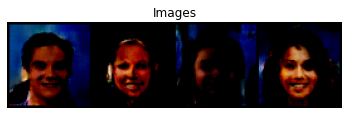

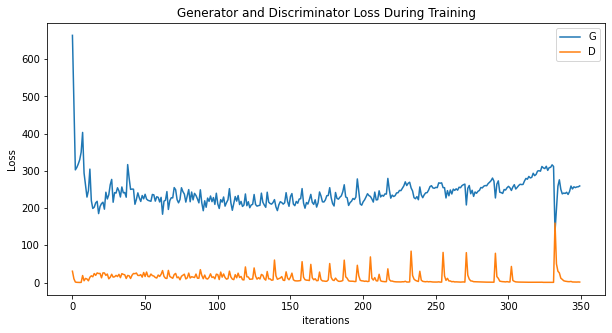

In [0]:
fit()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


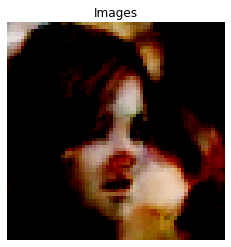

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


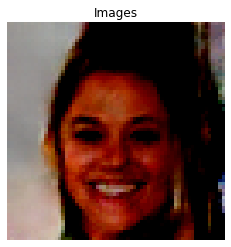

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


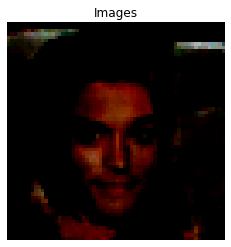

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


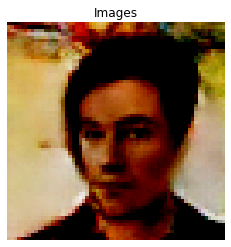

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


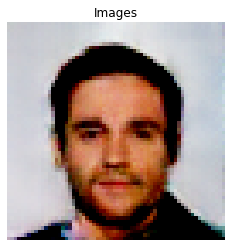

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


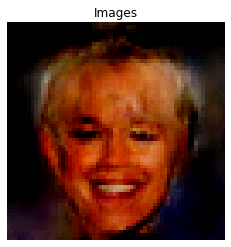

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


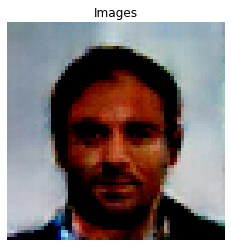

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


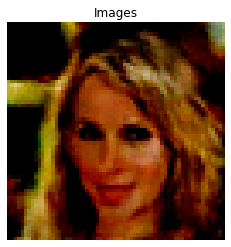

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


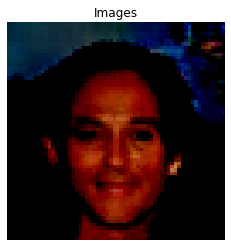

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


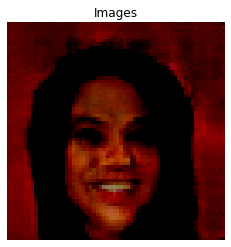

In [0]:
with torch.no_grad():
  for i in range(10) :
    generated_data = generator(noise(1).detach())
    imshow(torchvision.utils.make_grid(vectors_to_images(generated_data)))
  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


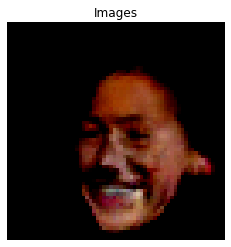

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


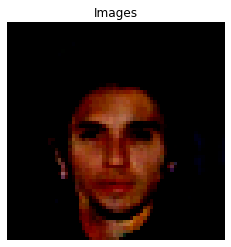

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


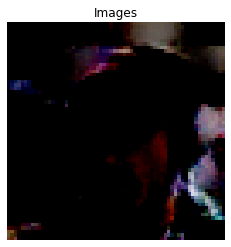

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


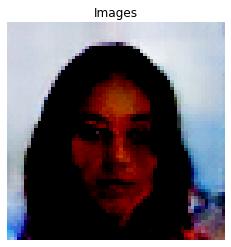

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


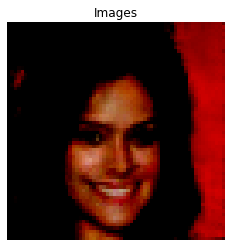

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


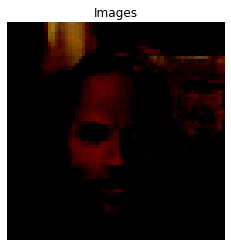

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


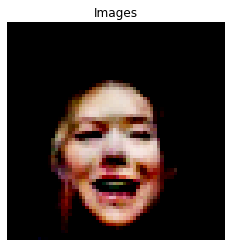

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


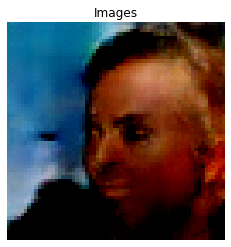

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


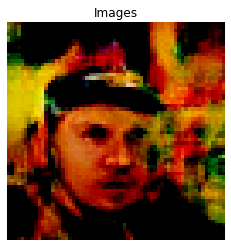

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


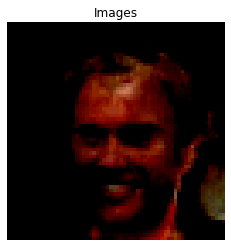

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


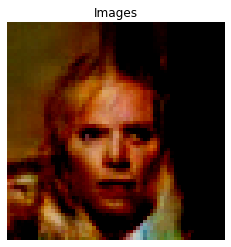

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


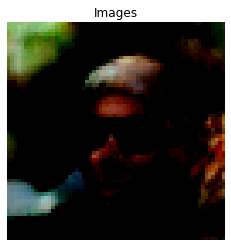

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


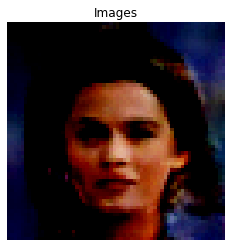

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


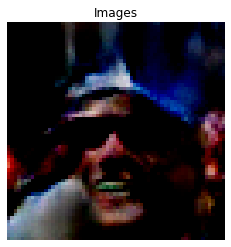

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


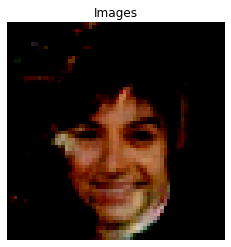

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


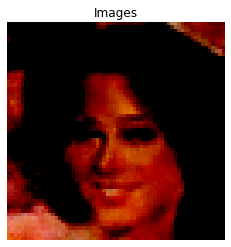

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


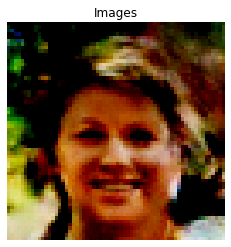

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


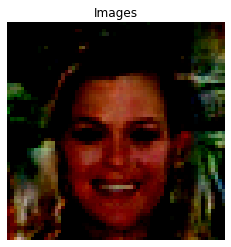

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


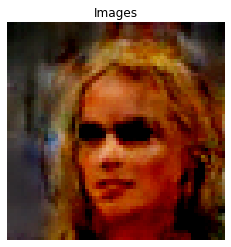

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


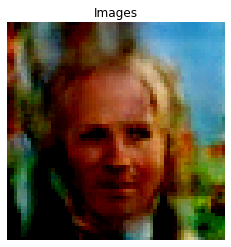

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


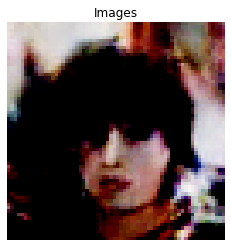

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


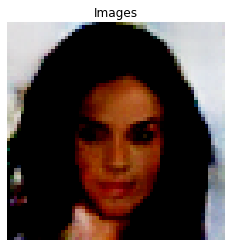

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


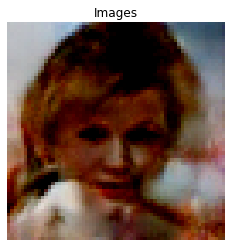

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


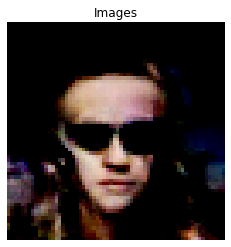

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


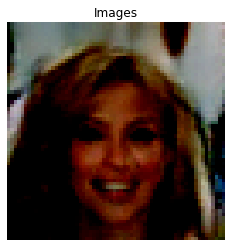

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


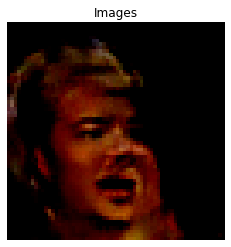

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


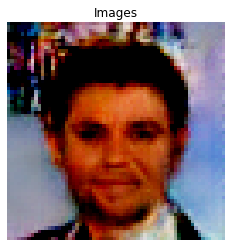

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


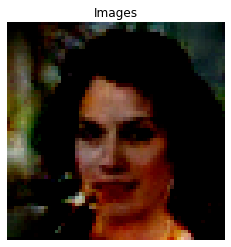

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


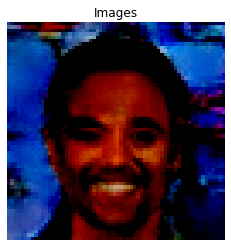

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


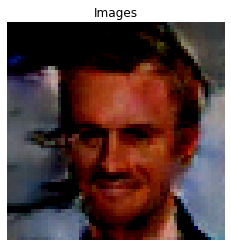

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


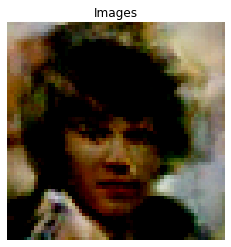

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


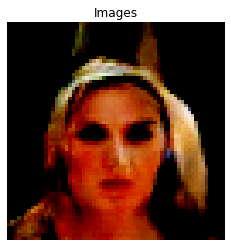

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


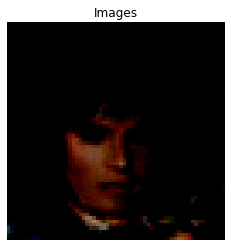

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


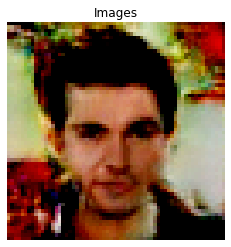

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


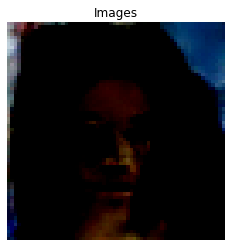

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


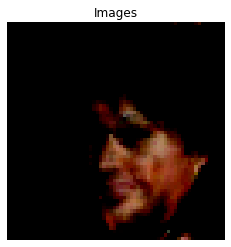

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


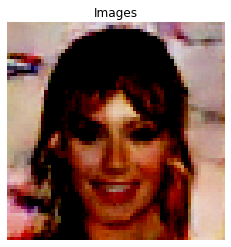

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


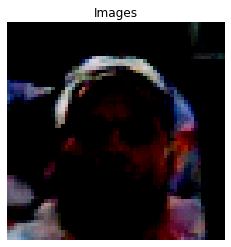

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


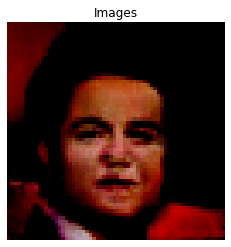

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


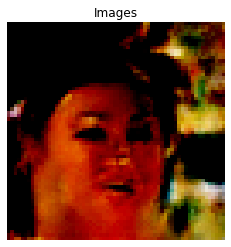

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


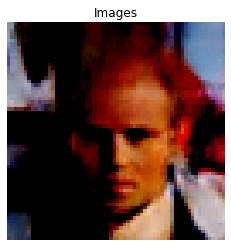

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


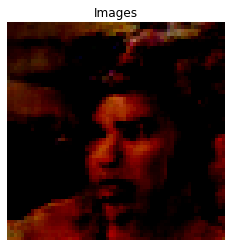

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


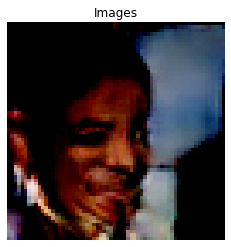

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


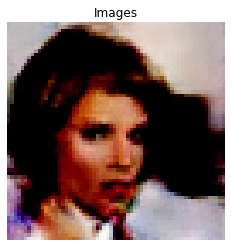

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


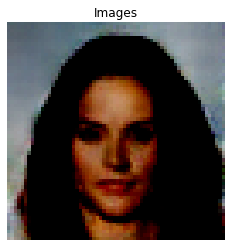

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


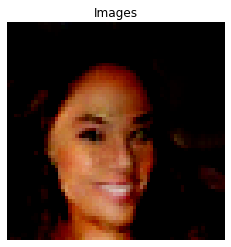

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


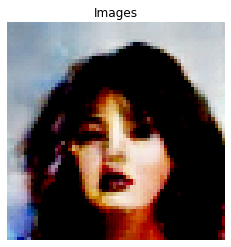

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


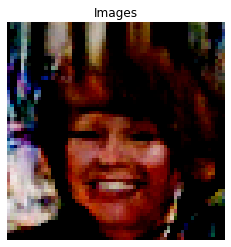

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


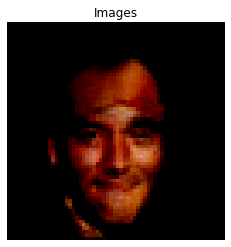

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


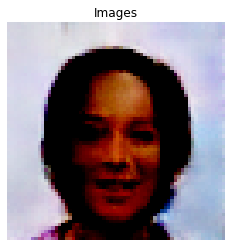

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


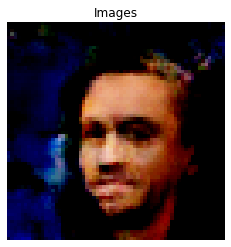

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


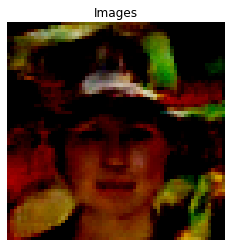

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


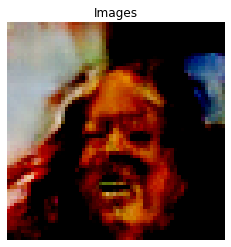

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


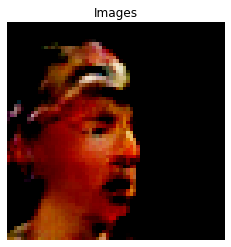

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


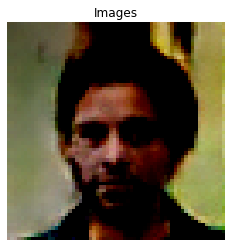

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


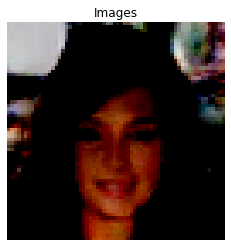

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


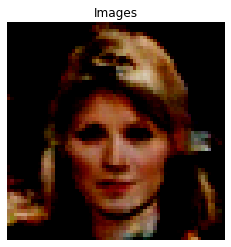

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


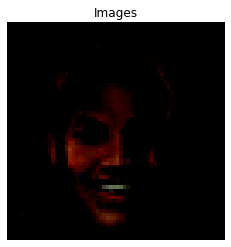

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


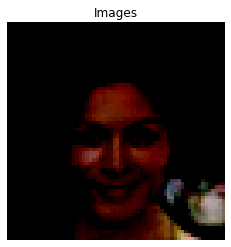

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


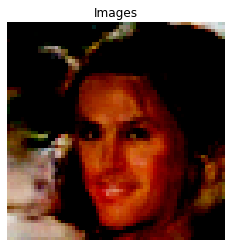

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


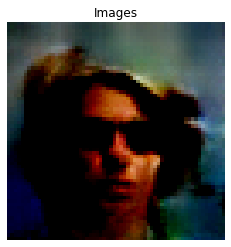

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


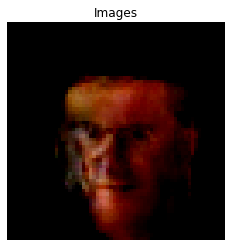

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


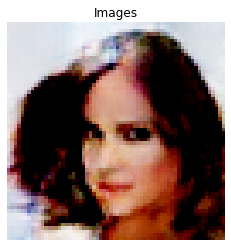

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


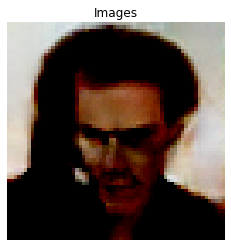

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


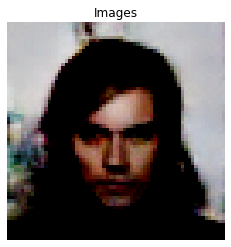

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


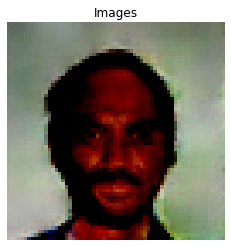

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


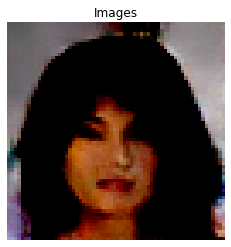

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


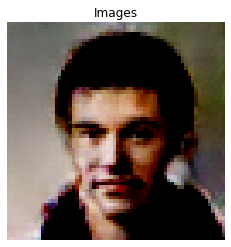

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


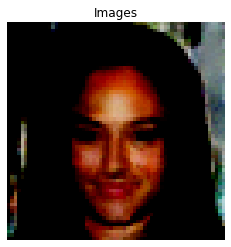

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


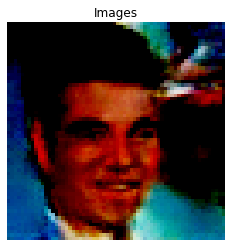

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


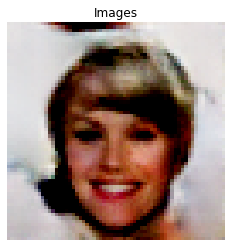

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


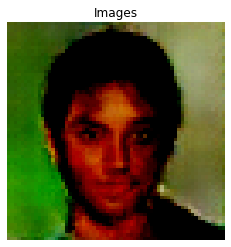

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


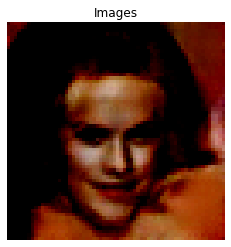

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


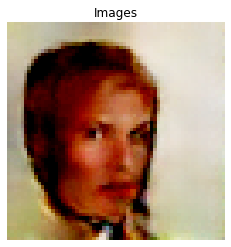

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


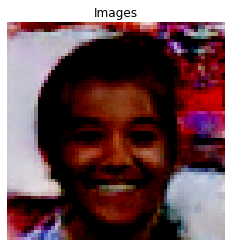

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


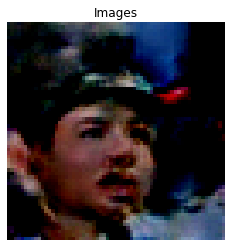

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


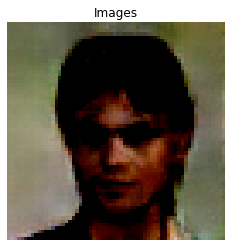

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


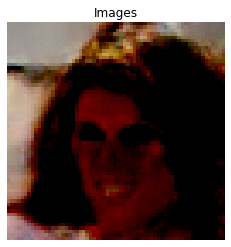

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


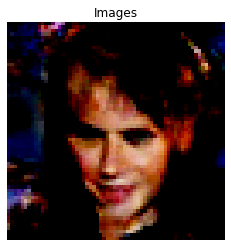

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


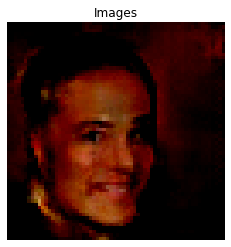

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


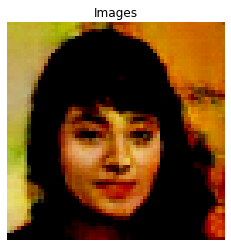

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


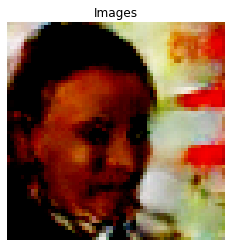

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


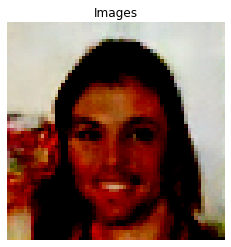

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


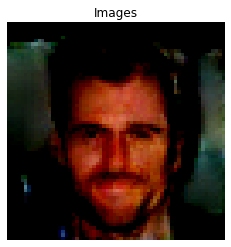

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


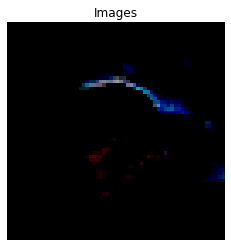

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


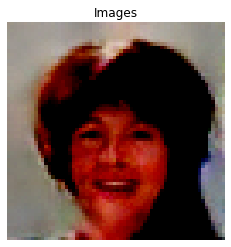

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


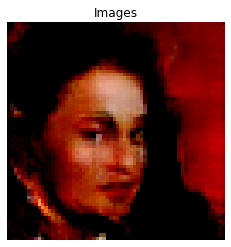

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


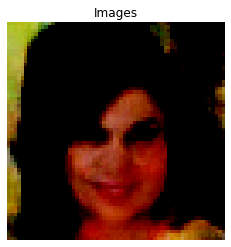

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


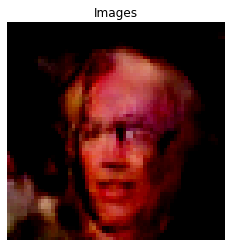

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


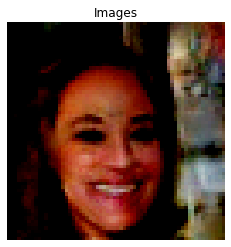

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


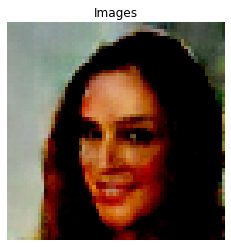

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


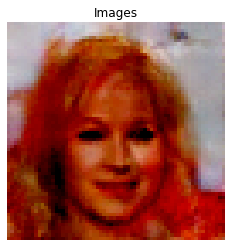

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


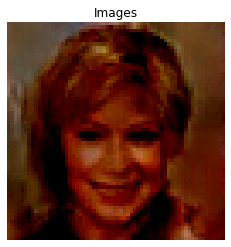

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


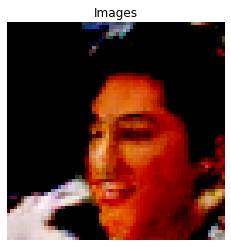

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


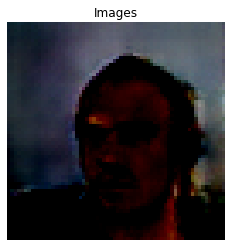

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


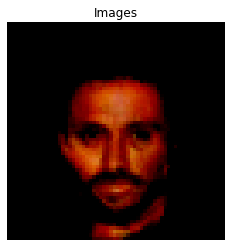

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


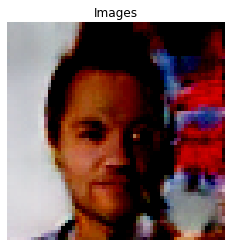

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


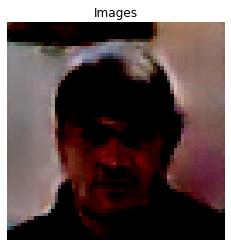

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


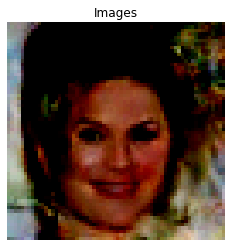

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


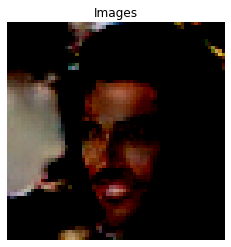

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


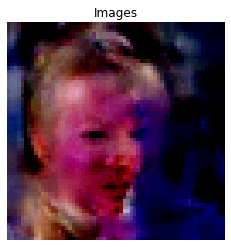

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


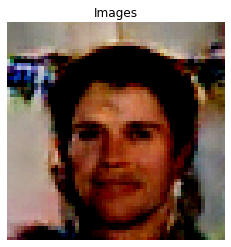

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


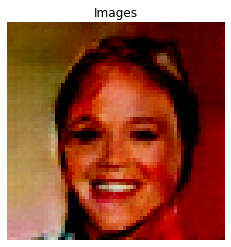

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


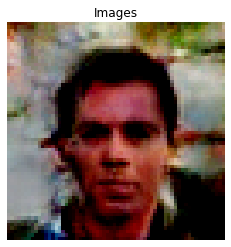

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


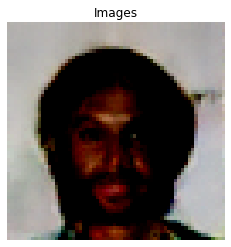

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


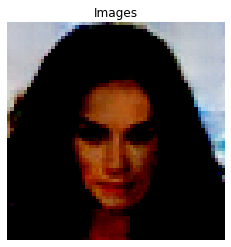

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


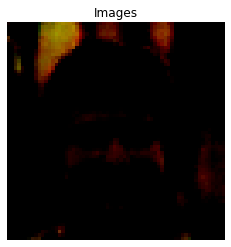

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


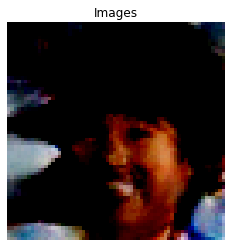

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


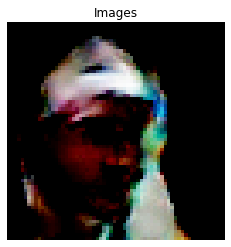

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


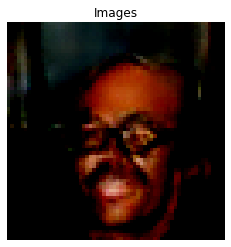

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


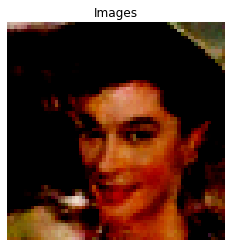

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


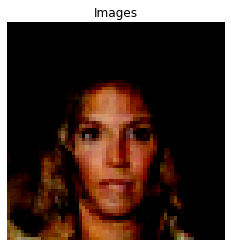

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


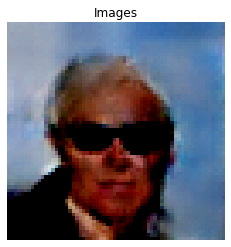

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


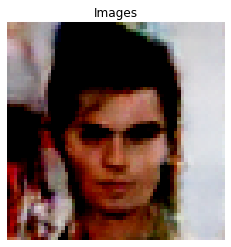

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


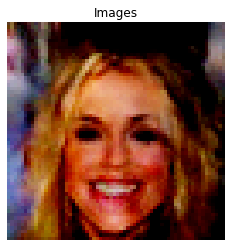

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


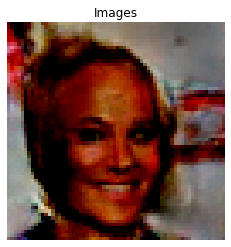

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


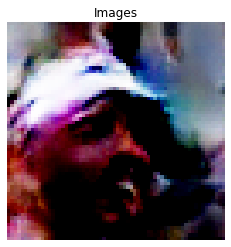

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


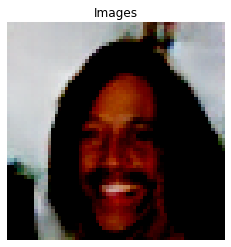

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


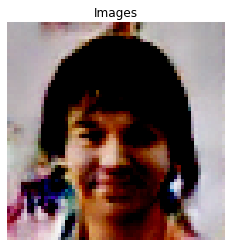

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


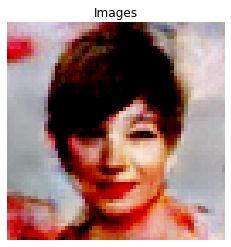

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


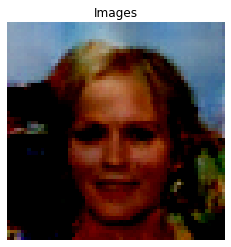

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


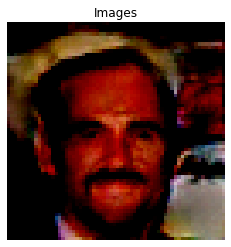

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


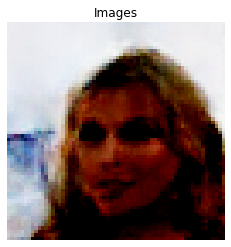

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


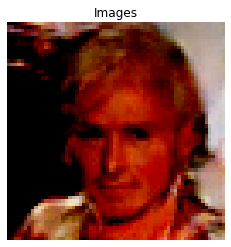

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


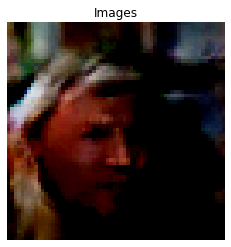

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


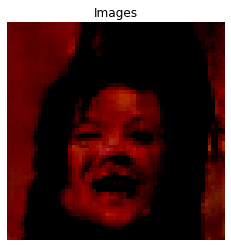

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


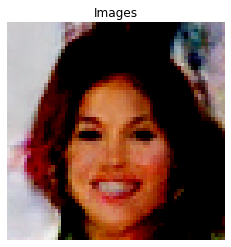

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


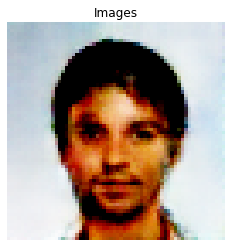

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


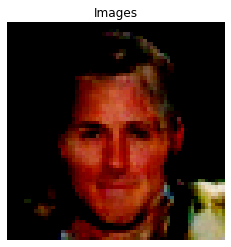

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


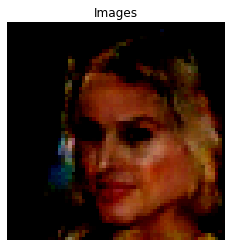

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


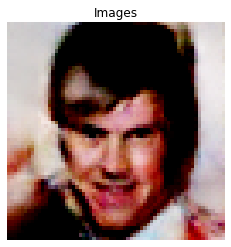

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


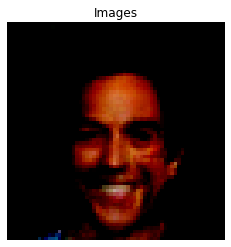

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


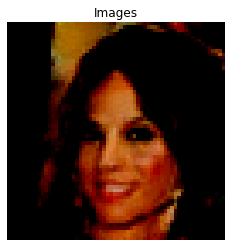

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


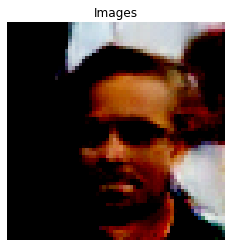

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


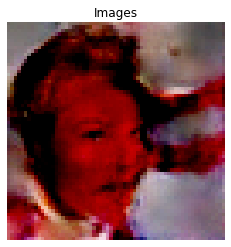

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


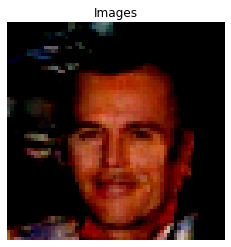

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


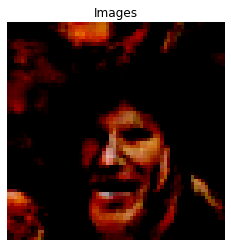

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


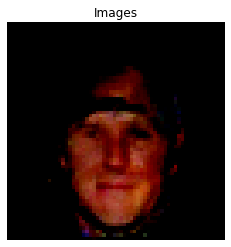

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


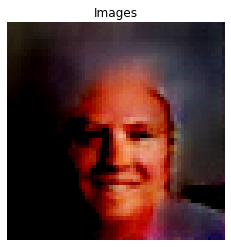

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


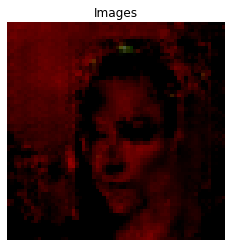

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


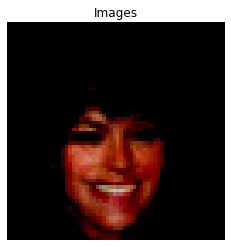

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


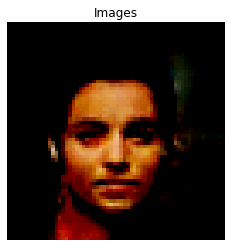

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


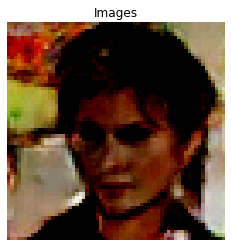

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


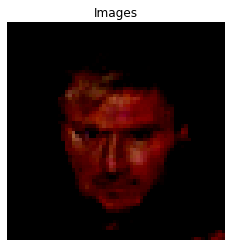

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


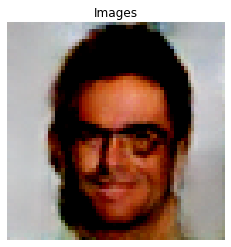

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


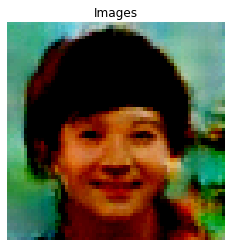

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


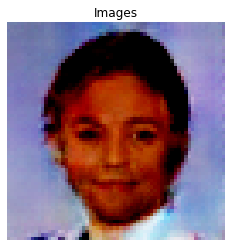

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


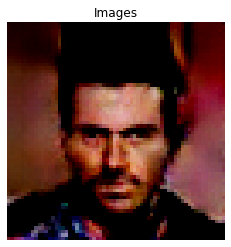

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


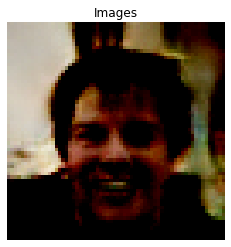

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


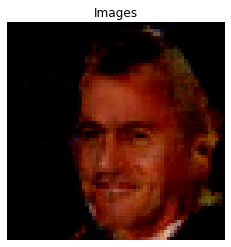

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


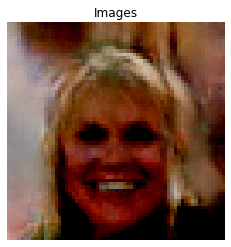

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


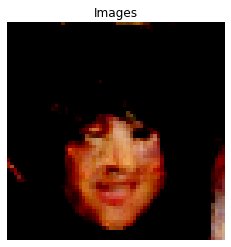

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


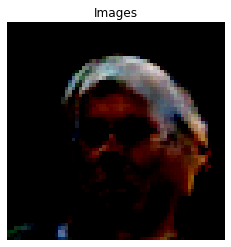

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


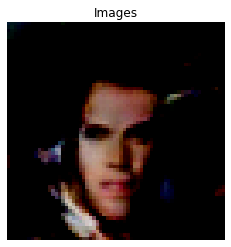

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


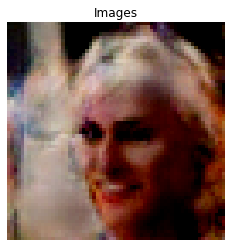

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


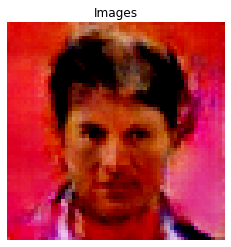

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


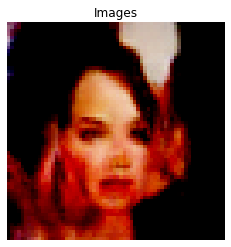

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


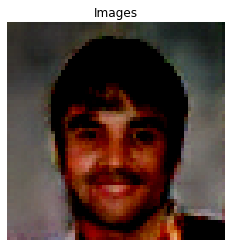

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


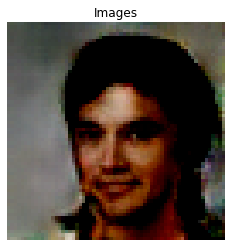

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


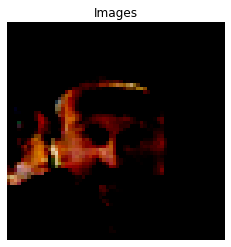

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


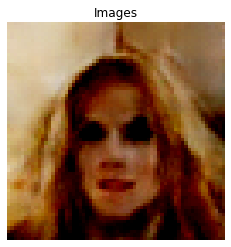

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


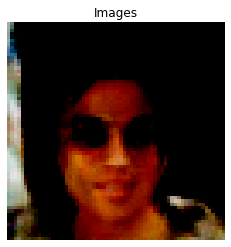

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


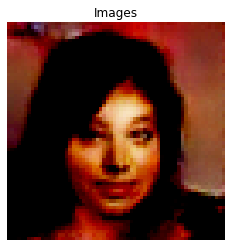

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


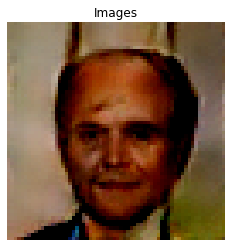

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


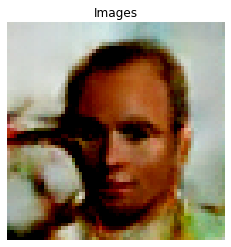

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


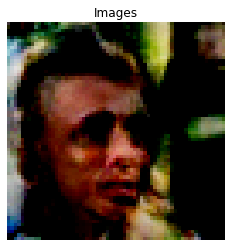

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


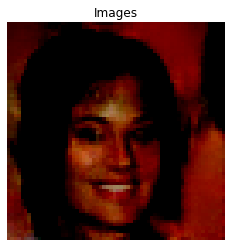

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


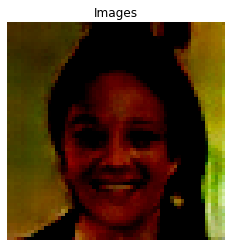

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


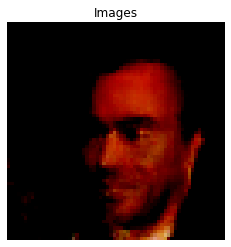

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


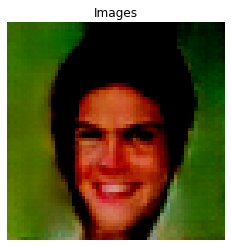

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


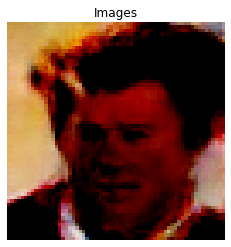

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


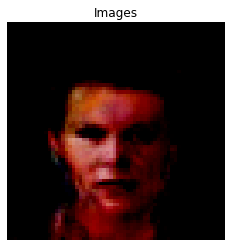

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


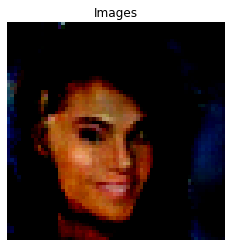

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


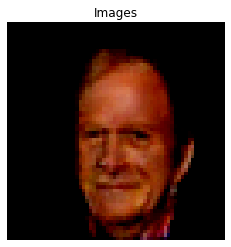

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


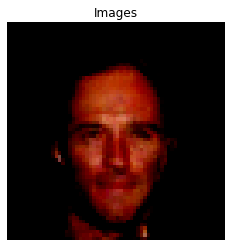

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


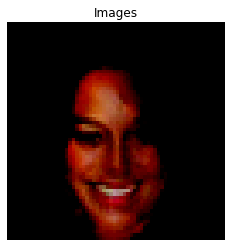

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


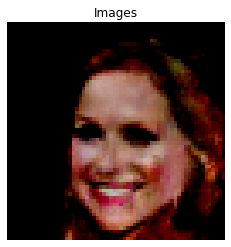

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


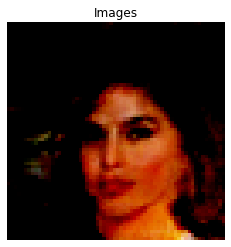

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


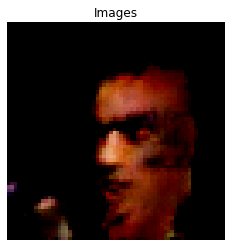

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


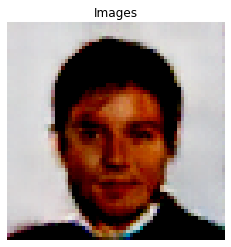

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


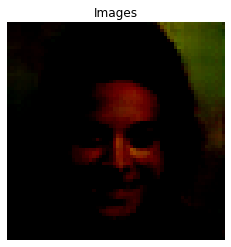

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


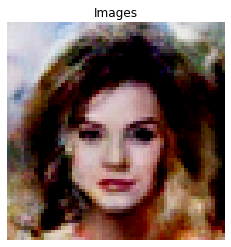

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


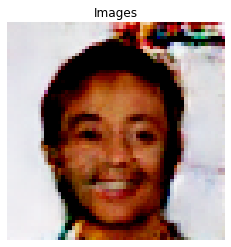

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


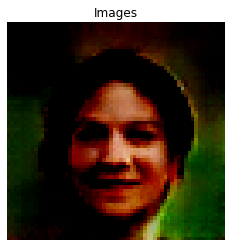

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


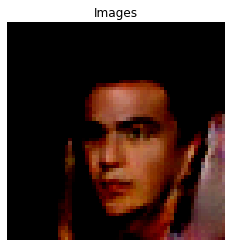

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


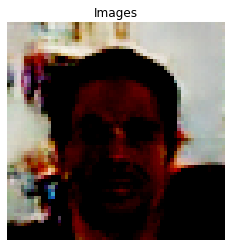

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


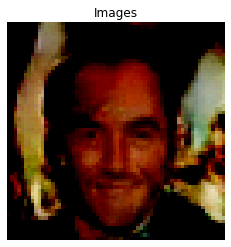

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


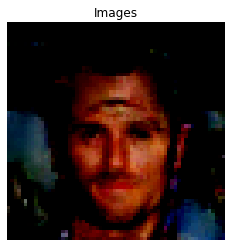

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


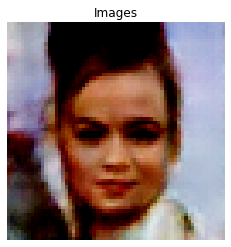

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


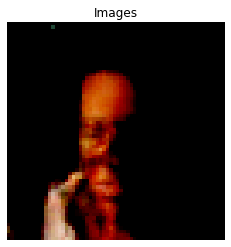

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


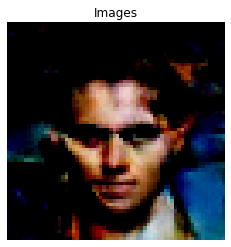

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


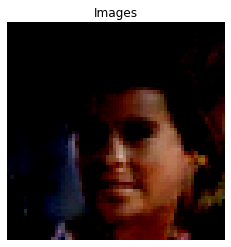

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


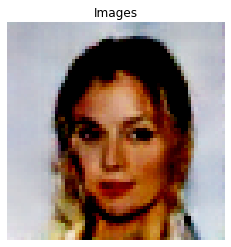

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


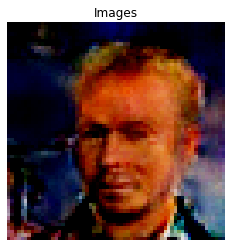

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


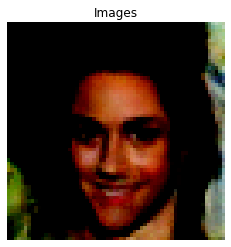

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


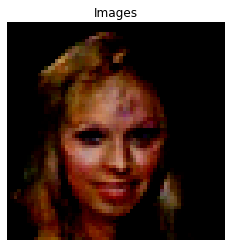

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


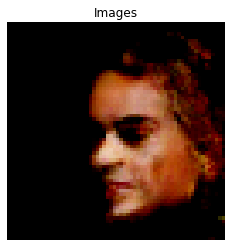

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


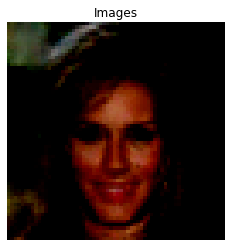

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


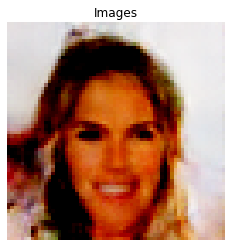

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


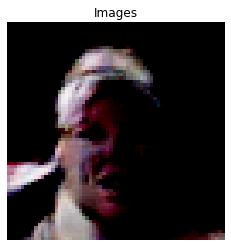

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


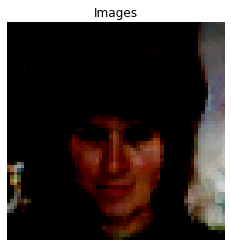

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


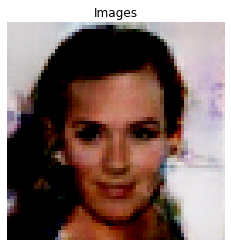

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


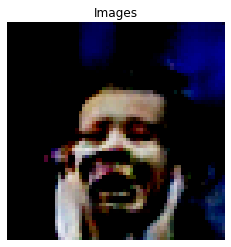

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


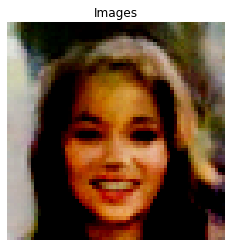

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


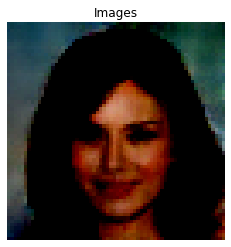

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


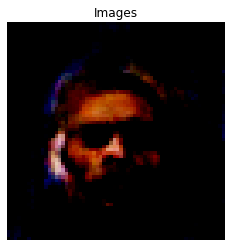

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


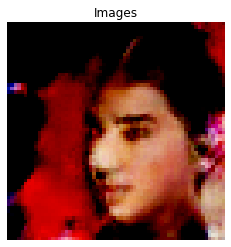

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


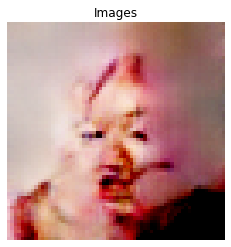

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


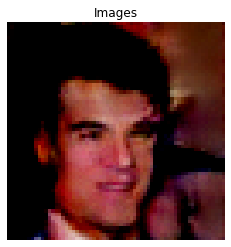

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


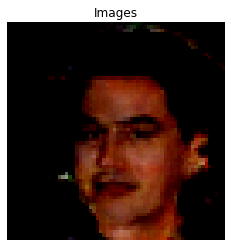

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


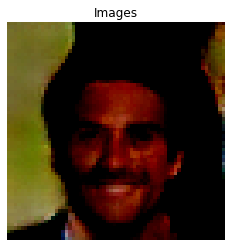

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


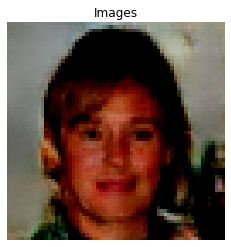

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


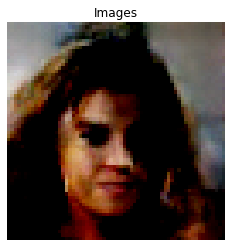

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


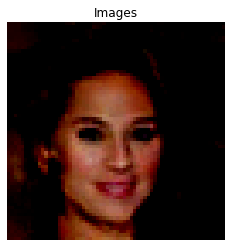

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


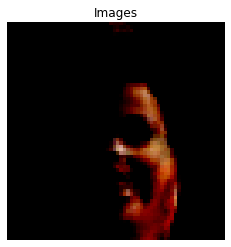

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


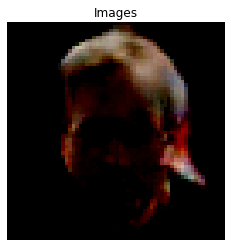

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


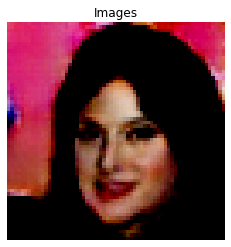

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


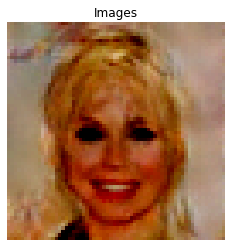

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


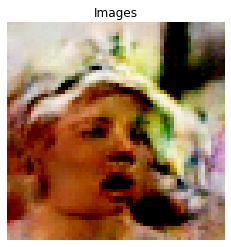

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


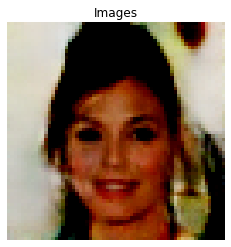

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


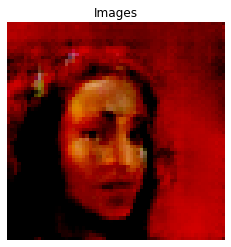

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


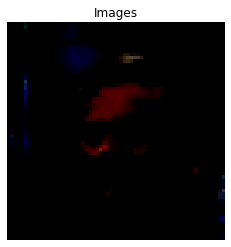

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


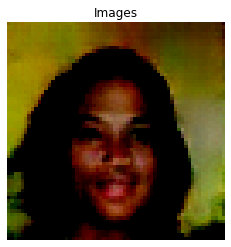

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


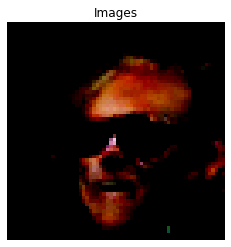

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


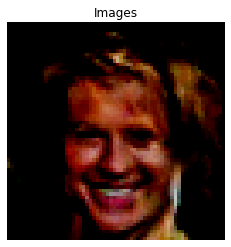

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


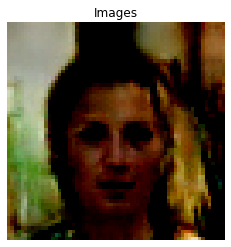

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


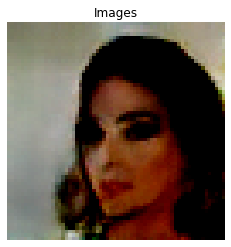

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


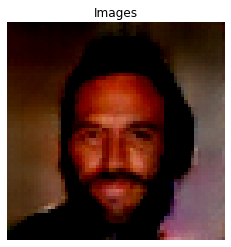

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


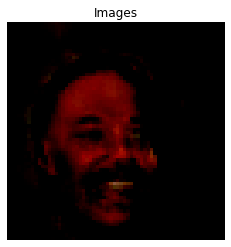

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


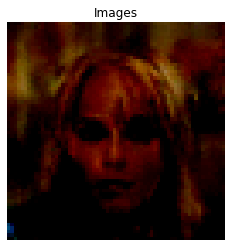

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


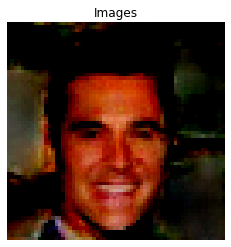

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


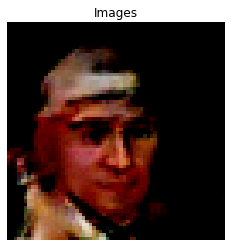

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


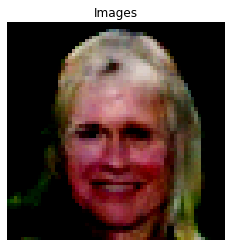

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


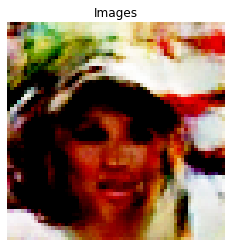

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


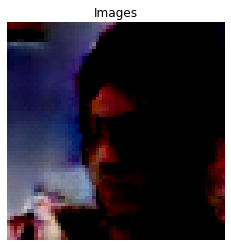

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


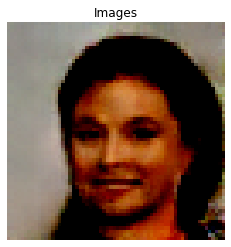

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


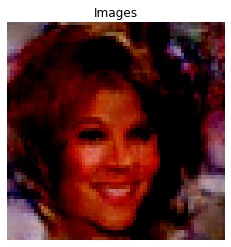

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


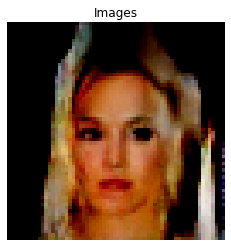

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


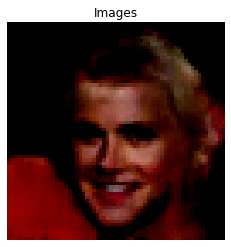

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


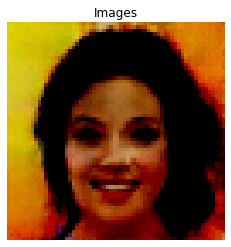

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


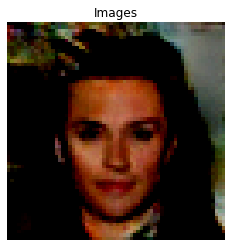

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


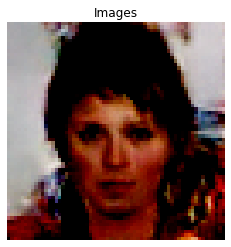

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


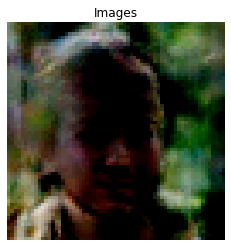

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


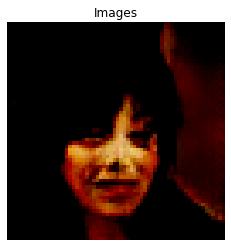

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


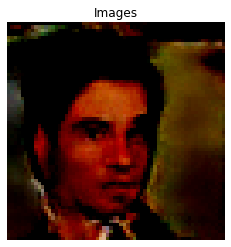

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


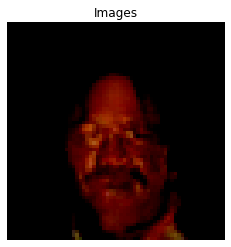

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


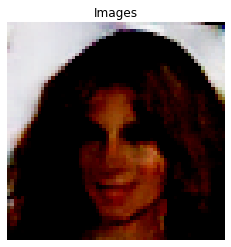

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


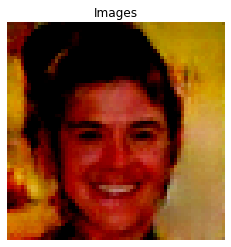

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


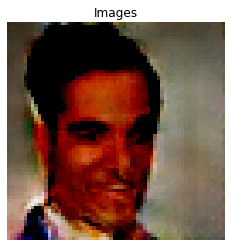

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


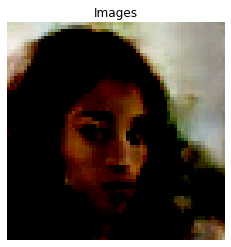

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


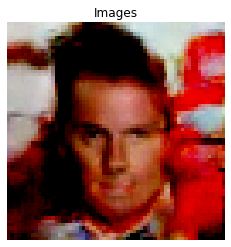

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


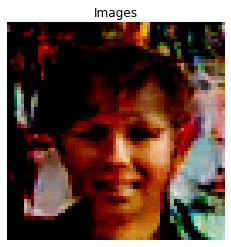

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


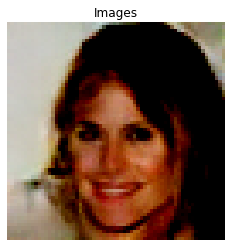

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


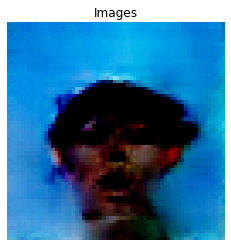

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


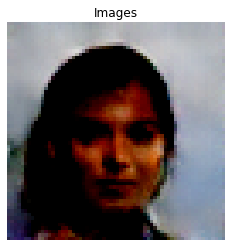

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


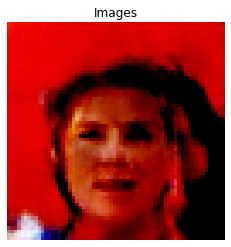

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


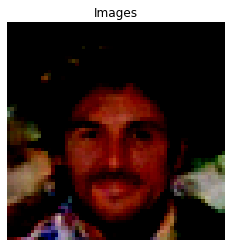

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


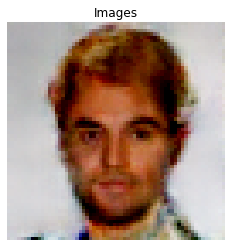

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


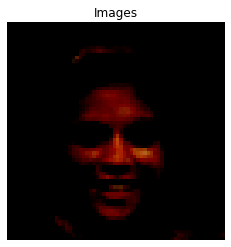

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


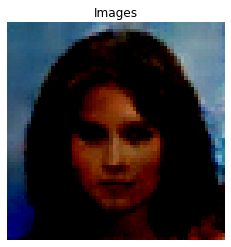

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


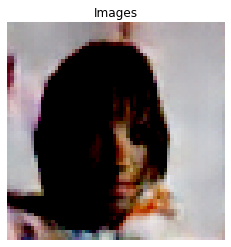

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


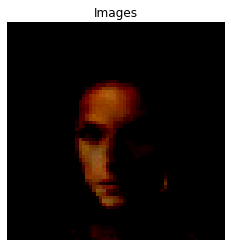

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


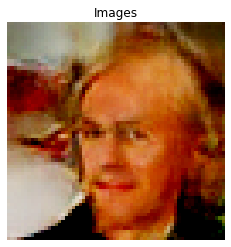

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


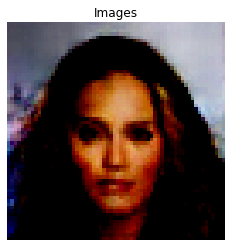

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


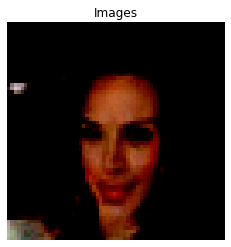

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


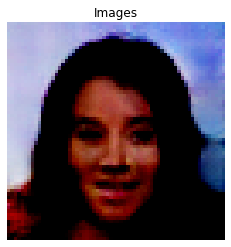

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


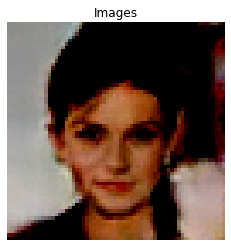

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


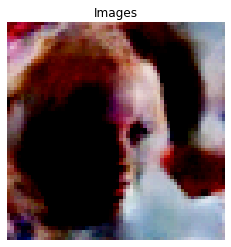

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


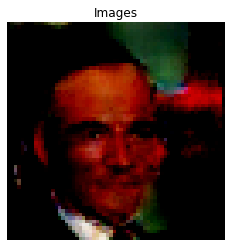

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


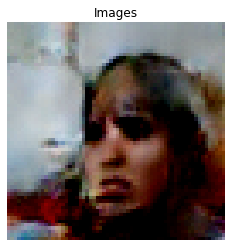

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


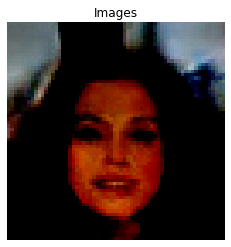

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


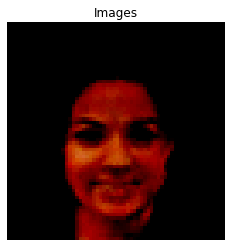

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


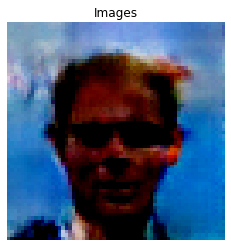

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


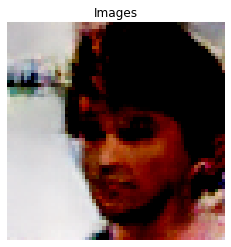

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


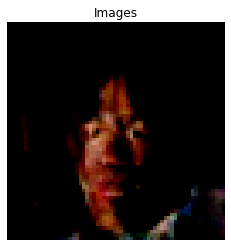

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


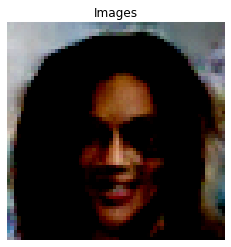

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


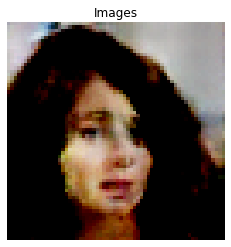

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


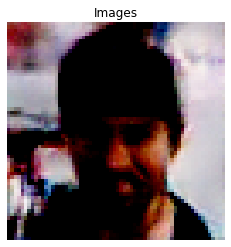

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


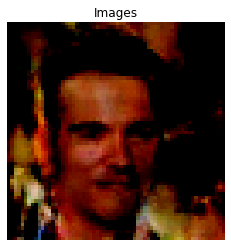

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


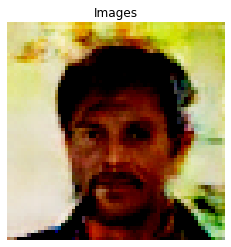

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


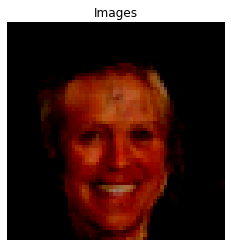

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


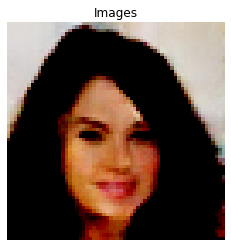

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


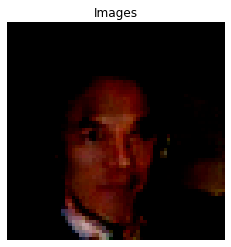

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


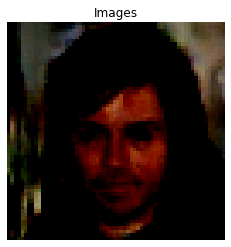

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


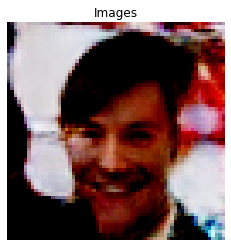

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


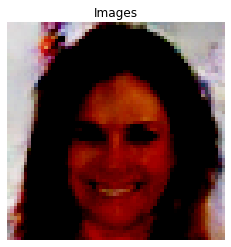

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


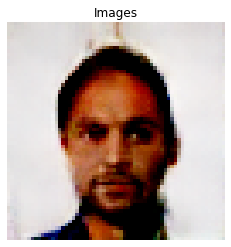

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


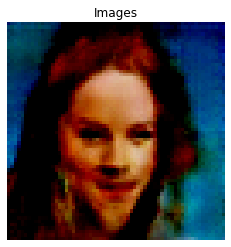

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


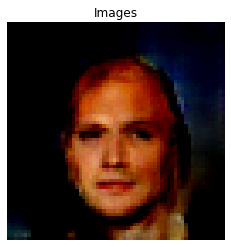

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


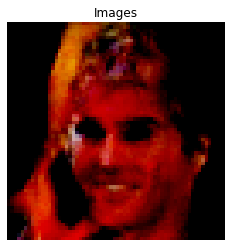

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


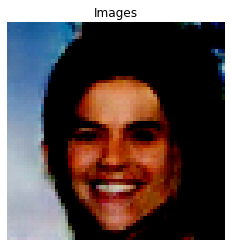

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


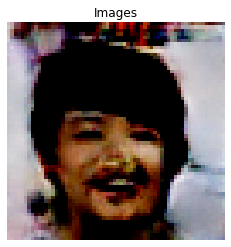

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


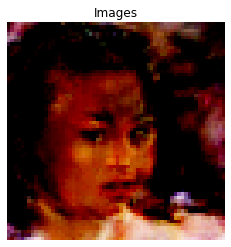

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


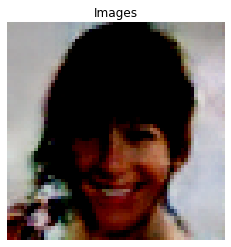

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


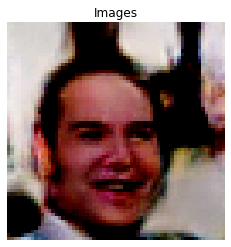

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


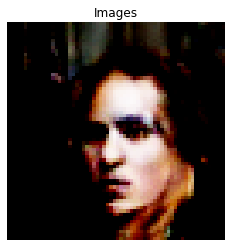

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


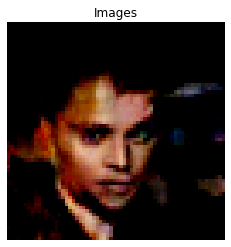

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


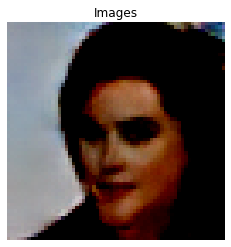

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


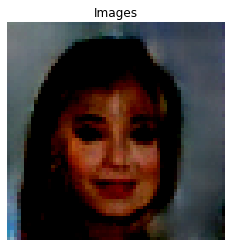

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


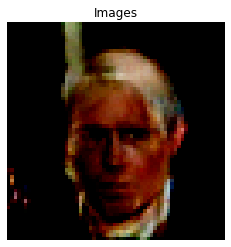

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


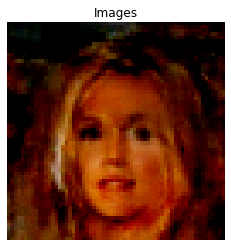

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


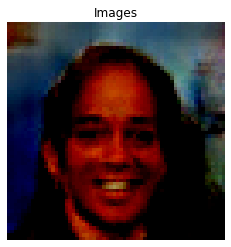

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


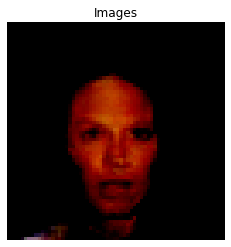

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


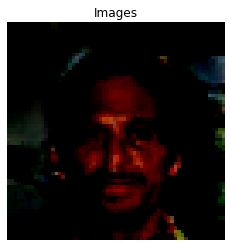

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


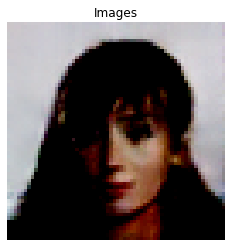

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


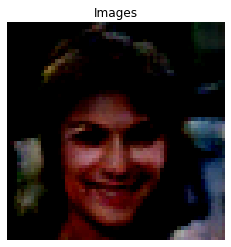

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


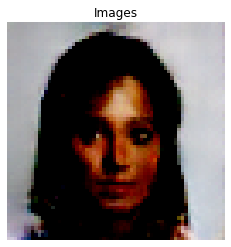

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


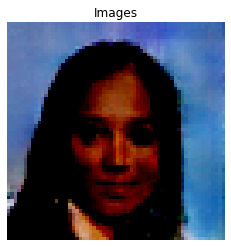

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


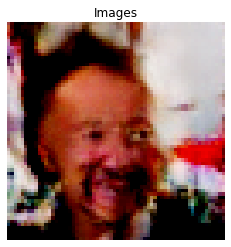

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


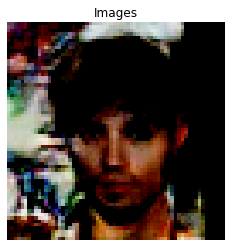

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


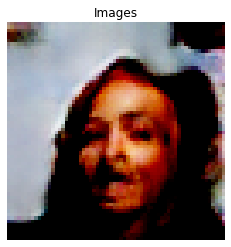

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


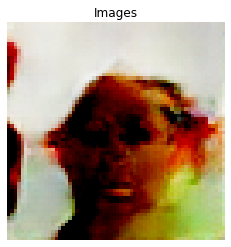

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


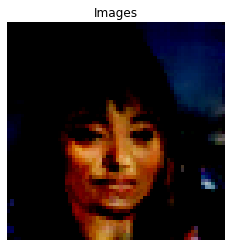

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


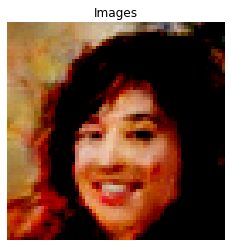

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


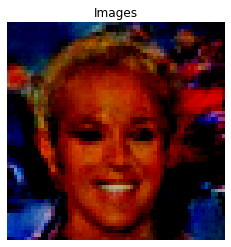

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


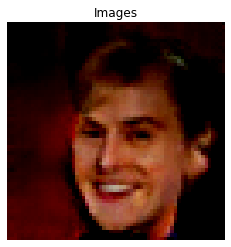

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


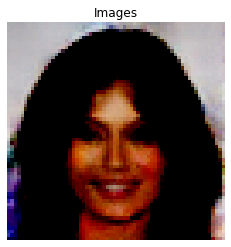

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


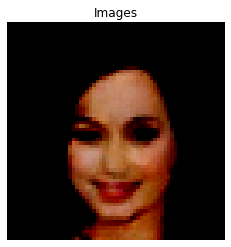

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


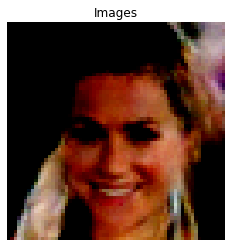

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


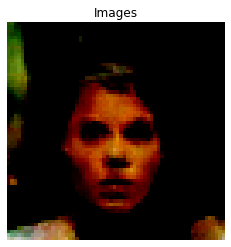

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


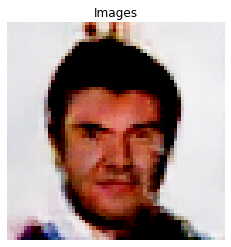

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


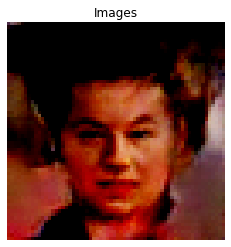

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


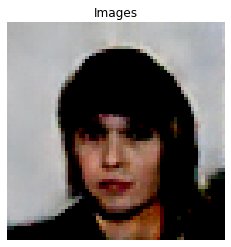

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


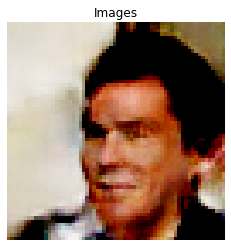

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


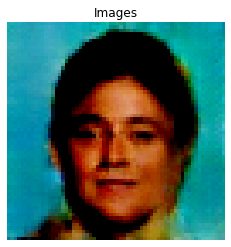

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


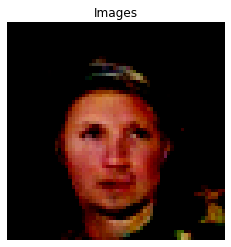

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


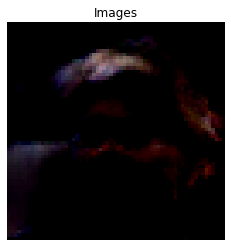

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


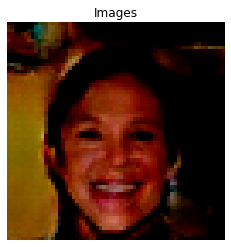

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


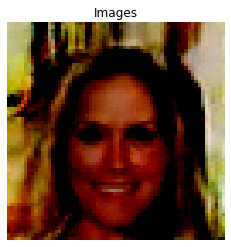

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


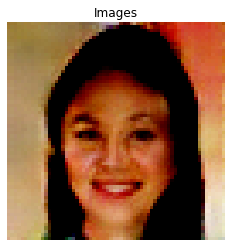

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


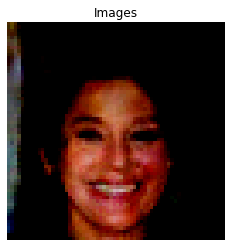

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


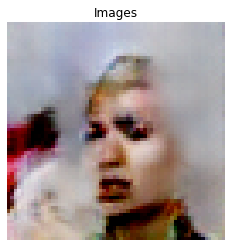

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


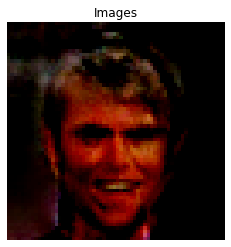

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


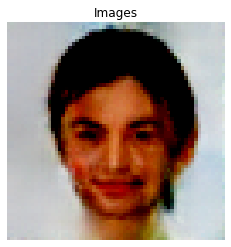

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


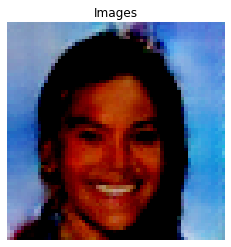

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


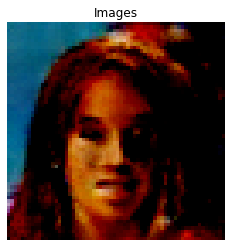

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


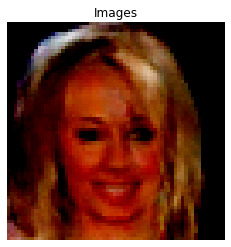

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


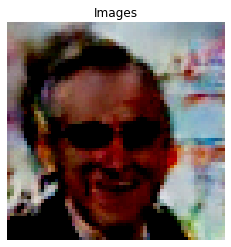

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


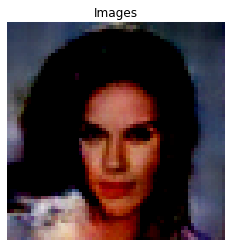

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


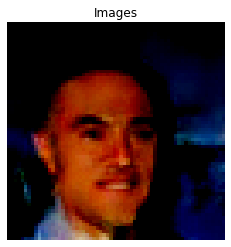

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


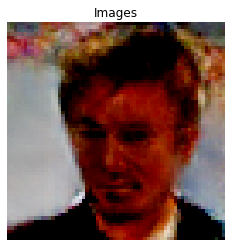

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


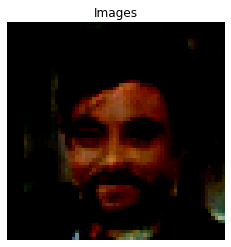

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


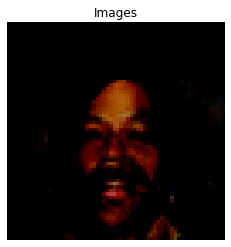

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


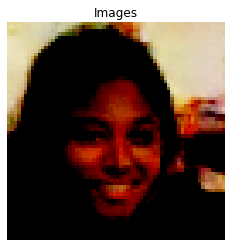

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


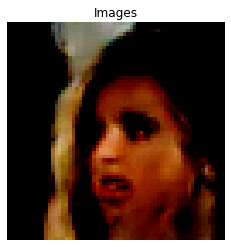

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


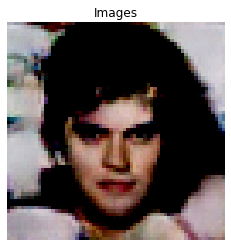

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


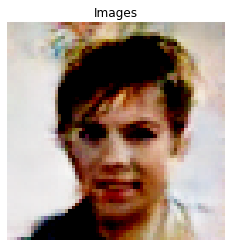

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


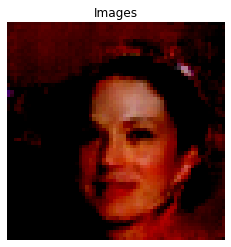

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


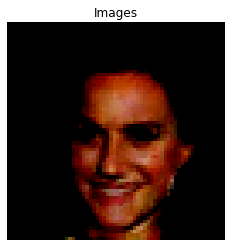

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


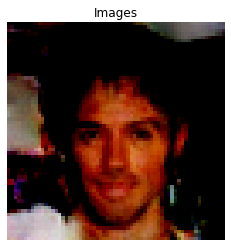

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


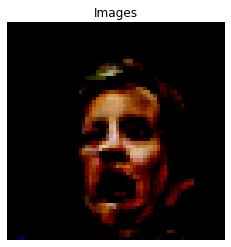

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


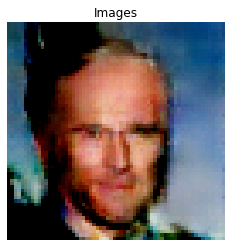

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


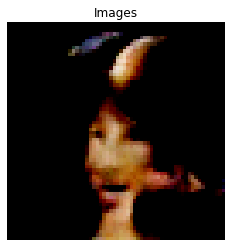

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


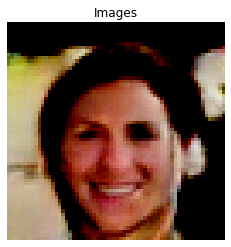

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


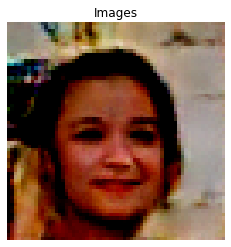

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


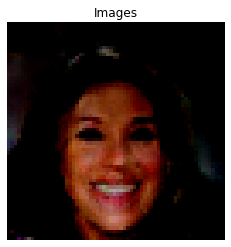

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


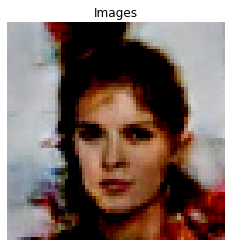

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


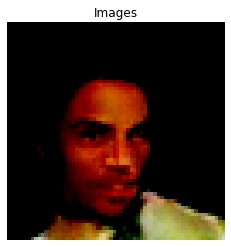

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


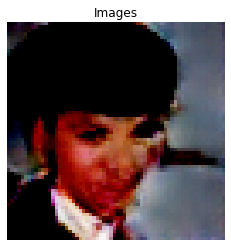

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


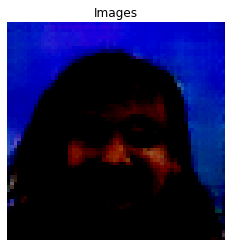

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


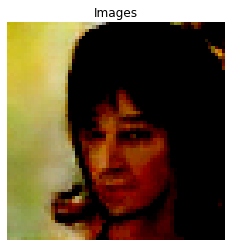

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


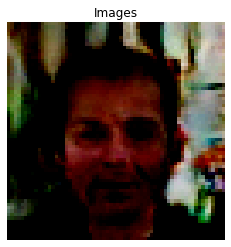

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


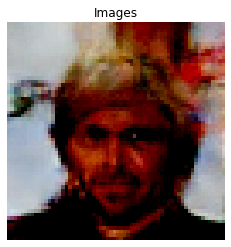

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


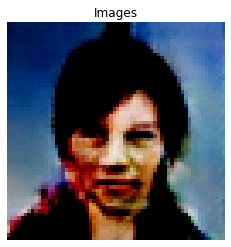

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


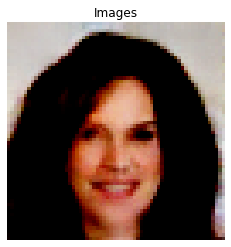

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


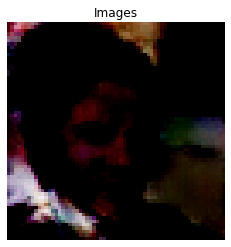

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


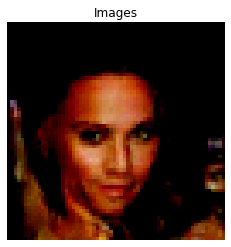

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


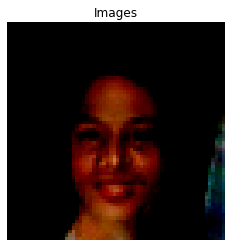

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


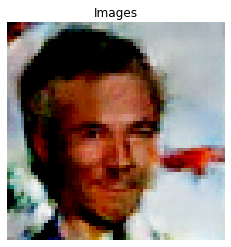

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


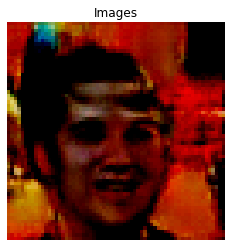

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


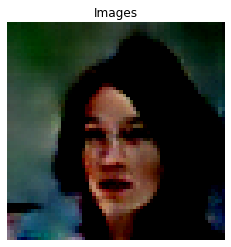

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


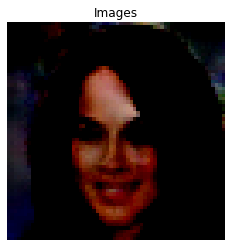

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


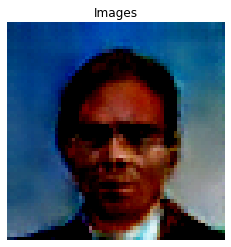

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


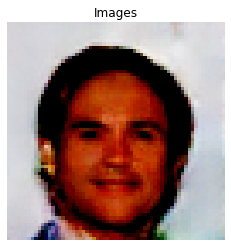

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


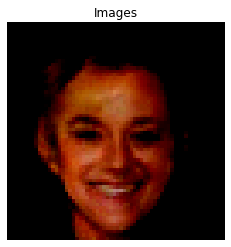

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


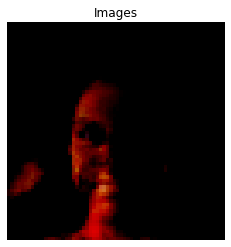

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


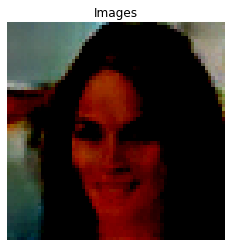

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


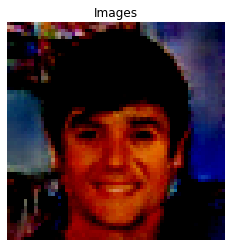

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


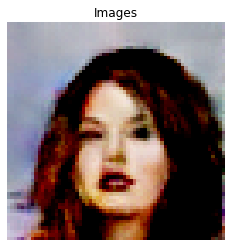

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


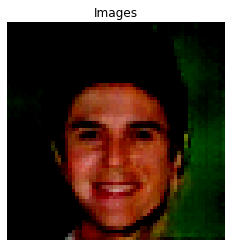

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


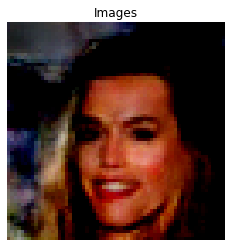

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


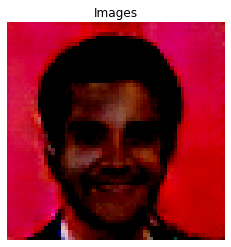

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


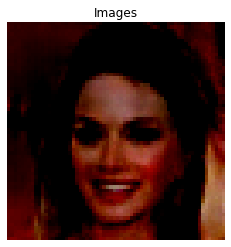

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


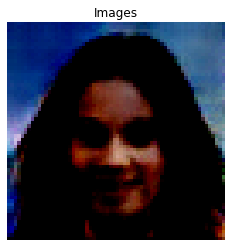

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


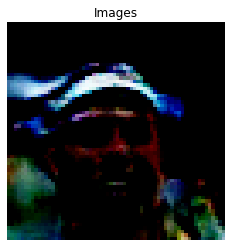

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


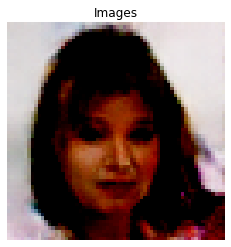

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


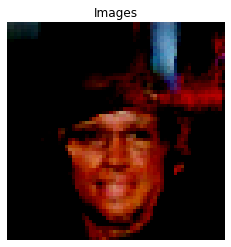

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


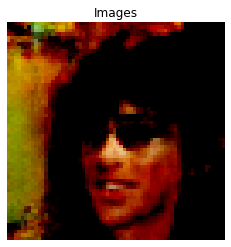

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


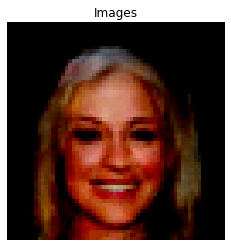

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


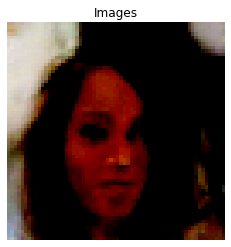

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


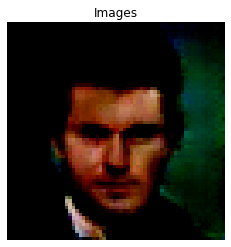

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


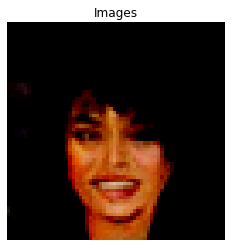

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


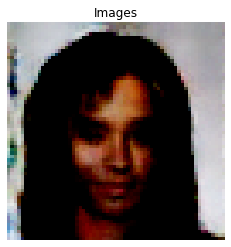

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


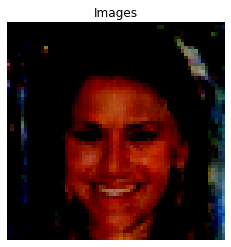

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


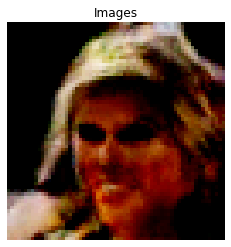

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


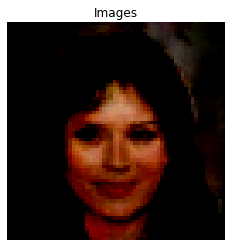

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


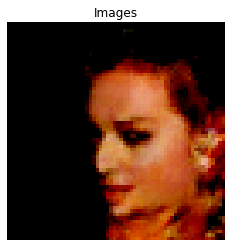

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


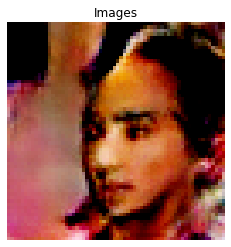

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


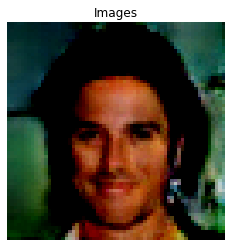

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


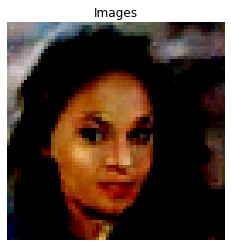

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


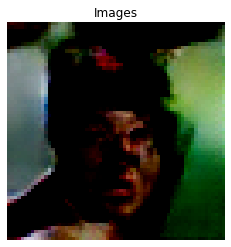

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


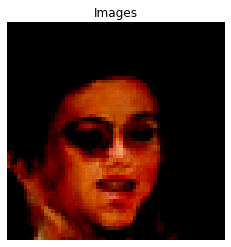

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


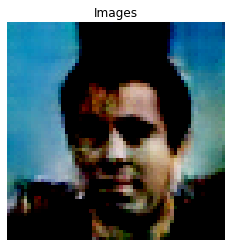

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


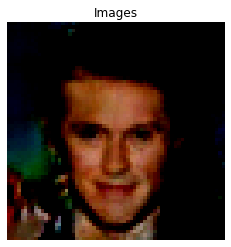

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


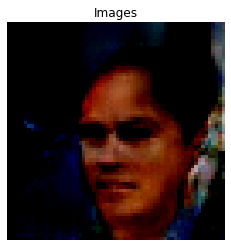

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


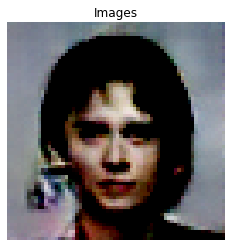

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


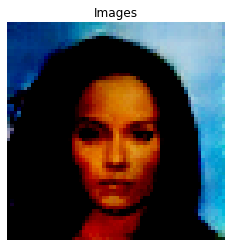

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


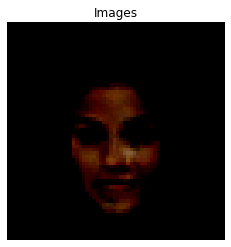

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


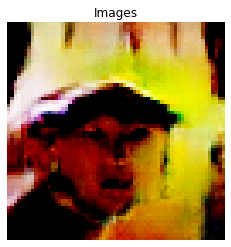

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


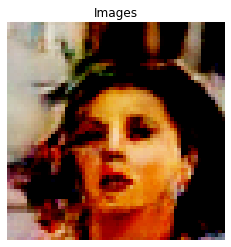

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


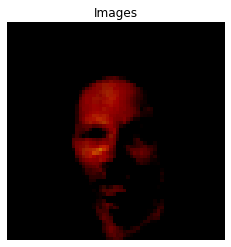

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


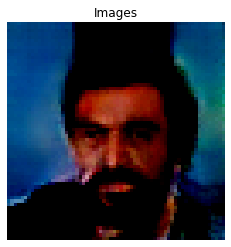

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


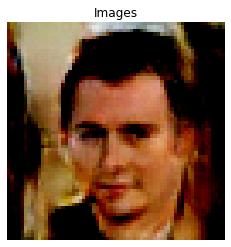

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


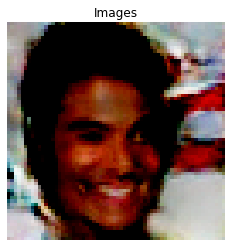

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


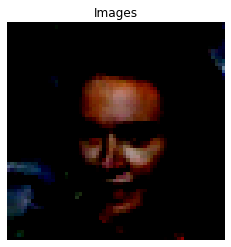

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


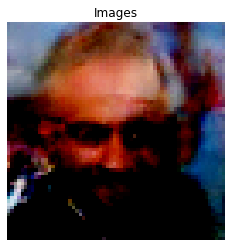

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


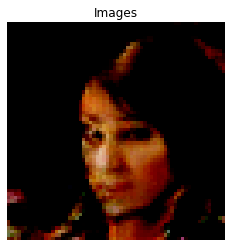

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


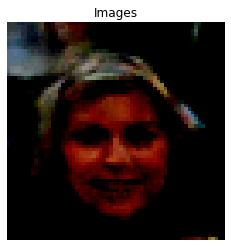

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


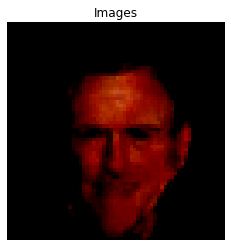

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


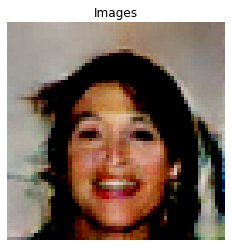

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


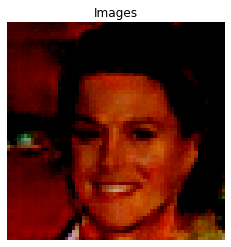

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


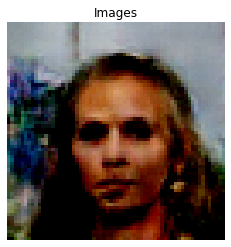

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


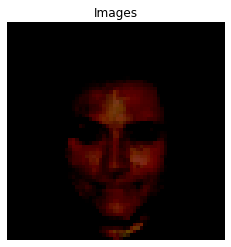

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


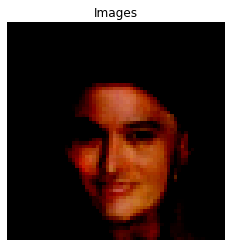

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


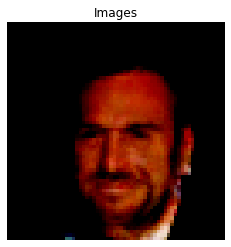

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


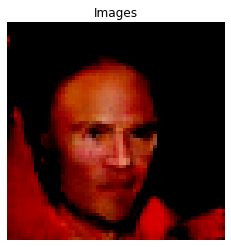

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


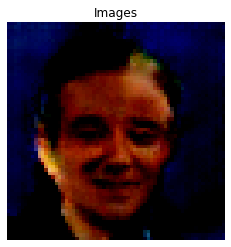

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


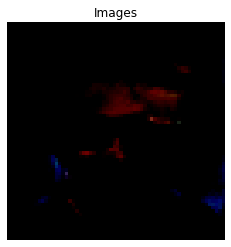

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


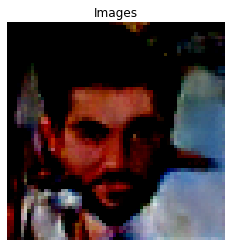

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


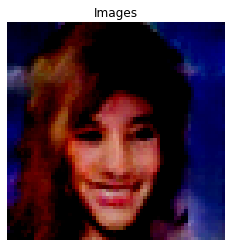

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


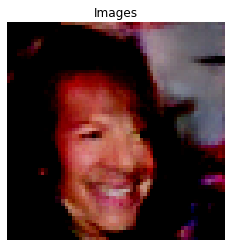

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


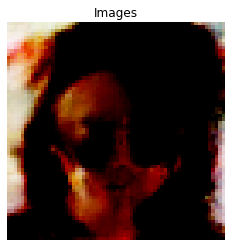

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


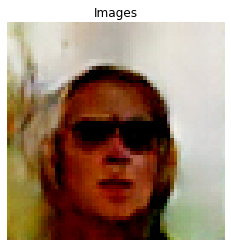

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


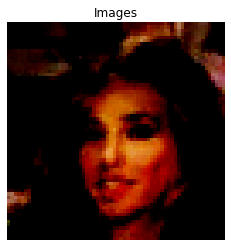

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


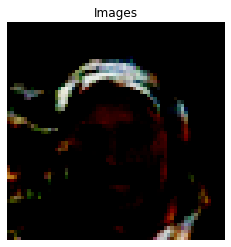

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


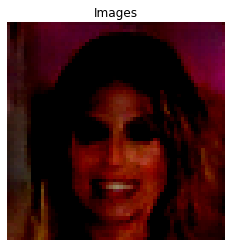

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


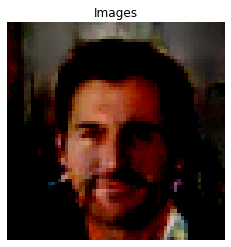

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


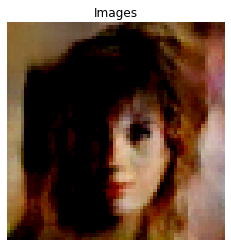

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


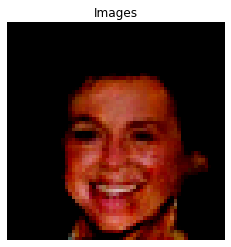

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


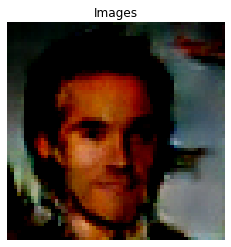

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


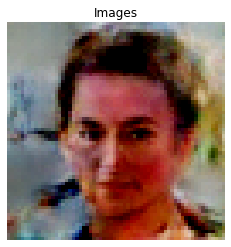

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


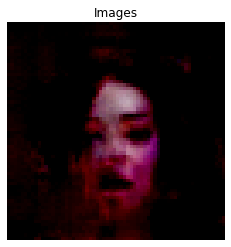

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


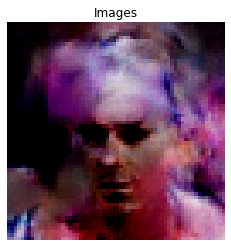

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


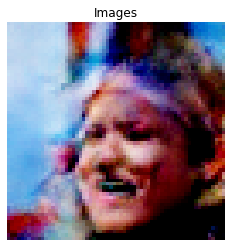

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


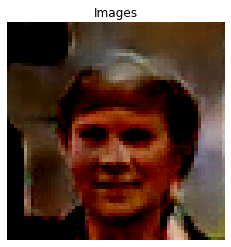

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


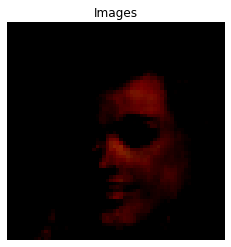

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


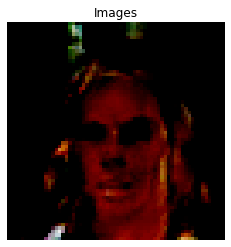

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


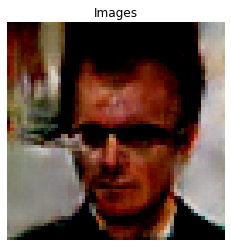

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


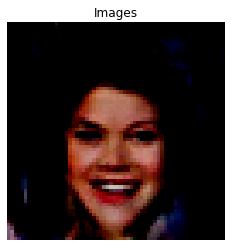

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


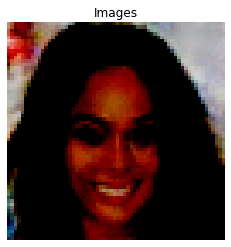

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


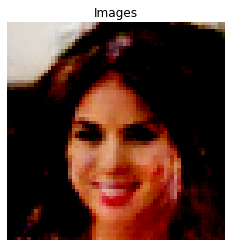

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


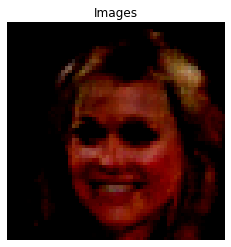

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


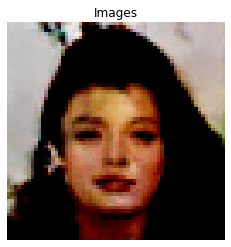

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


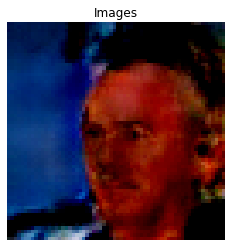

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


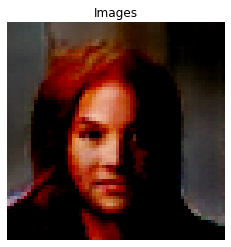

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


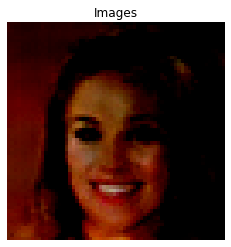

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


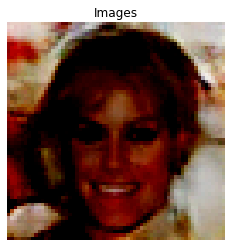

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


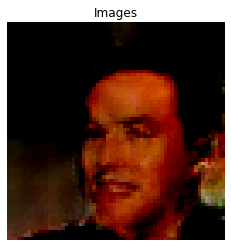

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


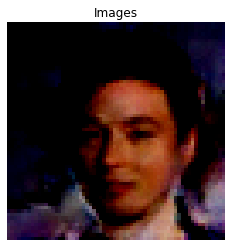

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


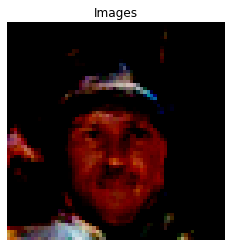

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


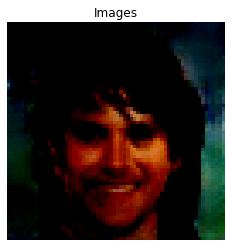

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


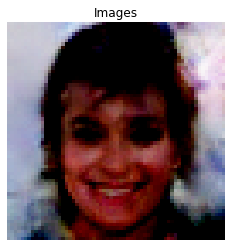

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


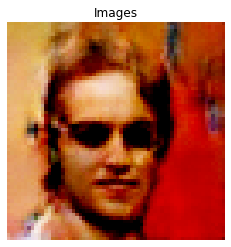

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


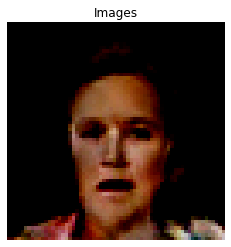

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


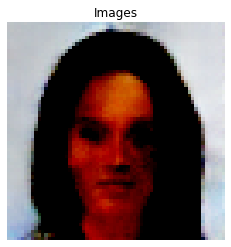

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


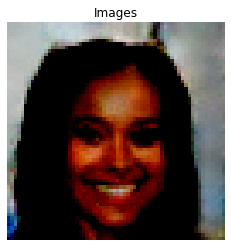

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


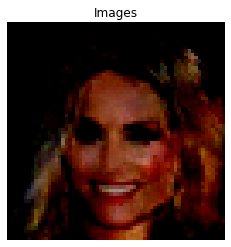

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


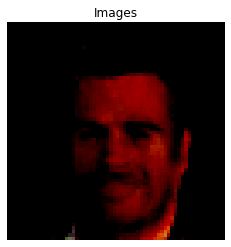

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


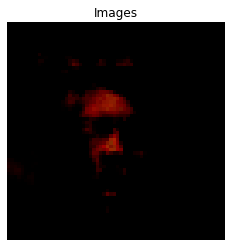

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


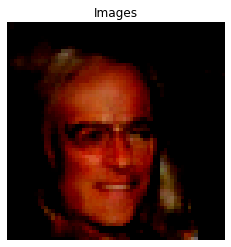

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


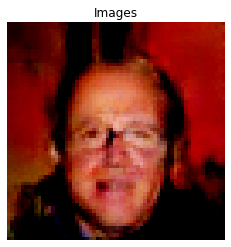

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


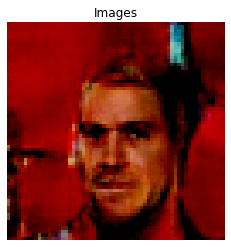

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


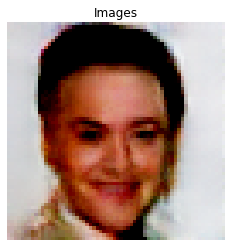

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


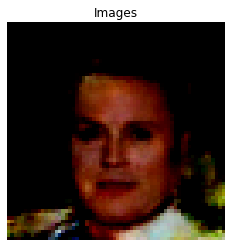

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


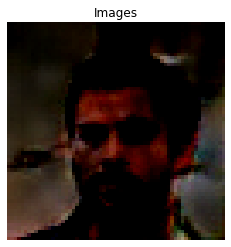

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


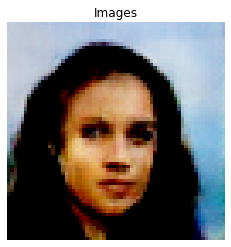

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


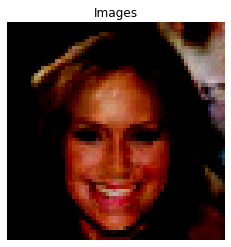

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


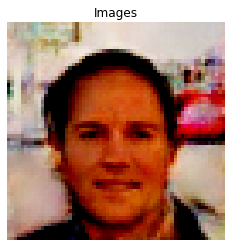

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


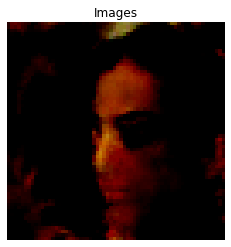

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


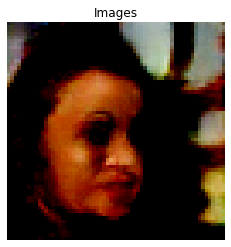

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


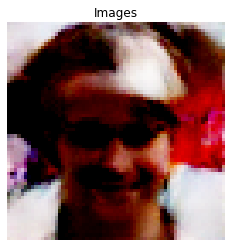

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


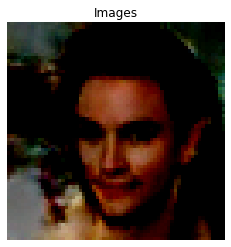

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


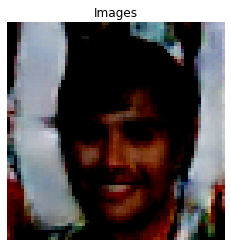

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


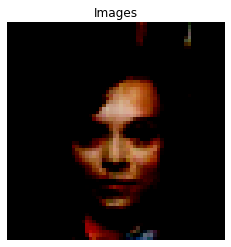

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


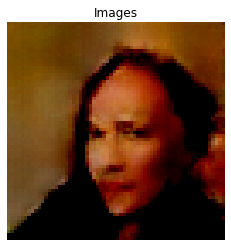

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


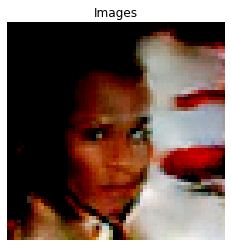

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


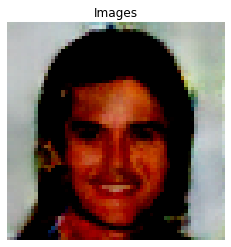

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


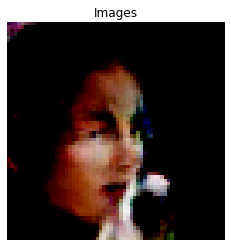

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


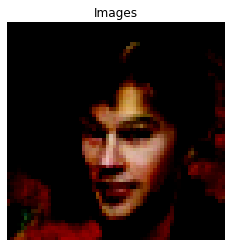

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


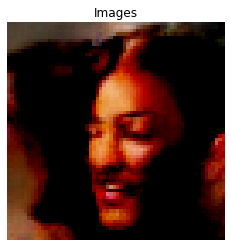

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


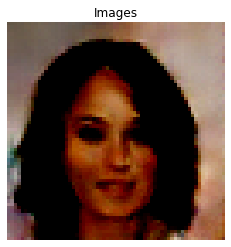

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


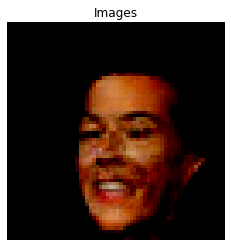

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


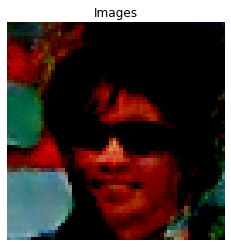

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


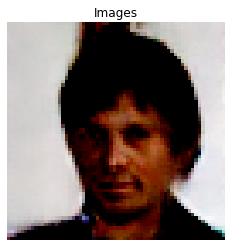

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


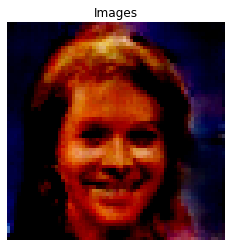

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


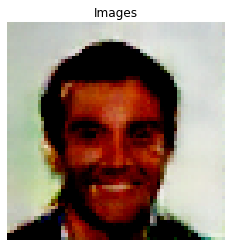

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


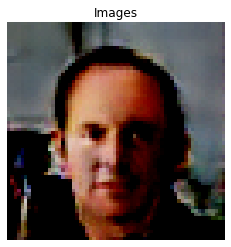

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


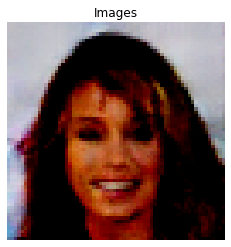

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


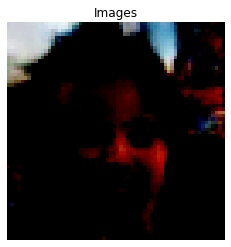

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


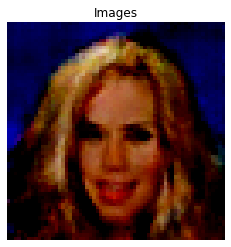

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


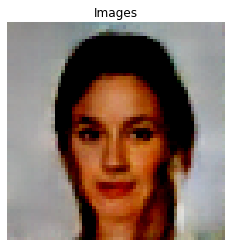

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


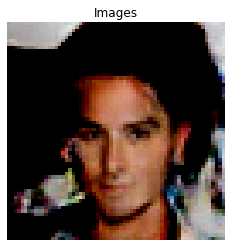

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


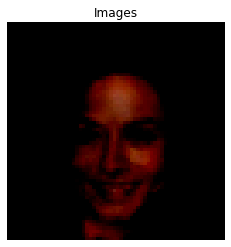

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


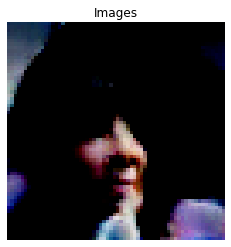

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


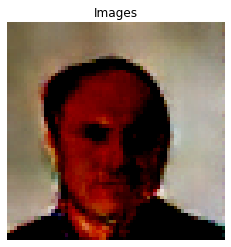

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


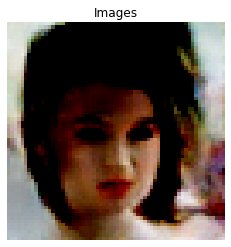

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


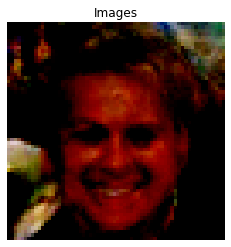

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


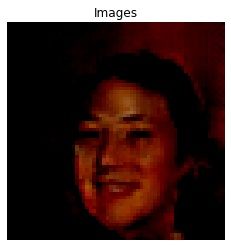

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


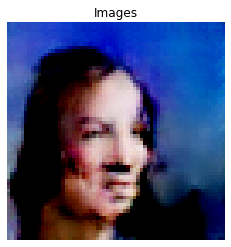

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


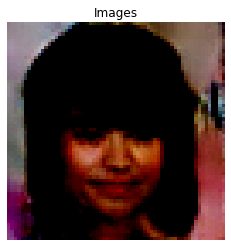

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


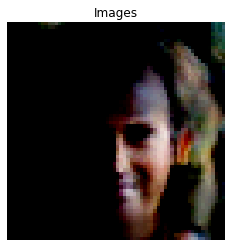

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


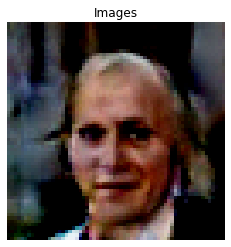

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


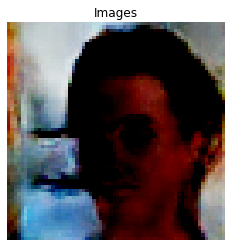

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


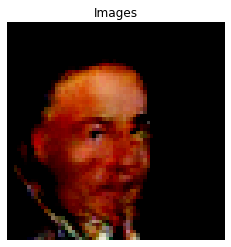

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


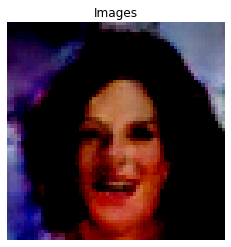

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


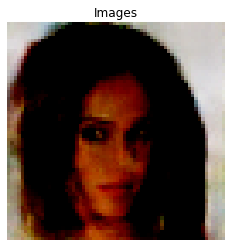

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


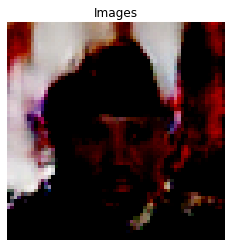

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


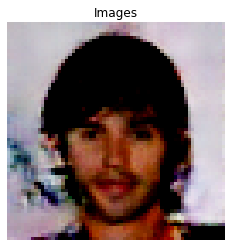

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


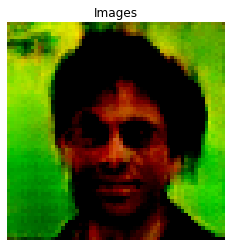

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


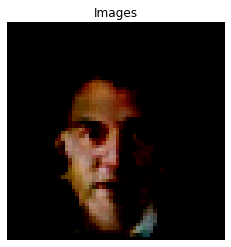

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


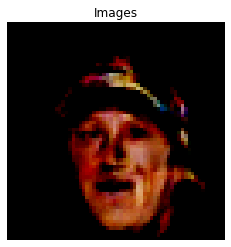

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


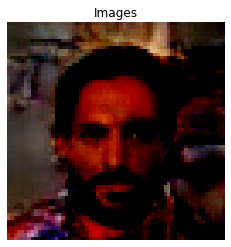

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


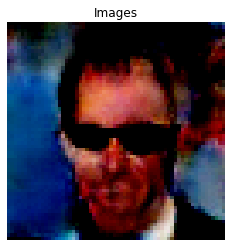

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


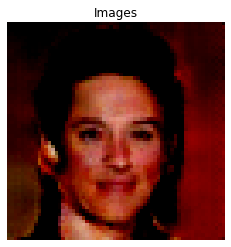

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


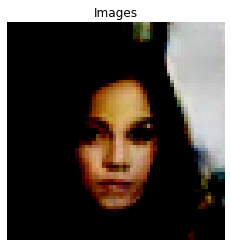

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


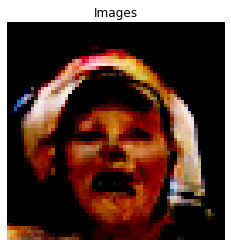

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


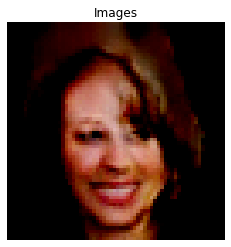

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


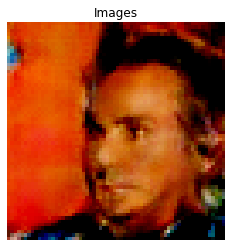

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


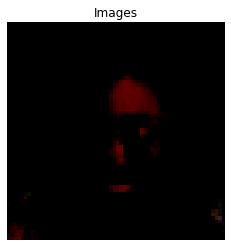

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


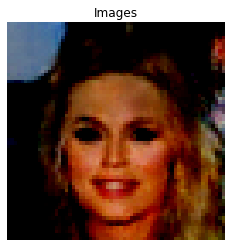

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


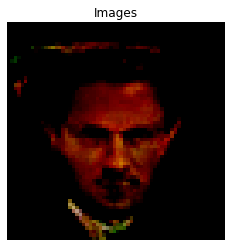

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


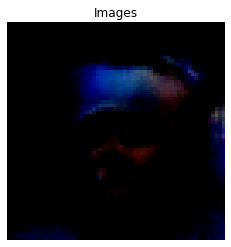

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


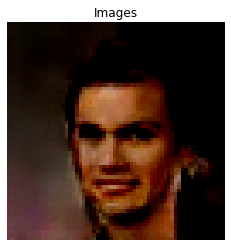

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


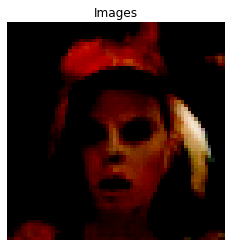

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


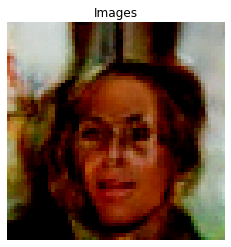

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


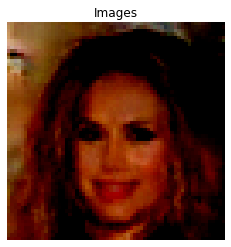

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


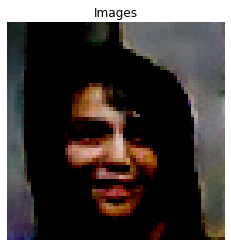

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


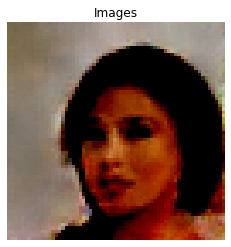

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


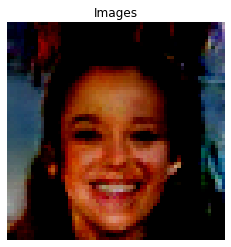

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


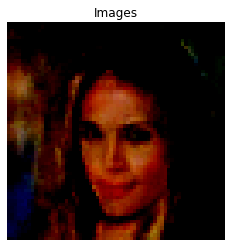

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


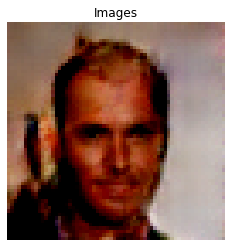

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


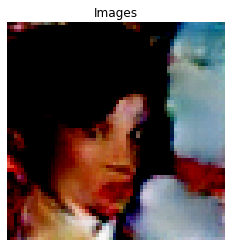

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


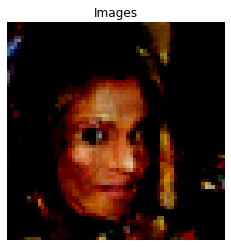

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


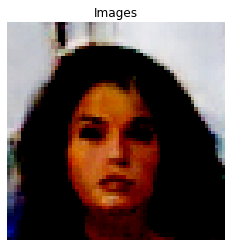

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


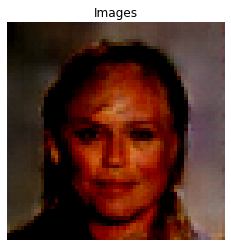

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


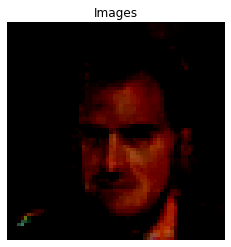

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


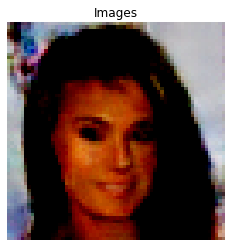

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


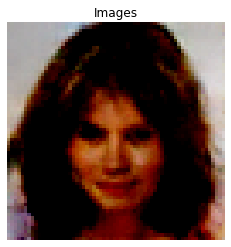

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


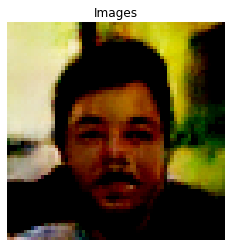

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


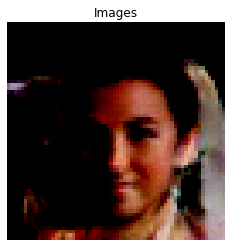

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


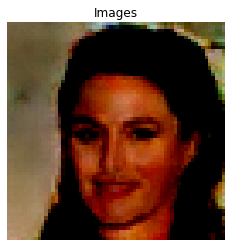

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


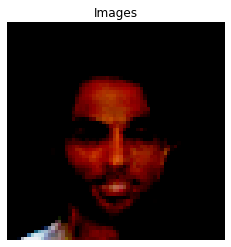

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


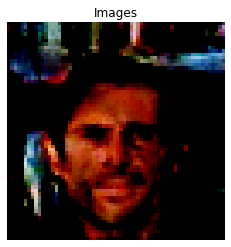

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


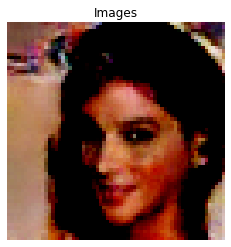

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


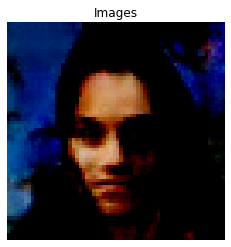

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


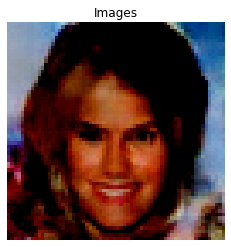

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


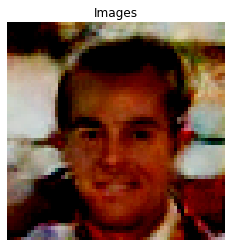

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


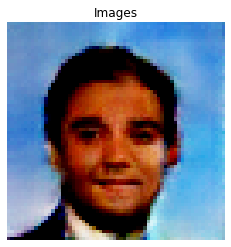

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


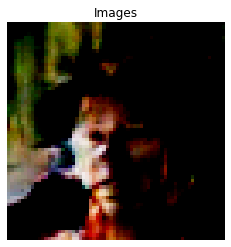

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


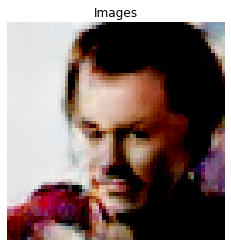

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


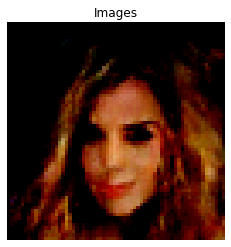

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


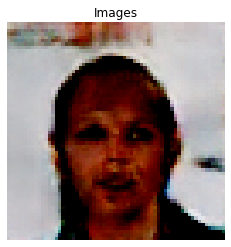

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


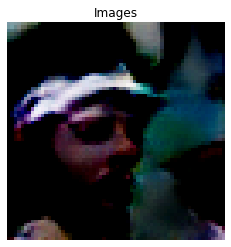

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


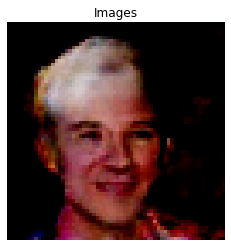

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


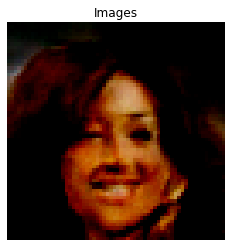

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


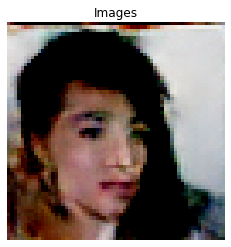

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


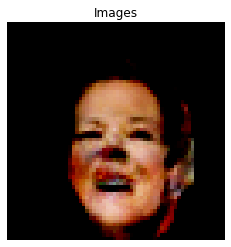

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


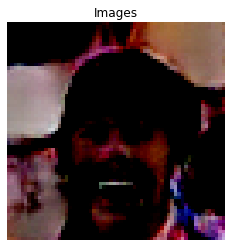

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


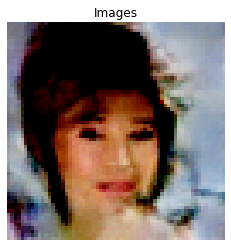

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


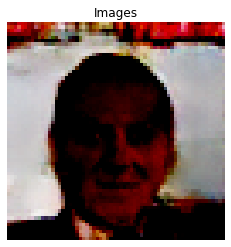

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


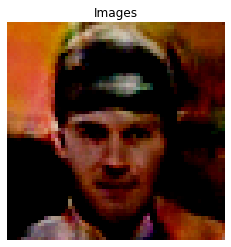

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


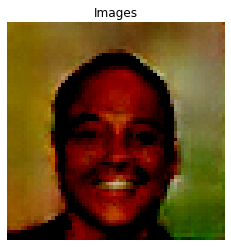

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


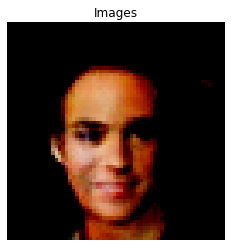

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


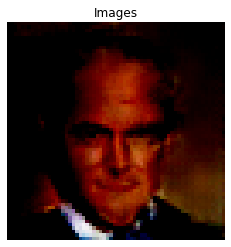

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


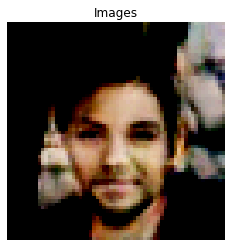

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


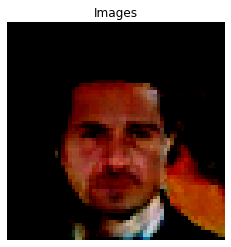

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


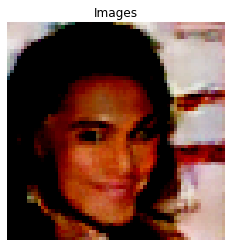

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


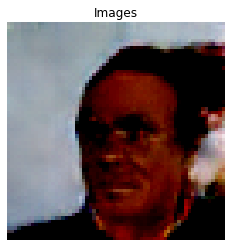

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


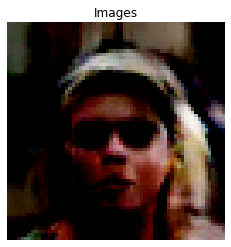

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


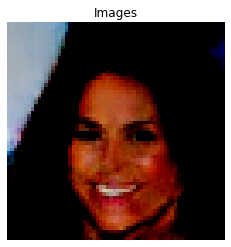

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


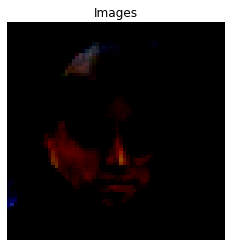

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


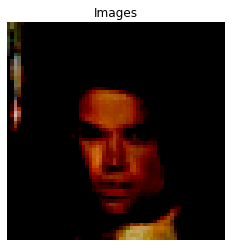

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


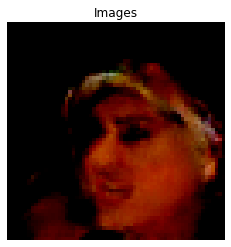

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


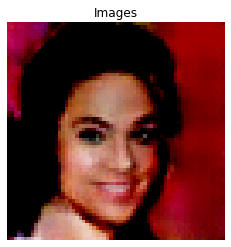

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


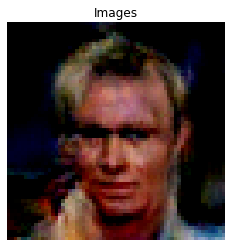

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


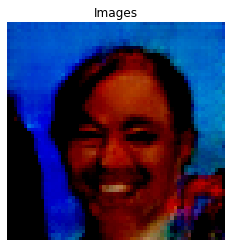

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


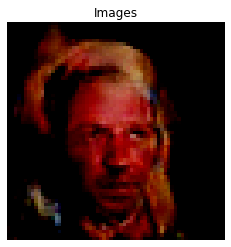

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


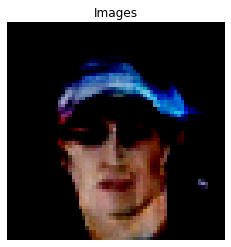

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


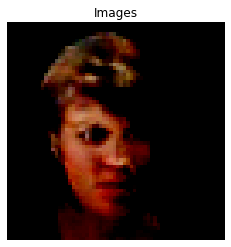

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


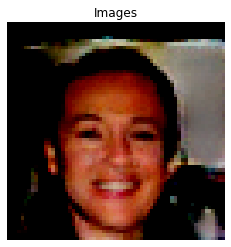

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


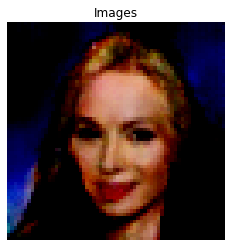

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


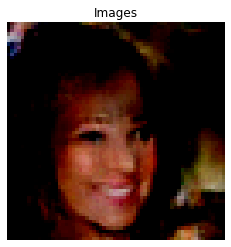

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


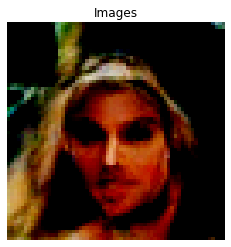

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


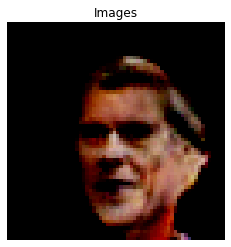

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


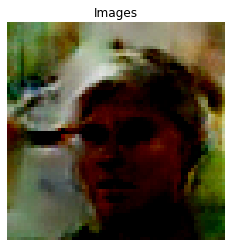

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


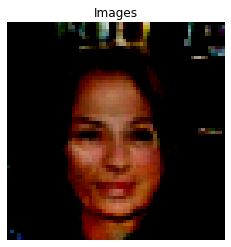

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


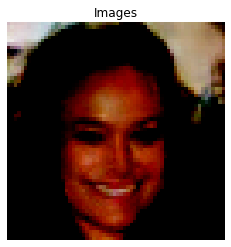

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


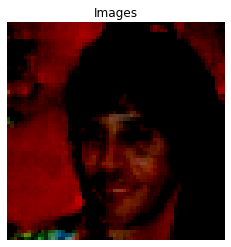

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


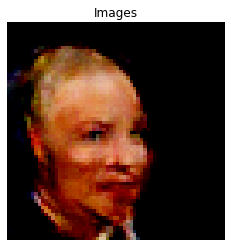

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


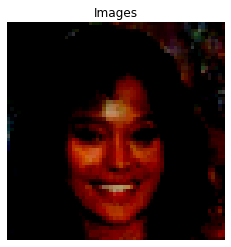

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


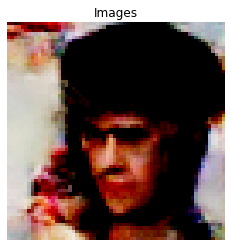

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


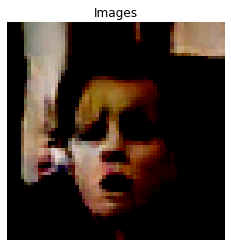

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


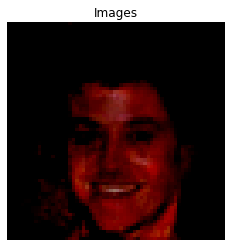

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


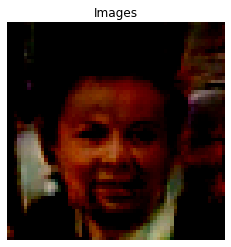

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


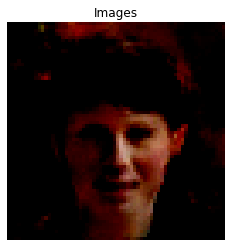

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


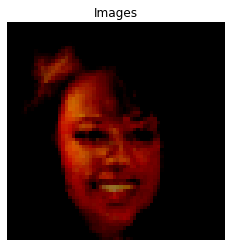

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


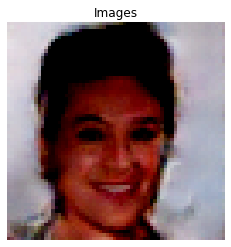

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


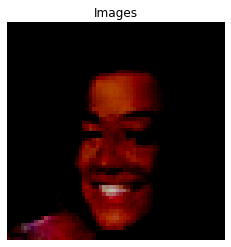

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


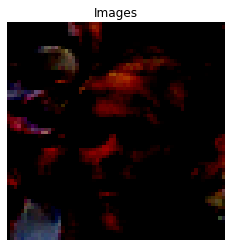

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


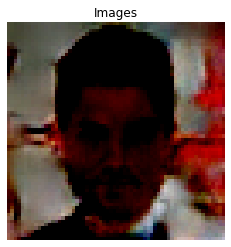

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


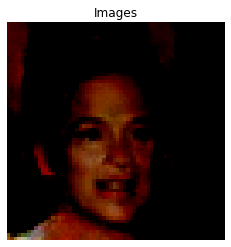

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


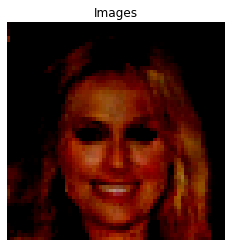

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


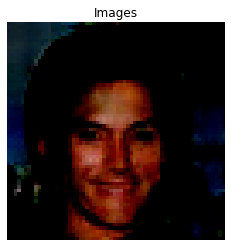

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


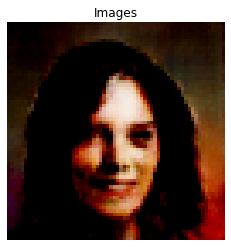

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


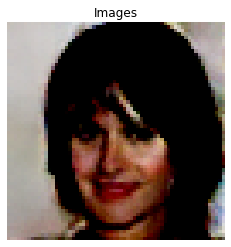

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


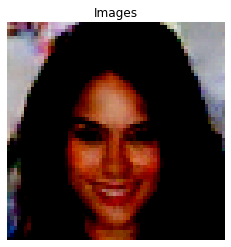

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


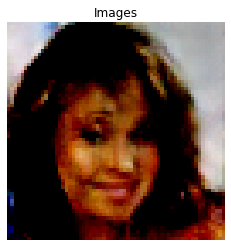

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


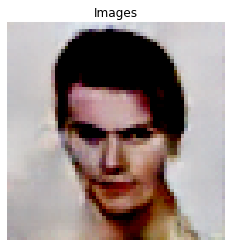

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


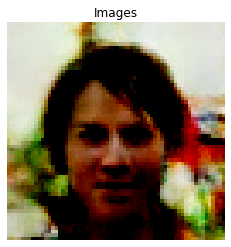

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


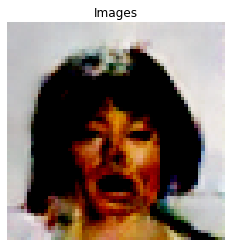

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


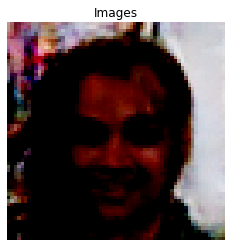

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


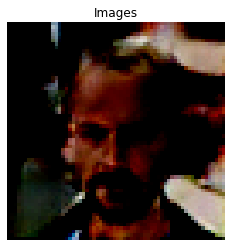

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


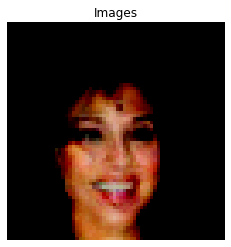

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


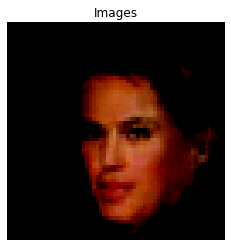

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


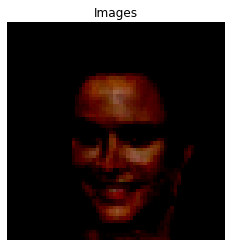

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


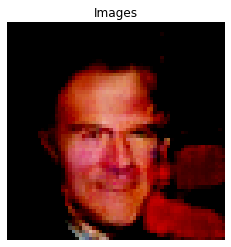

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


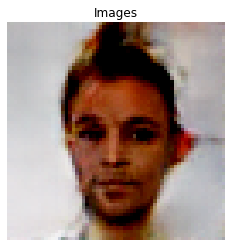

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


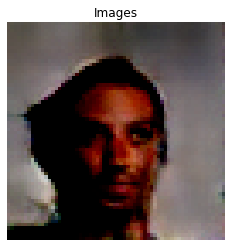

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


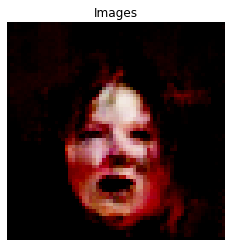

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


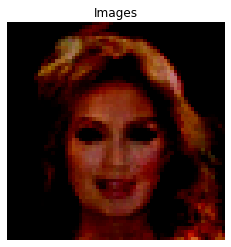

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


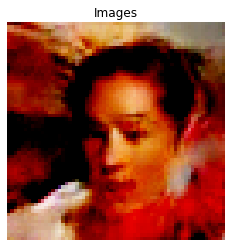

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


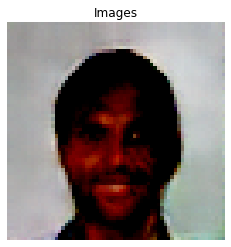

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


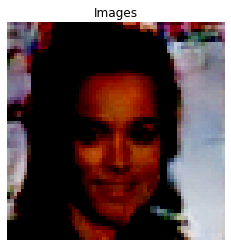

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


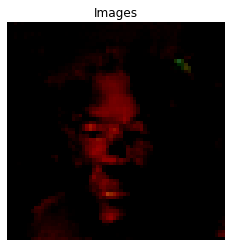

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


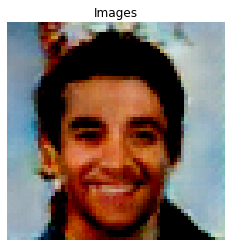

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


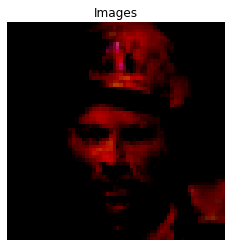

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


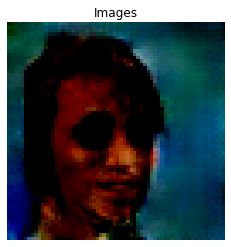

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


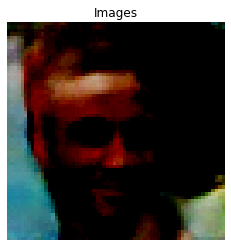

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


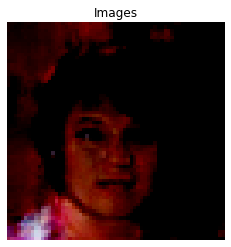

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


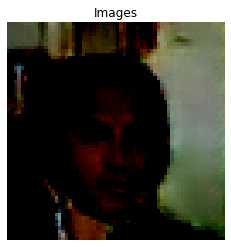

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


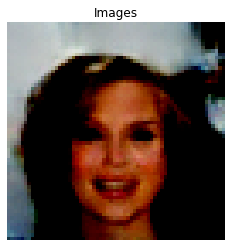

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


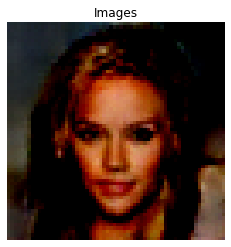

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


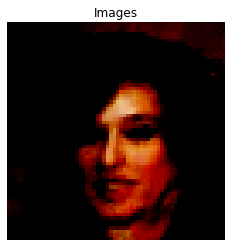

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


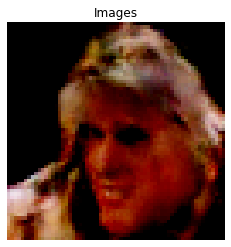

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


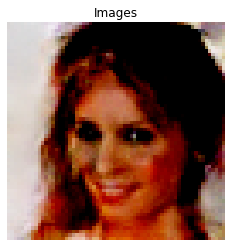

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


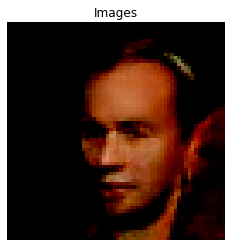

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


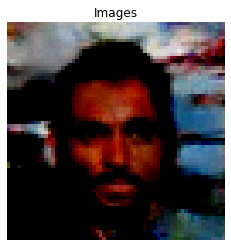

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


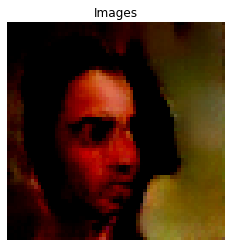

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


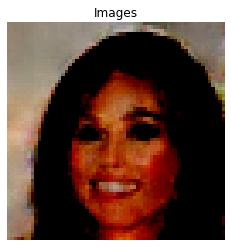

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


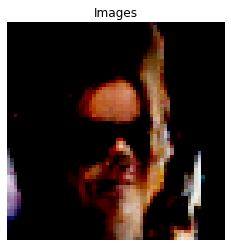

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


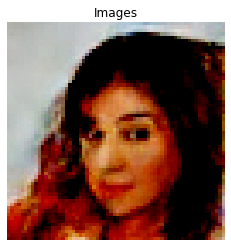

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


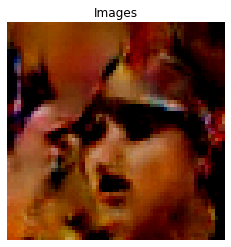

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


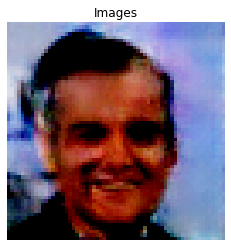

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


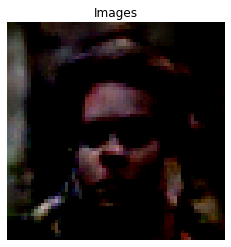

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


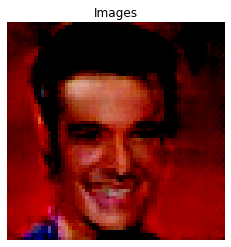

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


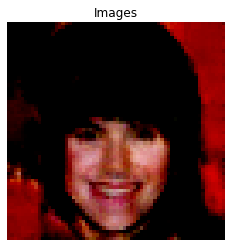

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


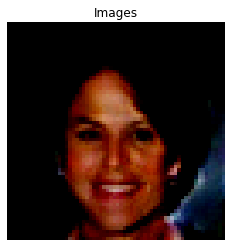

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


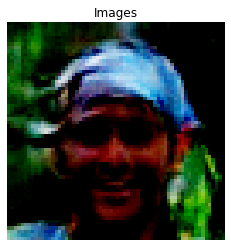

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


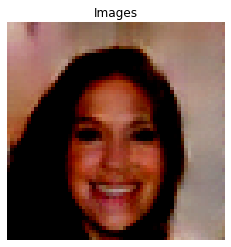

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


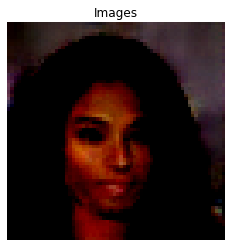

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


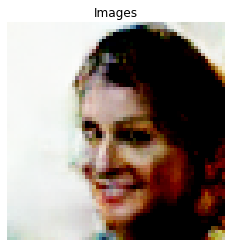

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


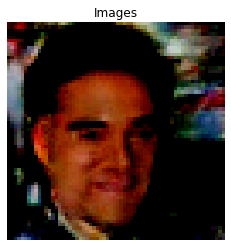

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


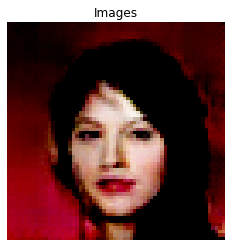

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


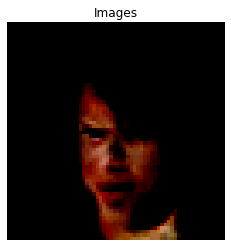

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


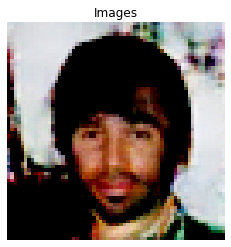

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


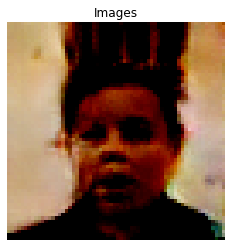

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


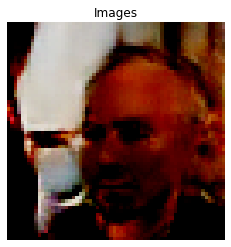

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


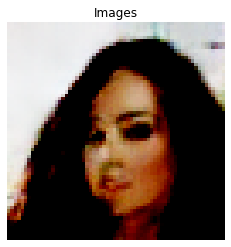

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


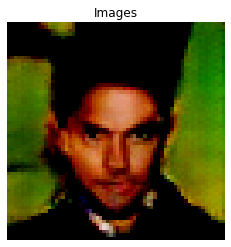

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


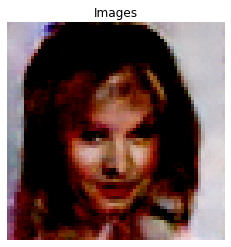

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


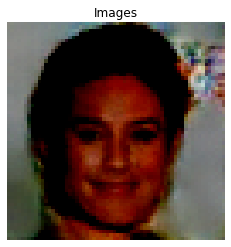

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


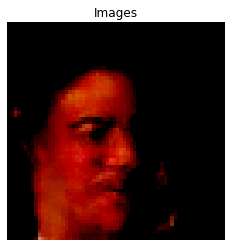

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


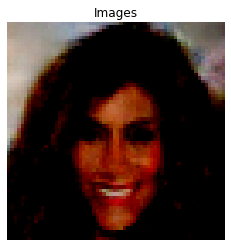

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


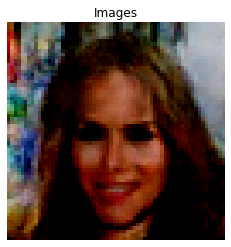

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


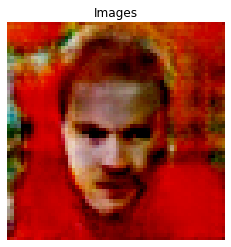

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


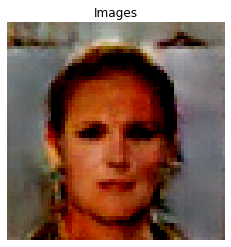

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


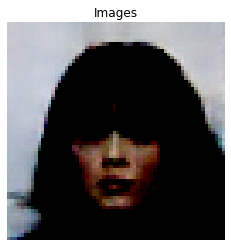

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


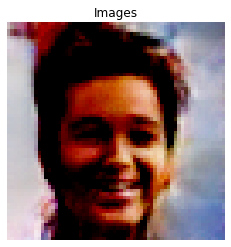

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


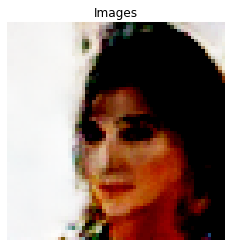

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


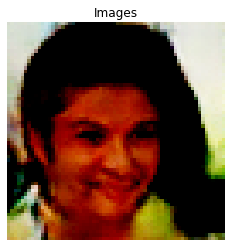

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


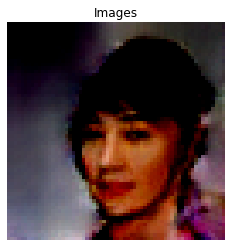

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


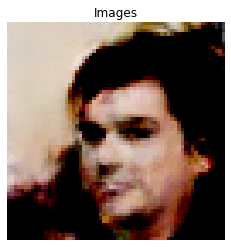

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


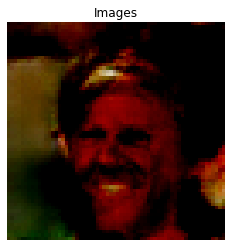

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


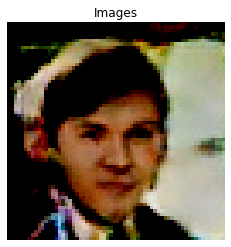

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


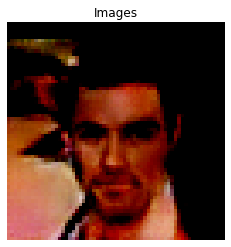

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


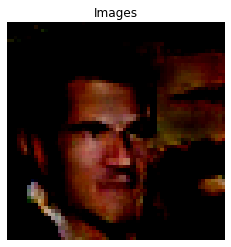

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


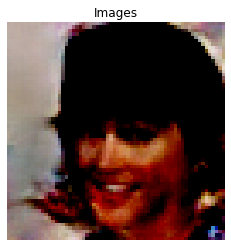

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


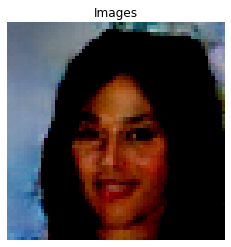

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


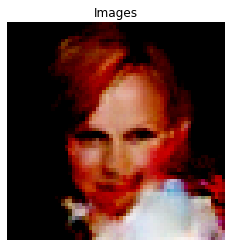

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


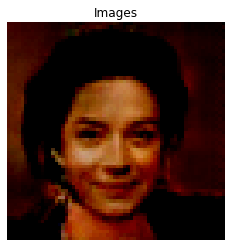

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


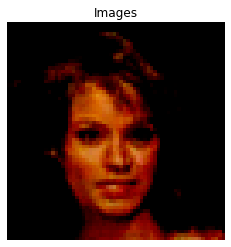

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


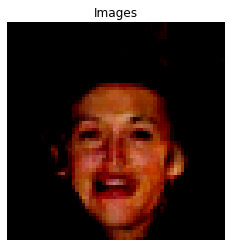

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


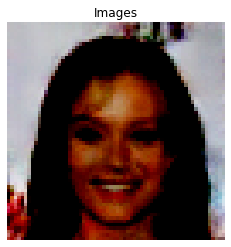

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


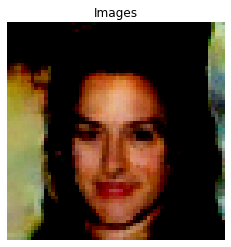

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


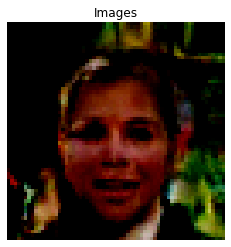

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


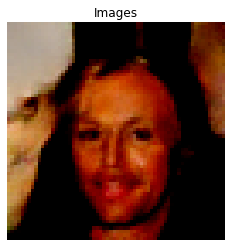

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


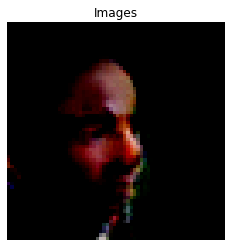

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


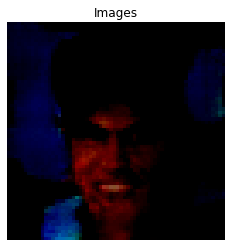

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


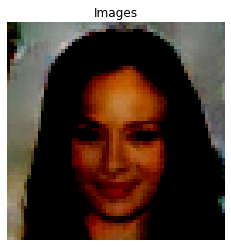

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


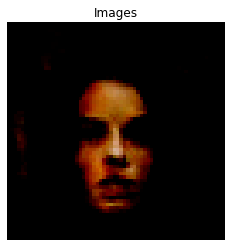

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


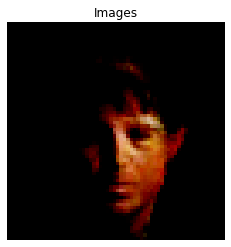

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


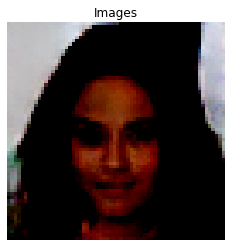

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


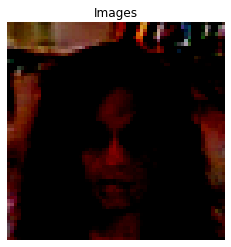

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


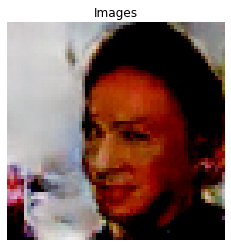

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


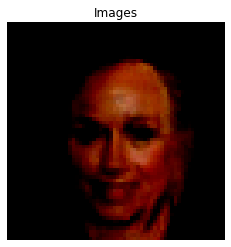

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


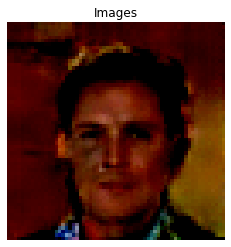

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


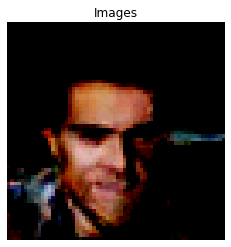

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


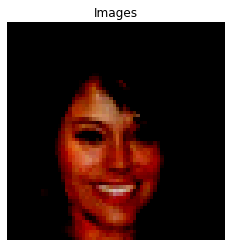

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


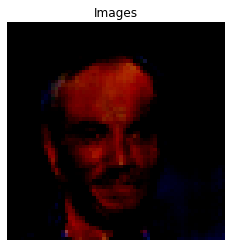

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


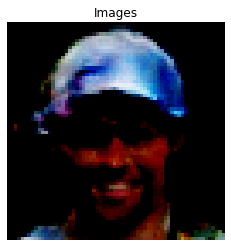

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


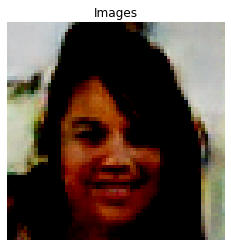

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


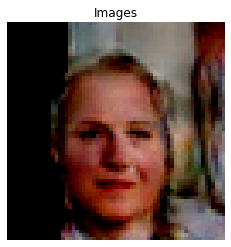

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


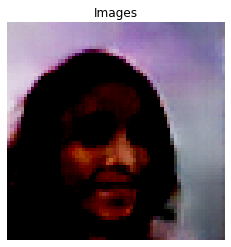

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


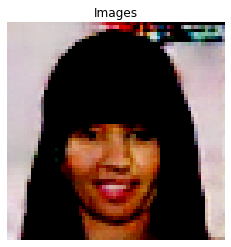

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


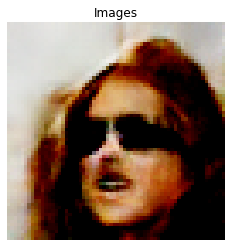

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


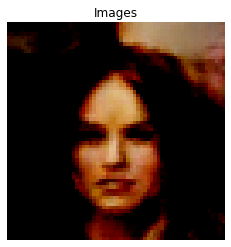

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


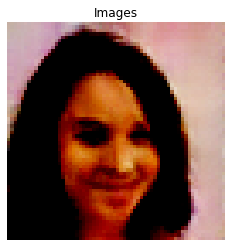

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


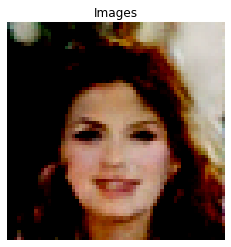

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


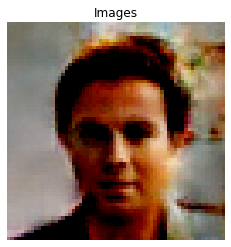

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


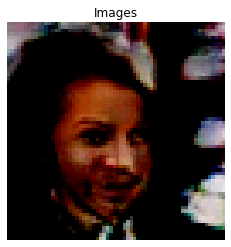

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


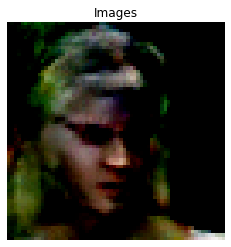

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


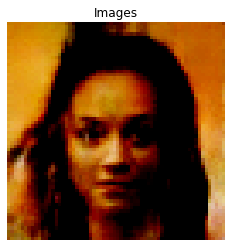

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


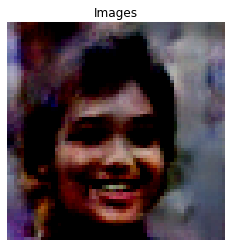

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


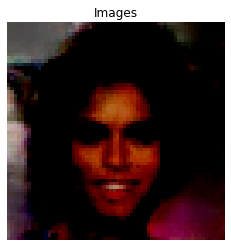

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


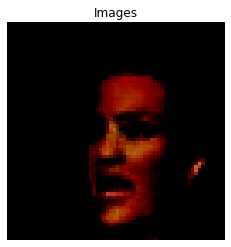

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


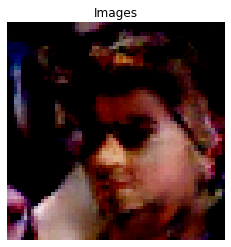

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


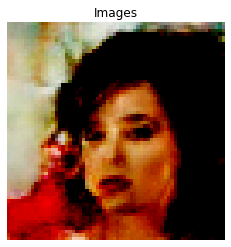

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


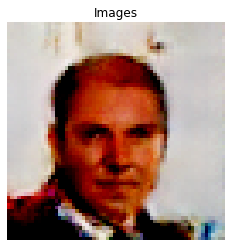

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


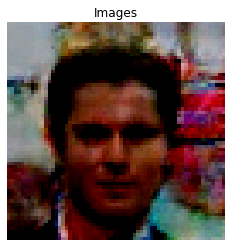

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


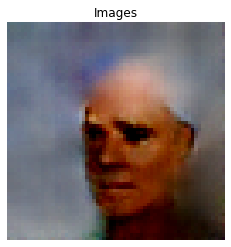

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


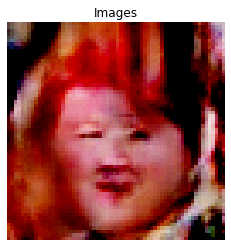

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


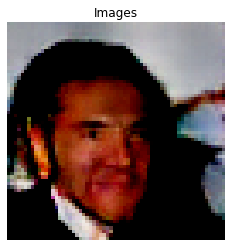

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


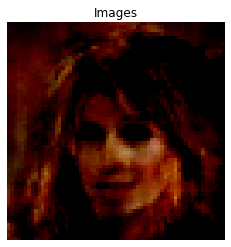

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


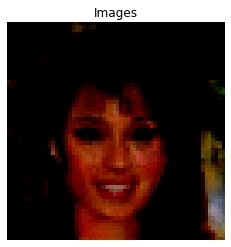

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


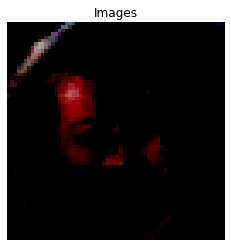

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


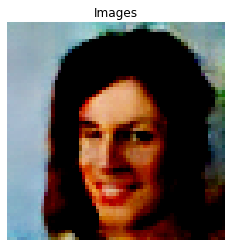

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


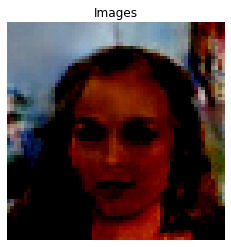

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


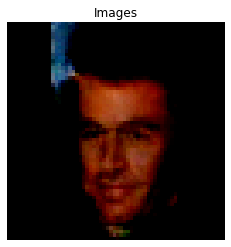

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


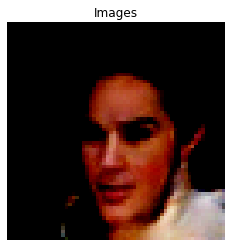

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


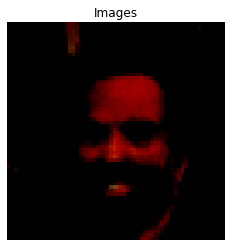

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


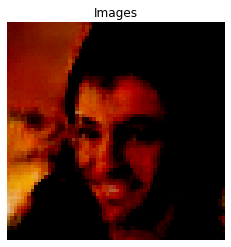

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


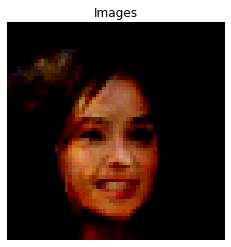

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


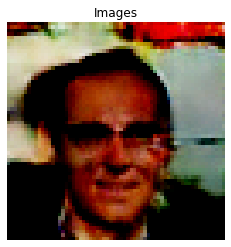

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


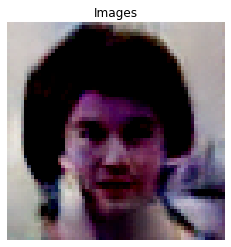

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


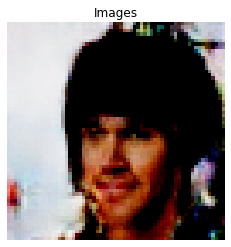

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


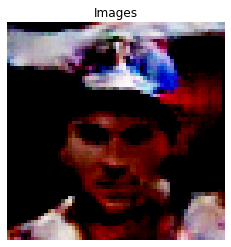

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


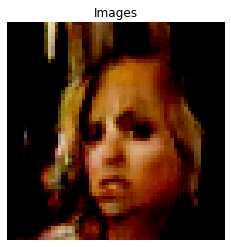

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


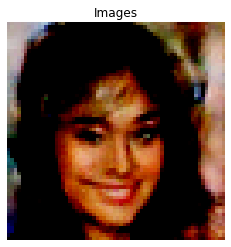

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


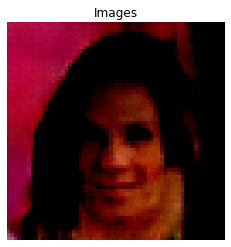

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


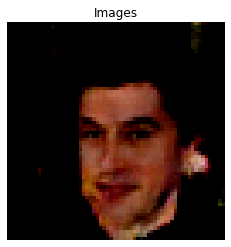

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


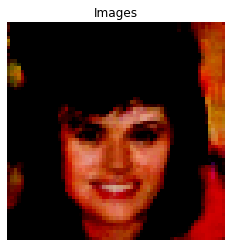

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


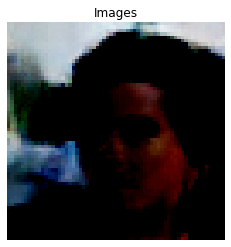

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


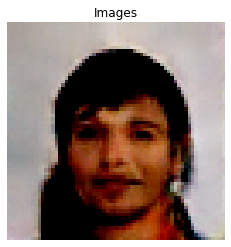

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


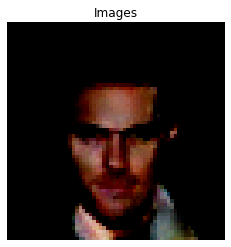

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


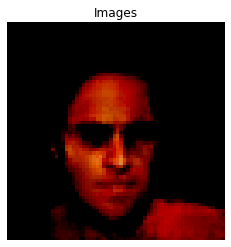

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


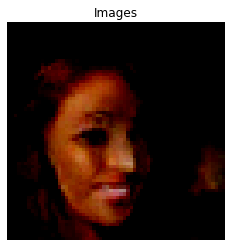

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


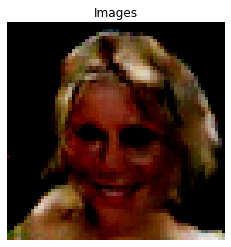

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


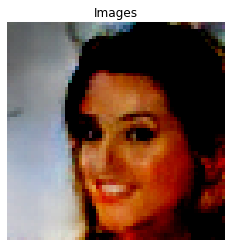

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


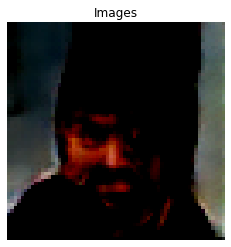

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


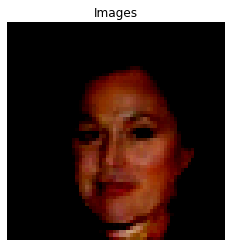

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


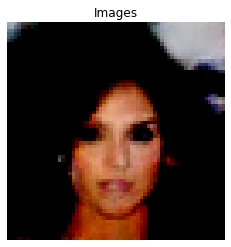

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


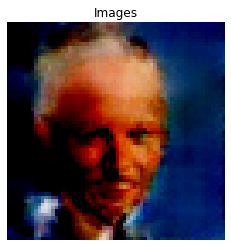

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


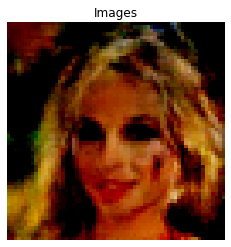

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


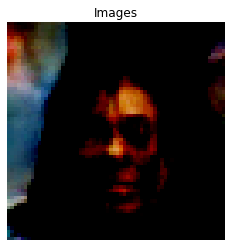

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


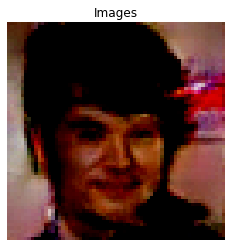

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


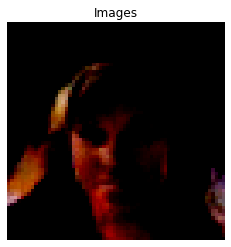

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


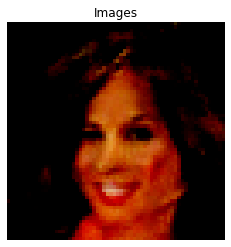

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


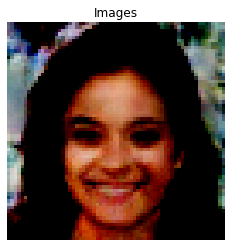

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


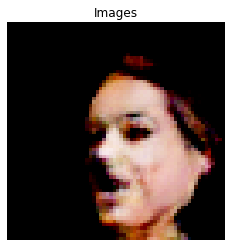

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


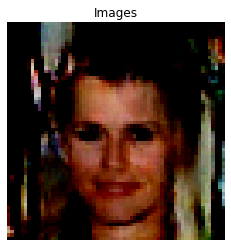

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


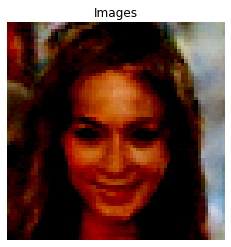

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


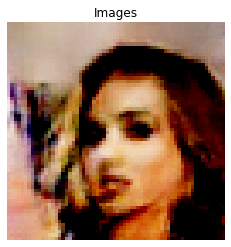

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


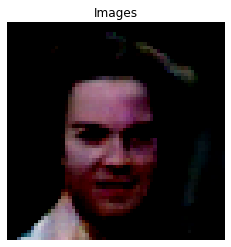

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


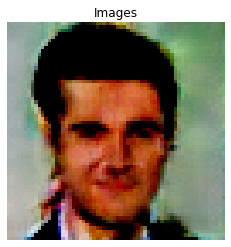

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


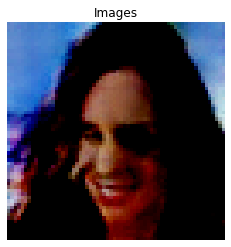

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


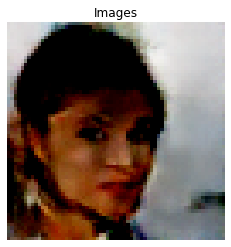

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


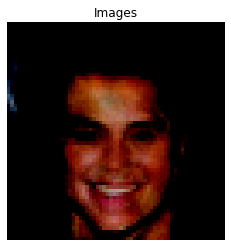

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


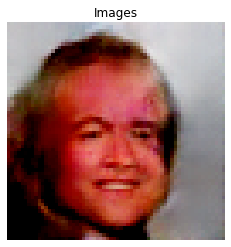

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


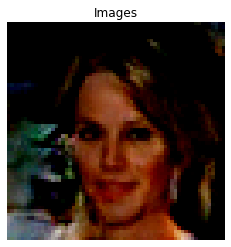

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


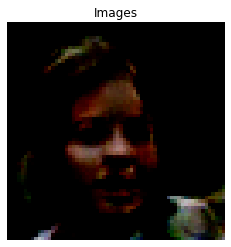

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


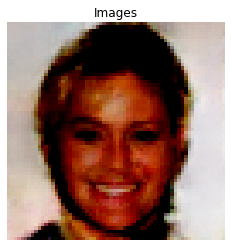

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


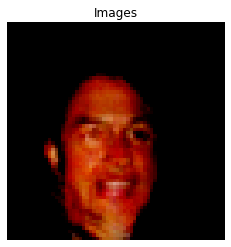

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


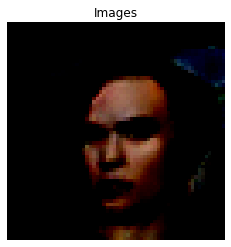

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


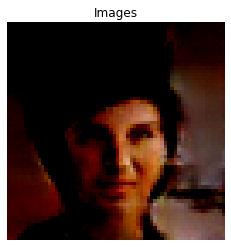

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


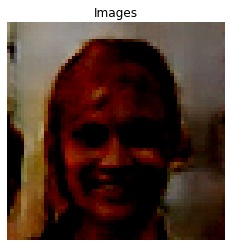

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


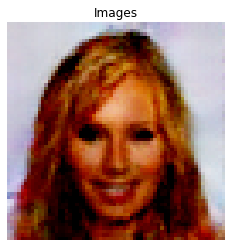

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


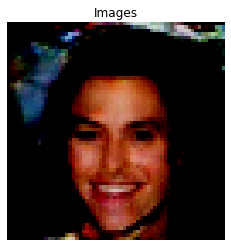

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


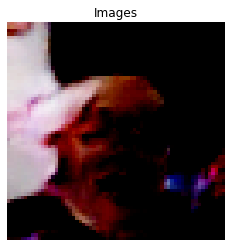

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


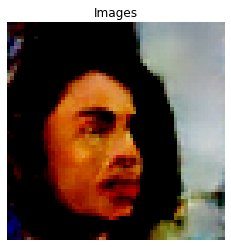

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


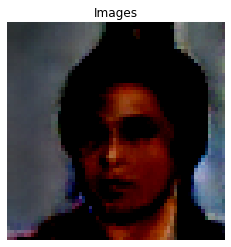

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


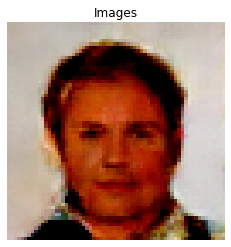

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


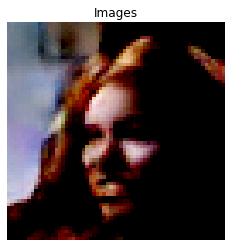

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


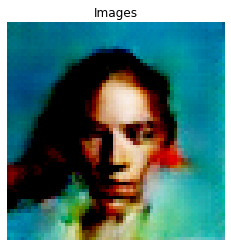

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


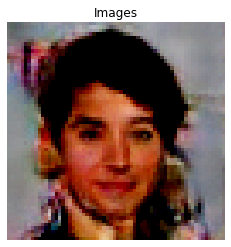

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


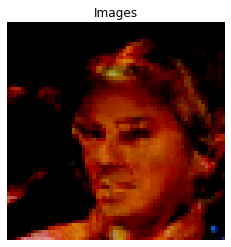

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


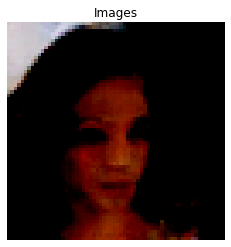

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


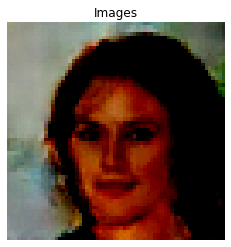

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


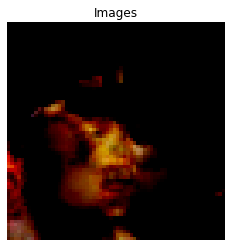

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


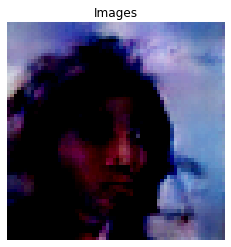

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


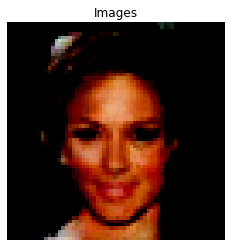

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


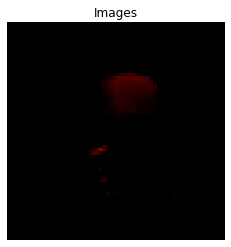

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


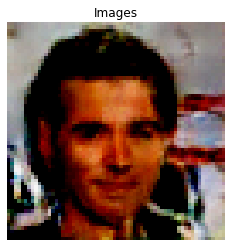

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


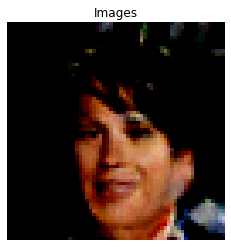

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


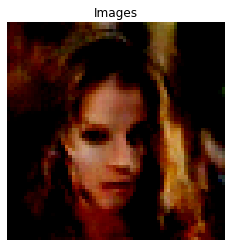

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


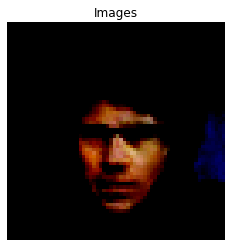

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


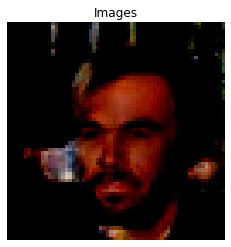

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


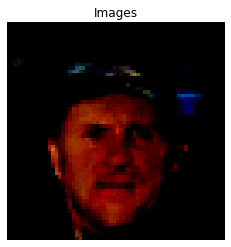

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


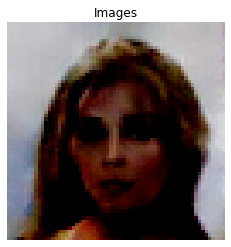

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


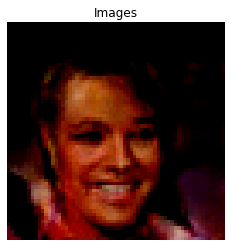

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


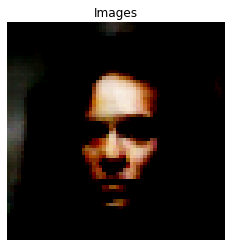

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


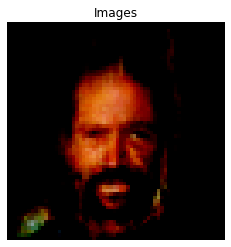

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


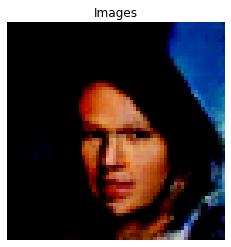

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


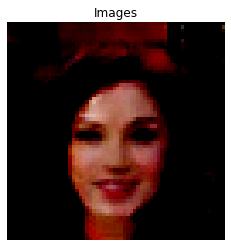

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


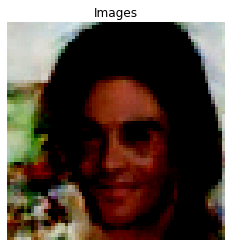

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


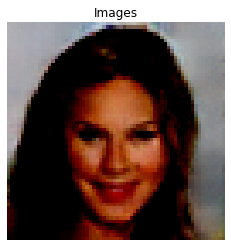

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


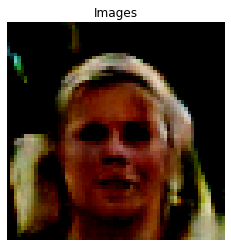

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


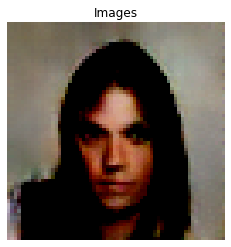

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


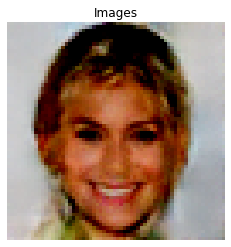

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


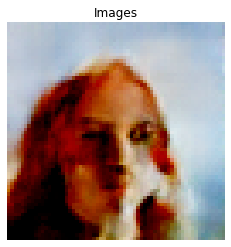

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


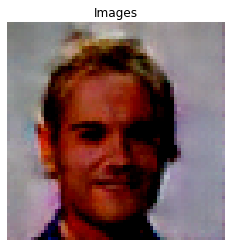

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


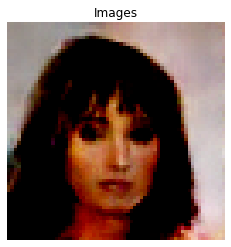

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


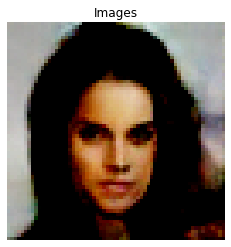

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


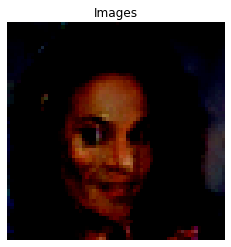

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


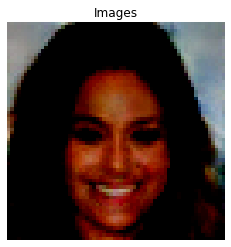

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


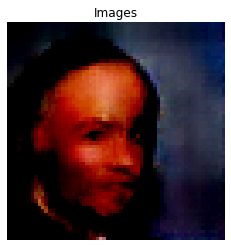

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


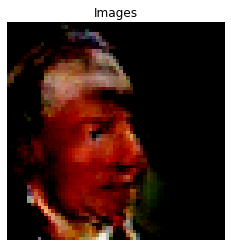

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


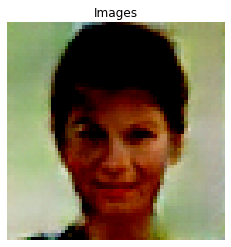

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


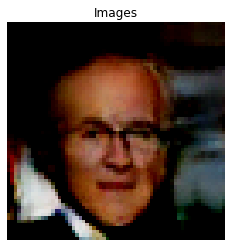

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


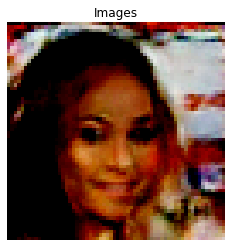

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


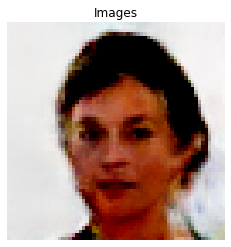

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


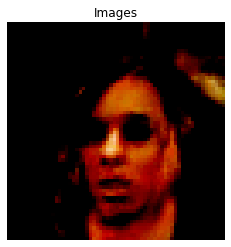

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


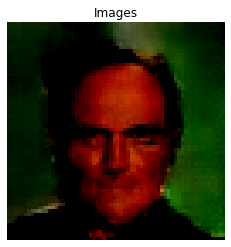

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


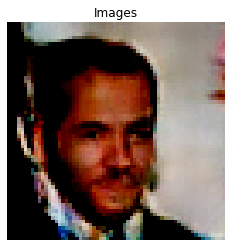

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


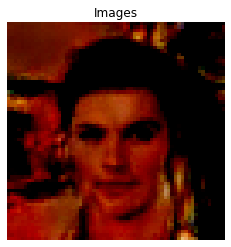

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


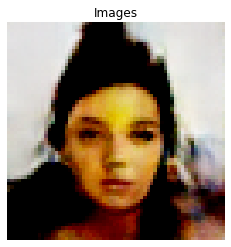

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


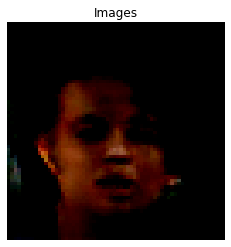

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


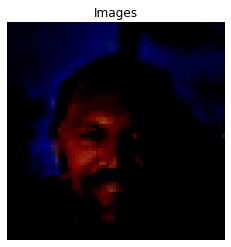

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


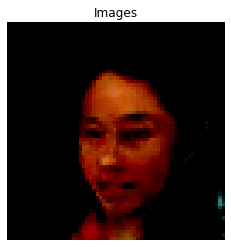

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


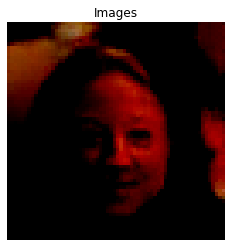

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


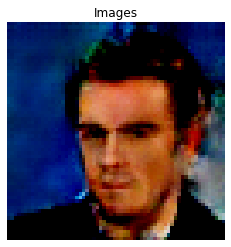

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


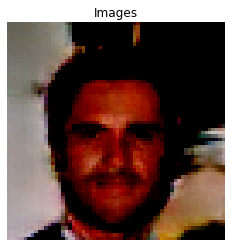

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


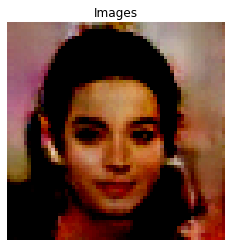

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


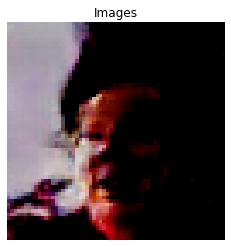

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


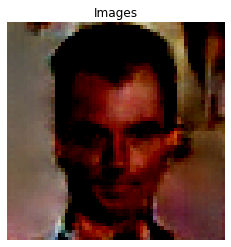

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


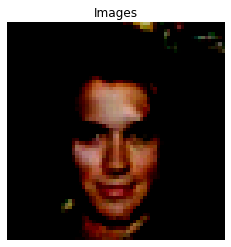

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


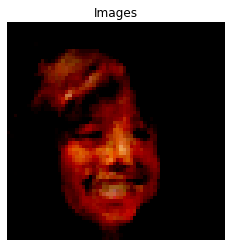

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


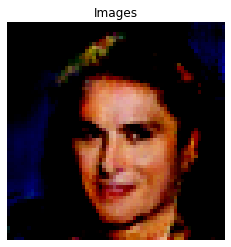

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


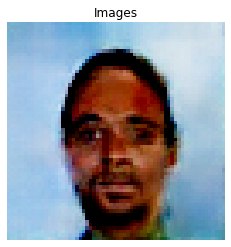

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


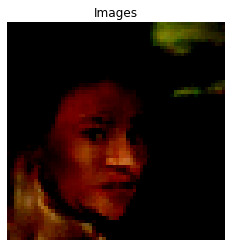

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


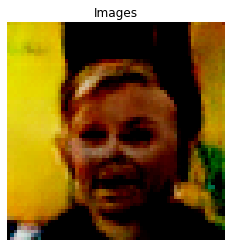

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


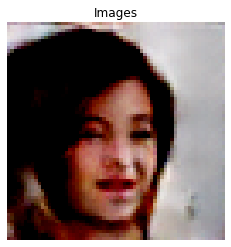

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


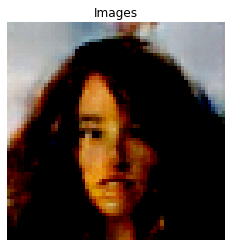

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


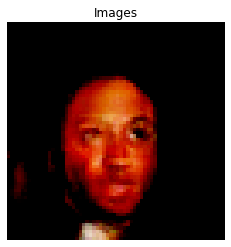

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


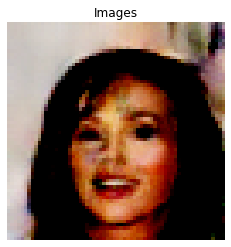

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


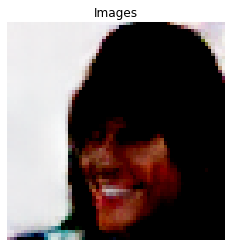

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


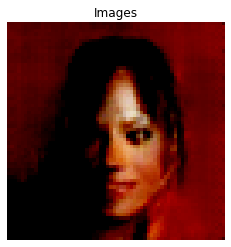

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


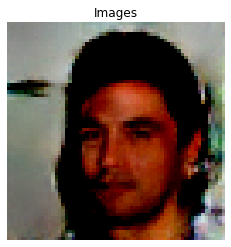

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


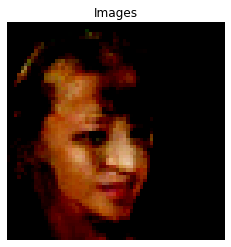

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


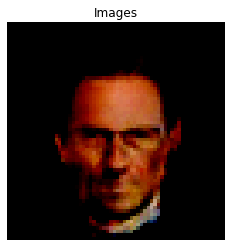

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


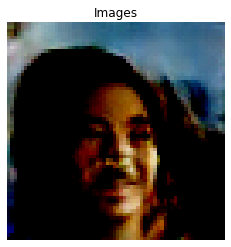

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


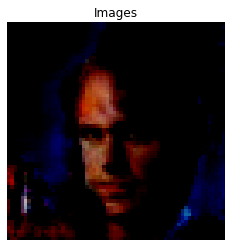

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


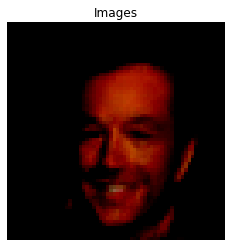

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


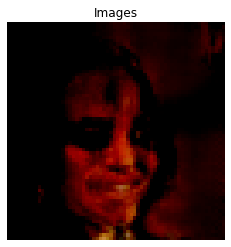

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


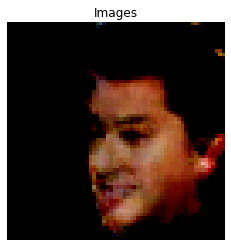

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


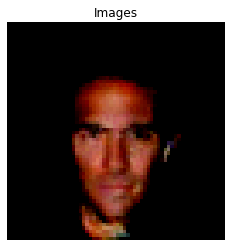

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


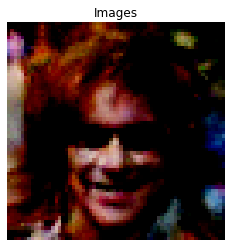

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


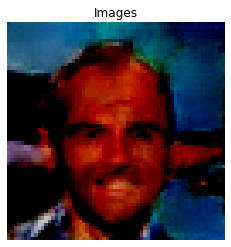

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


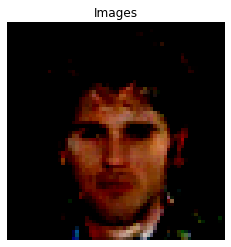

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


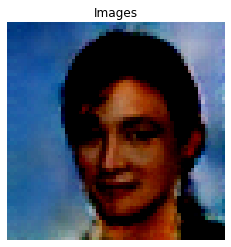

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


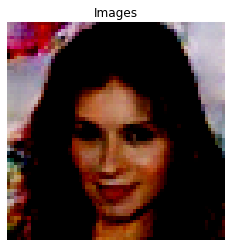

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


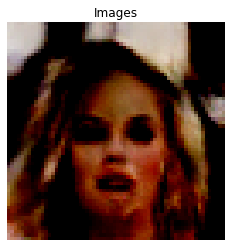

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


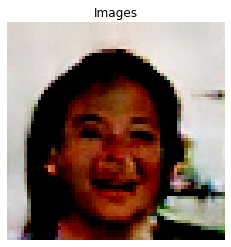

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


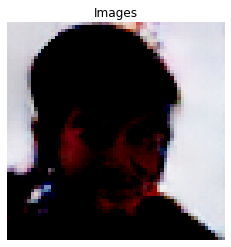

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


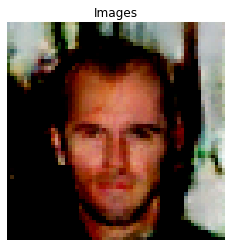

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


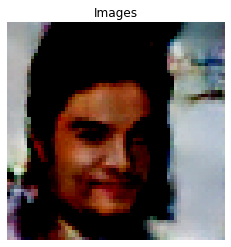

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


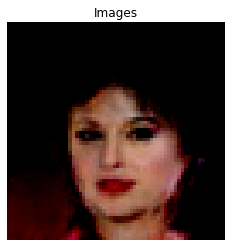

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


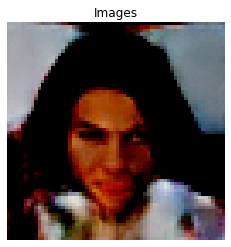

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


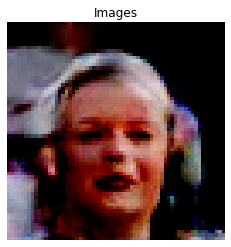

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


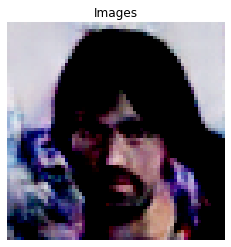

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


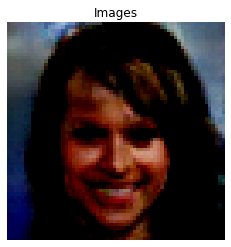

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


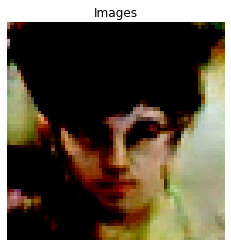

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


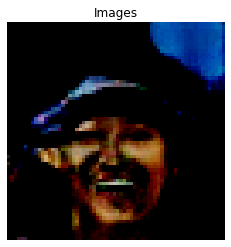

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


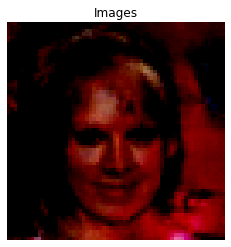

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


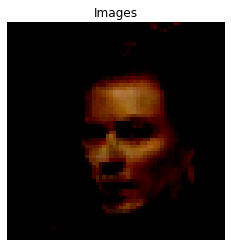

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


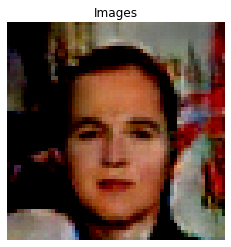

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


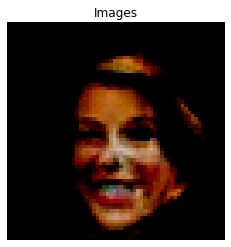

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


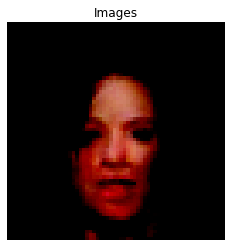

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


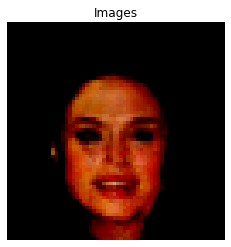

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


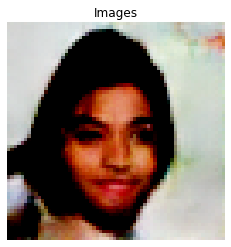

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


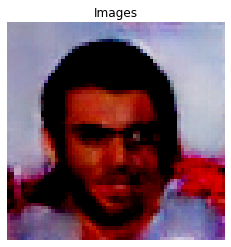

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


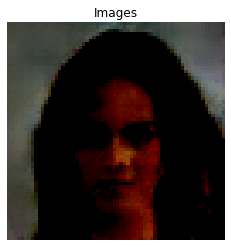

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


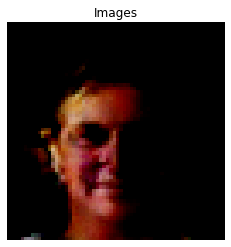

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


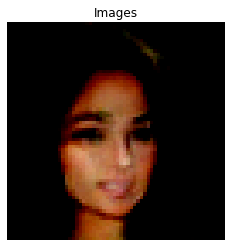

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


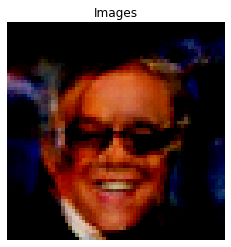

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


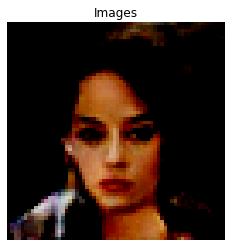

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


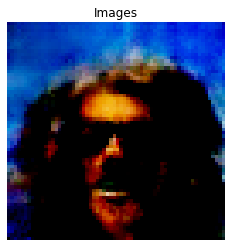

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


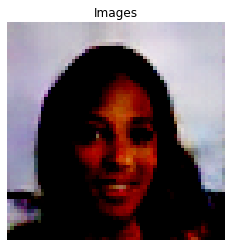

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


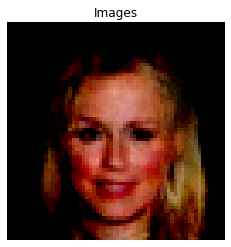

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


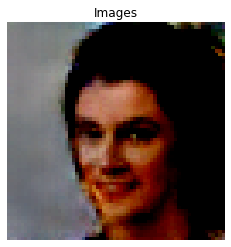

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


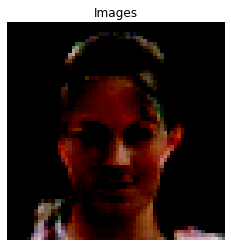

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


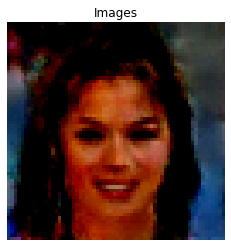

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


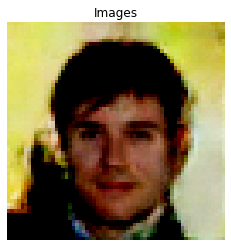

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


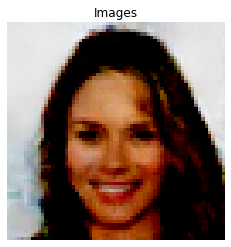

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


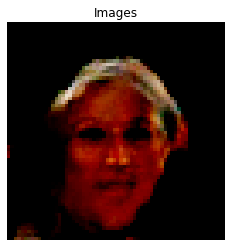

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


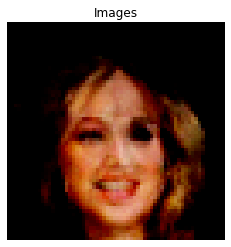

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


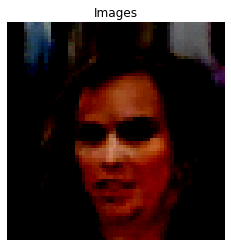

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


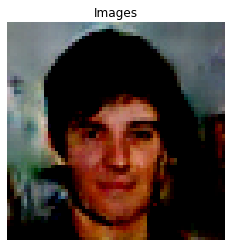

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


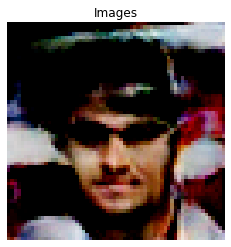

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


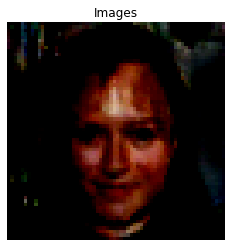

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


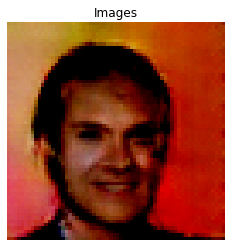

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


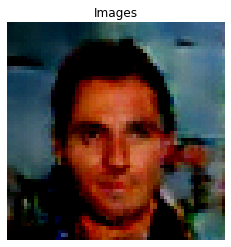

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


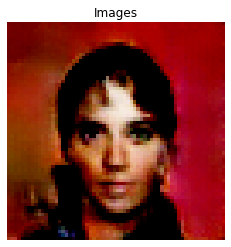

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


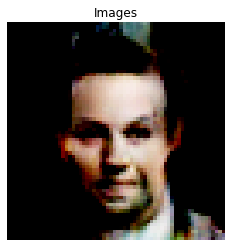

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


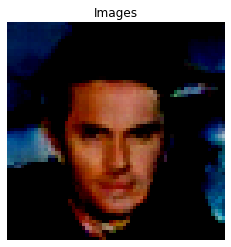

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


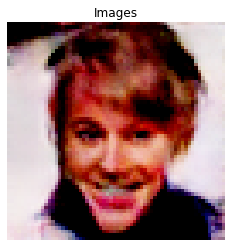

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


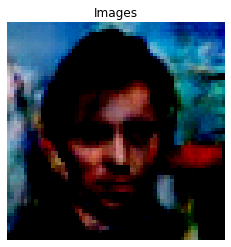

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


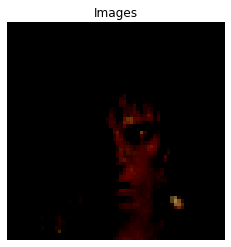

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


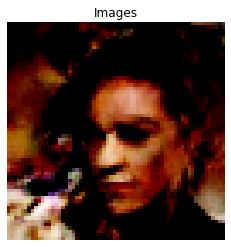

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


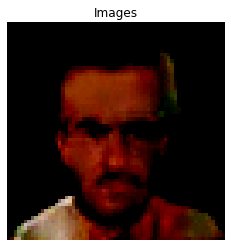

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


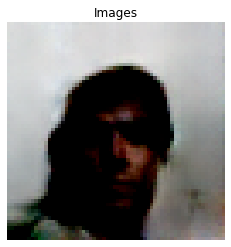

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


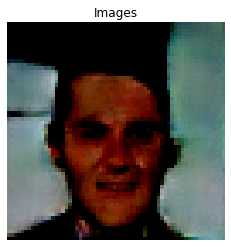

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


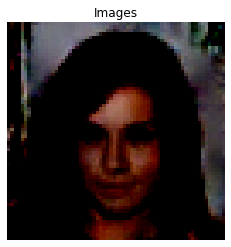

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


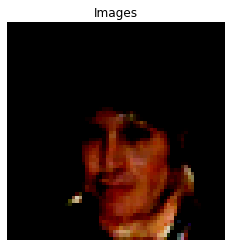

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


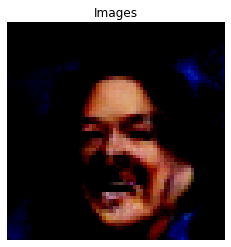

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


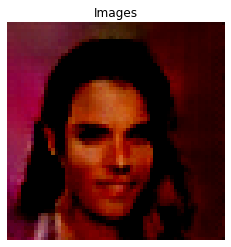

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


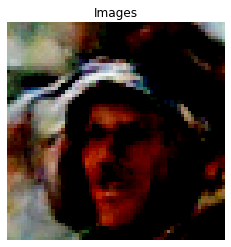

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


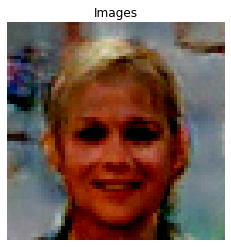

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


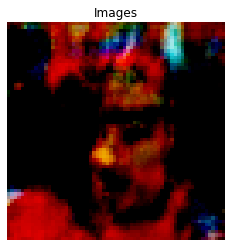

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


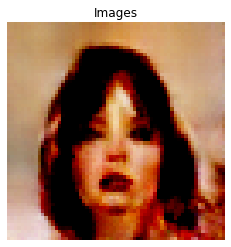

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


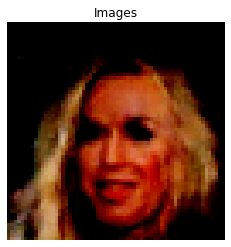

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


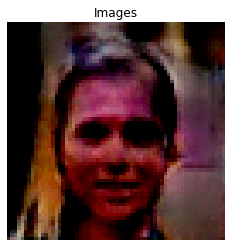

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


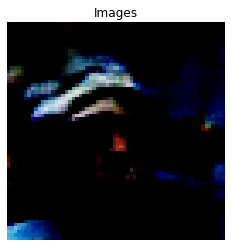

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


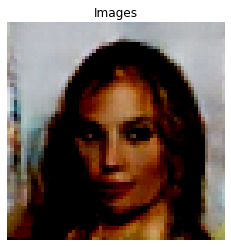

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


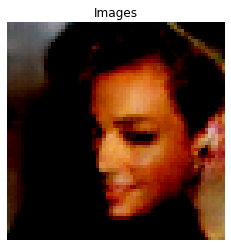

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


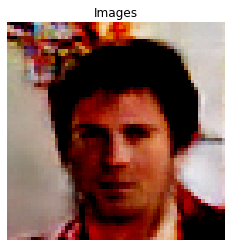

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


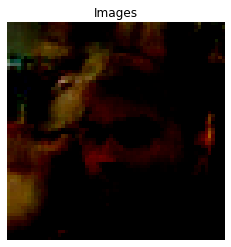

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


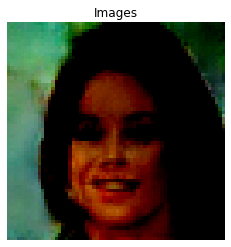

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


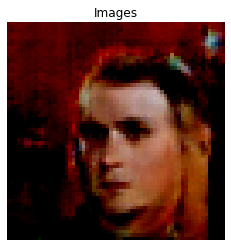

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


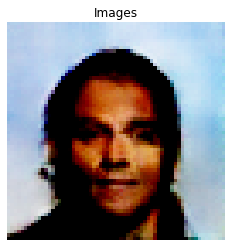

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


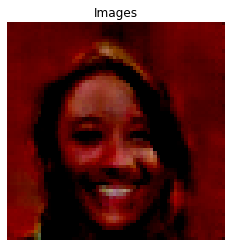

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


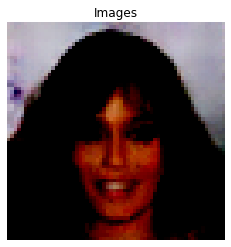

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


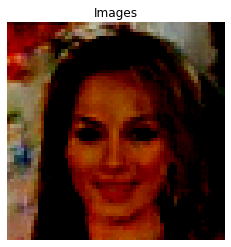

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


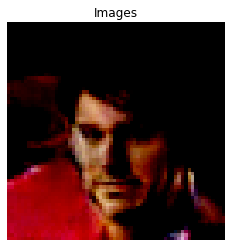

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


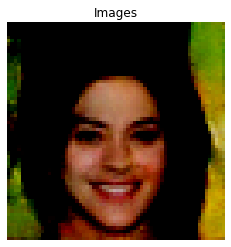

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


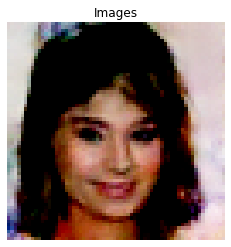

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


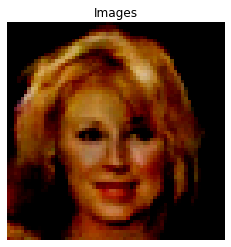

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


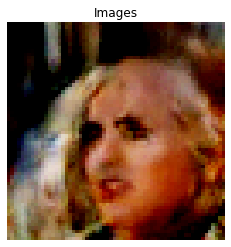

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


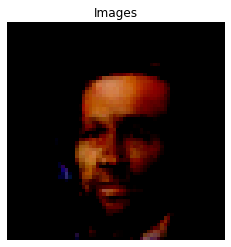

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


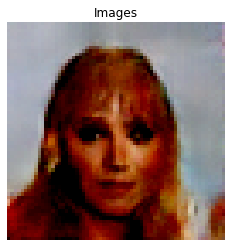

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


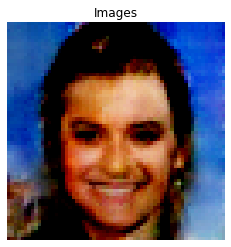

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


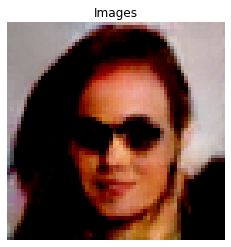

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


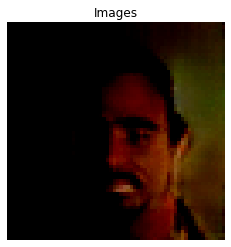

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


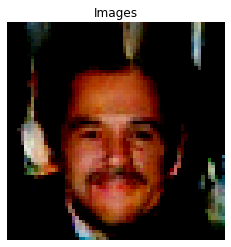

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


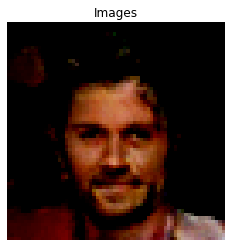

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


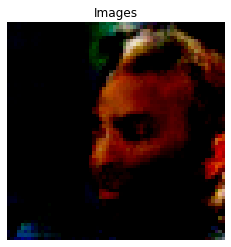

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


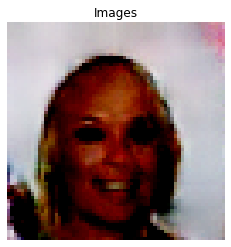

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


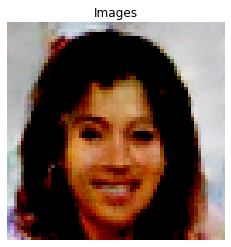

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


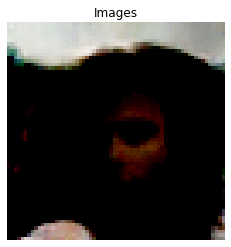

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


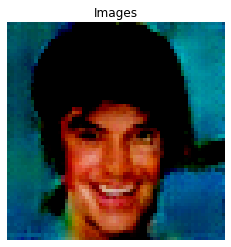

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


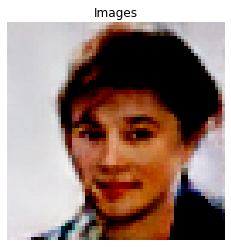

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


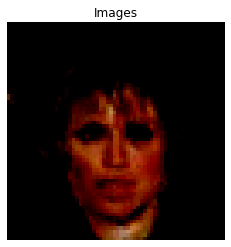

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


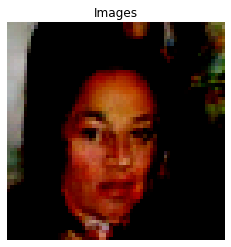

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


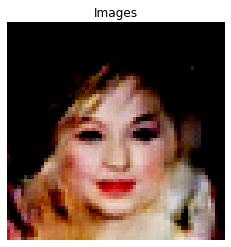

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


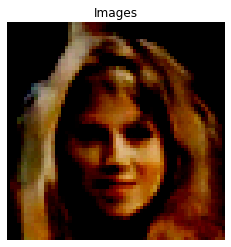

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


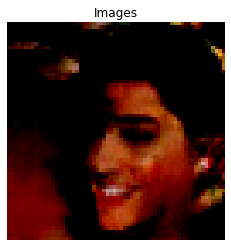

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


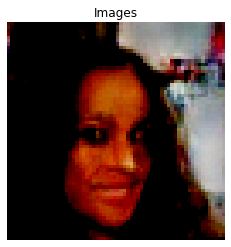

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


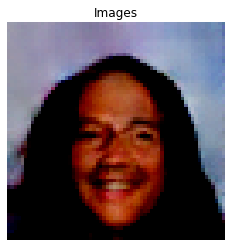

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


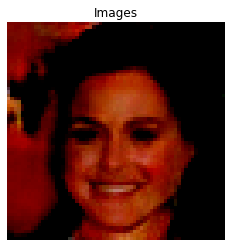

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


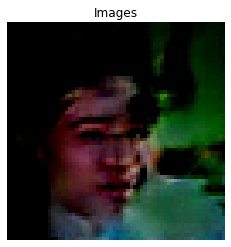

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


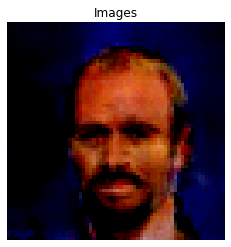

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


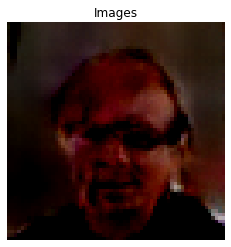

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


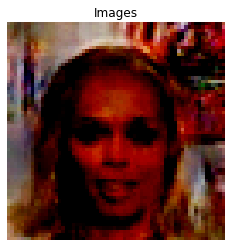

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


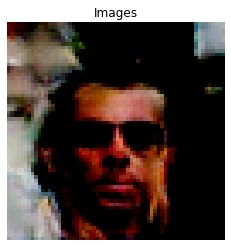

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


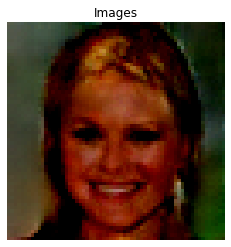

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


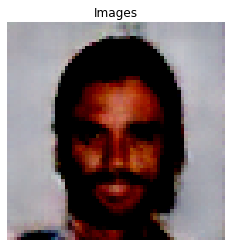

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


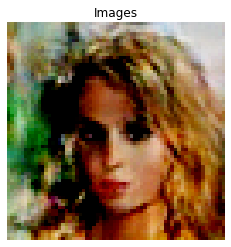

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


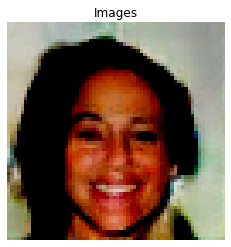

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


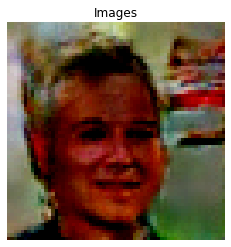

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


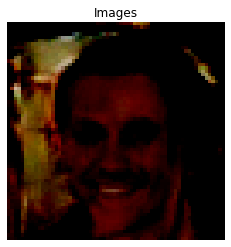

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


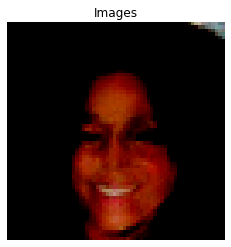

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


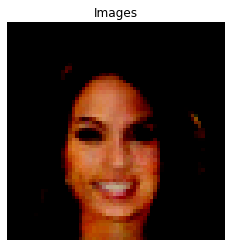

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


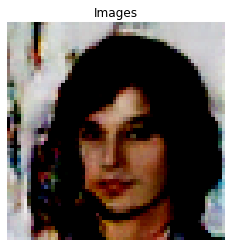

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


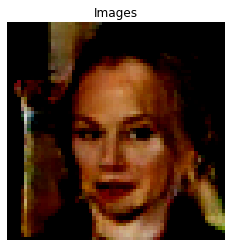

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


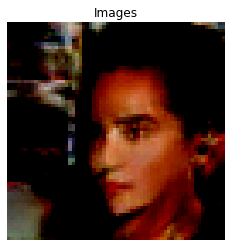

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


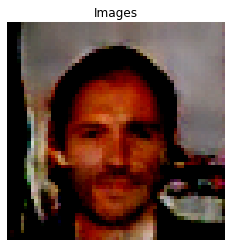

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


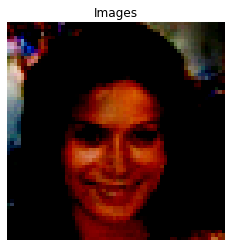

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


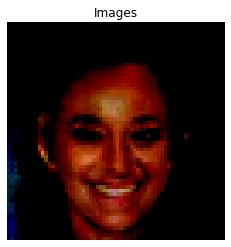

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


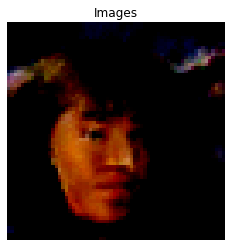

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


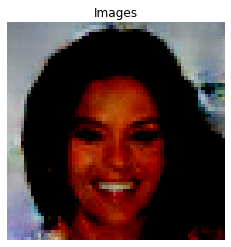

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


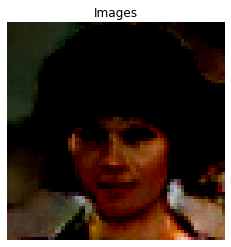

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


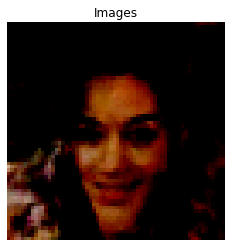

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


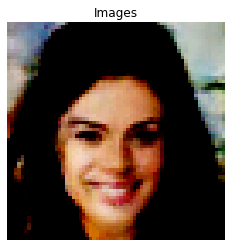

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


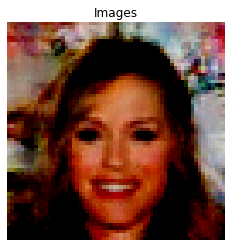

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


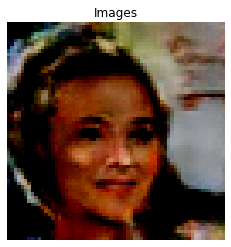

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


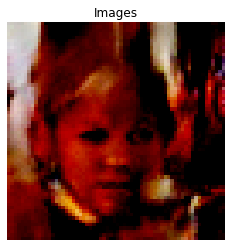

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


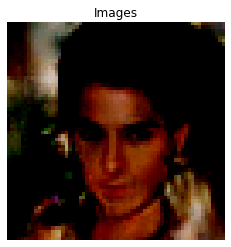

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


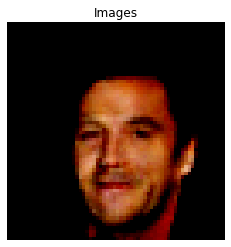

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


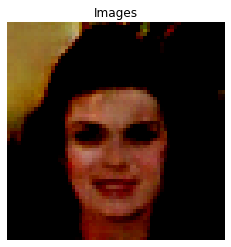

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


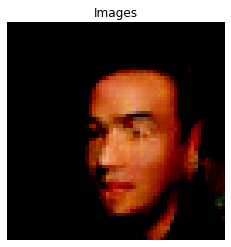

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


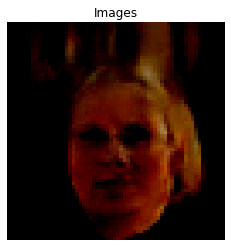

In [0]:
with torch.no_grad():
  for i in range(1000) :
    generated_data = generator(noise(1).detach())
    imshow(torchvision.utils.make_grid(vectors_to_images(generated_data)))
  